# <font color='green'>Projet 4 : Segmentez des clients d'un site e-commerce</font>

# Partie 2 : Modèlisation

In [2]:
# importation des librairies

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
import statsmodels.api as sm
import plotly
import plotly.express as px
from datetime import timedelta
from scipy import stats
from math import pi
from sklearn.preprocessing import StandardScaler, PowerTransformer, \
    MinMaxScaler, RobustScaler, OneHotEncoder
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn import decomposition
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.cluster import InterclusterDistance
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import davies_bouldin_score, silhouette_score, \
    calinski_harabasz_score
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer

## Sommaire

1. Objectifs
2. Données
3. Modélisation RFM
4. Modélisation K-means
5. Modélisation : Hierarchical Clustering
6. Modélisation DBSCAN
7. Stabilité des clusters

## 1. Objectifs

Vous êtes consultant pour Olist, une entreprise brésilienne qui propose une solution de vente sur les marketplaces en ligne.

Olist souhaite que vous fournissiez à ses équipes d'e-commerce une segmentation des clients qu’elles pourront utiliser au quotidien pour leurs campagnes de communication.

Votre objectif est de comprendre les différents types d’utilisateurs grâce à leur comportement et à leurs données personnelles.

Vous devrez fournir à l’équipe marketing une description actionable de votre segmentation et de sa logique sous-jacente pour une utilisation optimale, ainsi qu’une proposition de contrat de maintenance basée sur une analyse de la stabilité des segments au cours du temps.

## 2. Données

Pour cette mission, Olist vous fournit une base de données anonymisée comportant des informations sur l’historique de commandes, les produits achetés, les commentaires de satisfaction, et la localisation des clients depuis janvier 2017.
Notes :
- Une commande peut avoir plusieurs articles.
- Chaque article peut être traité par un vendeur distinct.
- Tous les textes identifiant les magasins et les partenaires ont été remplacés par les noms des grandes maisons de Game of Thrones.

### Chargement des données :

In [3]:
# chargement des fichiers (tous les clients)

df = pd.read_csv('C:\\Users\\mfila\\df_client_full_model.csv')

### Contenu

In [4]:
# 2 premières lignes

df.head(2)

,customer_unique_id,last_purchase_date,recency,frequency,mean_price,sum_price,geolocation_lat,geolocation_lng,mean_delivery_days,mean_delivery_late,avg_review_score,mean_n_item,main_product_category,main_payment_type,mean_payment_installments,customer_city
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,112,1,141.90,141.90,-23.340235,-46.830140,6.0,False,5.0,1.0,home,credit_card,8.0,cajamar
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,115,1,27.19,27.19,-23.559115,-46.787626,3.0,False,4.0,1.0,health_beauty,credit_card,1.0,osasco


In [5]:
# vérification du remplissage, des variables, des types de colonnes

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91211 entries, 0 to 91210
Data columns (total 16 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   customer_unique_id         91211 non-null  object 
 1   last_purchase_date         91211 non-null  object 
 2   recency                    91211 non-null  int64  
 3   frequency                  91211 non-null  int64  
 4   mean_price                 91211 non-null  float64
 5   sum_price                  91211 non-null  float64
 6   geolocation_lat            91211 non-null  float64
 7   geolocation_lng            91211 non-null  float64
 8   mean_delivery_days         91211 non-null  float64
 9   mean_delivery_late         91211 non-null  bool   
 10  avg_review_score           91211 non-null  float64
 11  mean_n_item                91211 non-null  float64
 12  main_product_category      91211 non-null  object 
 13  main_payment_type          91211 non-null  obj

In [6]:
df.describe()

,recency,frequency,mean_price,sum_price,geolocation_lat,geolocation_lng,mean_delivery_days,avg_review_score,mean_n_item,mean_payment_installments
count,91211.000000,91211.000000,91211.000000,91211.000000,91211.000000,91211.000000,91211.000000,91211.000000,91211.000000,91211.000000
mean,237.108353,1.032847,157.568173,211.155994,-21.192120,-46.189440,12.048052,4.154532,1.070697,2.903387
std,152.573846,0.206186,211.087742,518.495029,5.612197,4.057539,9.456024,1.279275,0.265898,2.680300
min,1.000000,1.000000,1.856818,9.590000,-33.689948,-72.668881,0.000000,1.000000,1.000000,0.000000
25%,114.000000,1.000000,60.750000,63.830000,-23.590247,-48.124815,6.000000,4.000000,1.000000,1.000000
50%,218.000000,1.000000,103.486667,112.880000,-22.924015,-46.632948,10.000000,5.000000,1.000000,2.000000
75%,345.000000,1.000000,174.960000,202.760000,-20.138476,-43.629330,15.000000,5.000000,1.000000,4.000000
max,695.000000,14.000000,7274.880000,44048.000000,42.184003,-8.723762,208.000000,5.000000,11.000000,24.000000


### Création des dataframes de modélisation

Création du 
- dataframe 1 : 3 variables numériques RFM
- dataframe 2 : RFM + autres variables numériques (details de livraison, note de satisfaction, nombre d'articles par commmande etc)
- dataframe 3 : variables RFM + autres variables numériques + variables catégorielles

In [7]:
# création du dataframe 1 : variables RFM

df1 = df[['customer_unique_id','recency','frequency','mean_price']]

In [8]:
df1 = df1.set_index('customer_unique_id')

In [9]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 91211 entries, 0000366f3b9a7992bf8c76cfdf3221e2 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   recency     91211 non-null  int64  
 1   frequency   91211 non-null  int64  
 2   mean_price  91211 non-null  float64
dtypes: float64(1), int64(2)
memory usage: 2.8+ MB


In [10]:
df1.head(2)

,recency,frequency,mean_price
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90
0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19


In [11]:
# création du dataframe 2 : variables RFM + autres varibles numériques

df2 = df[['customer_unique_id', 'recency', 'frequency',
       'mean_price','sum_price', 'mean_delivery_days', 'mean_delivery_late',
       'avg_review_score', 'mean_n_item', 'mean_payment_installments']]

In [12]:
df2 = df2.set_index('customer_unique_id')

In [13]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 91211 entries, 0000366f3b9a7992bf8c76cfdf3221e2 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 9 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   recency                    91211 non-null  int64  
 1   frequency                  91211 non-null  int64  
 2   mean_price                 91211 non-null  float64
 3   sum_price                  91211 non-null  float64
 4   mean_delivery_days         91211 non-null  float64
 5   mean_delivery_late         91211 non-null  bool   
 6   avg_review_score           91211 non-null  float64
 7   mean_n_item                91211 non-null  float64
 8   mean_payment_installments  91211 non-null  float64
dtypes: bool(1), float64(6), int64(2)
memory usage: 6.3+ MB


In [14]:
df2.head(2)

,recency,frequency,mean_price,sum_price,mean_delivery_days,mean_delivery_late,avg_review_score,mean_n_item,mean_payment_installments
customer_unique_id,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,141.90,6.0,False,5.0,1.0,8.0
0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,27.19,3.0,False,4.0,1.0,1.0


In [15]:
# création du dataframe 3 : variables RFM + autres variables numériques + categorielles

df3 = df[['customer_unique_id', 'recency', 'frequency',
       'mean_price','sum_price', 'mean_delivery_days', 'mean_delivery_late',
       'avg_review_score', 'mean_n_item', 'mean_payment_installments','main_product_category', 'main_payment_type']]

In [16]:
df3 = df3.set_index('customer_unique_id')

In [17]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 91211 entries, 0000366f3b9a7992bf8c76cfdf3221e2 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   recency                    91211 non-null  int64  
 1   frequency                  91211 non-null  int64  
 2   mean_price                 91211 non-null  float64
 3   sum_price                  91211 non-null  float64
 4   mean_delivery_days         91211 non-null  float64
 5   mean_delivery_late         91211 non-null  bool   
 6   avg_review_score           91211 non-null  float64
 7   mean_n_item                91211 non-null  float64
 8   mean_payment_installments  91211 non-null  float64
 9   main_product_category      91211 non-null  object 
 10  main_payment_type          91211 non-null  object 
dtypes: bool(1), float64(6), int64(2), object(2)
memory usage: 7.7+ MB


In [18]:
df3.head(2)

,recency,frequency,mean_price,sum_price,mean_delivery_days,mean_delivery_late,avg_review_score,mean_n_item,mean_payment_installments,main_product_category,main_payment_type
customer_unique_id,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,141.90,6.0,False,5.0,1.0,8.0,home,credit_card
0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,27.19,3.0,False,4.0,1.0,1.0,health_beauty,credit_card


## 3. Modélisation : RFM

Quantile de calcul des valeurs RFM.
Les clients ayant la plus faible récence, la fréquence la plus élevée et les montants monétaires considérés comme les meilleurs clients.

In [19]:
# calcul des quantiles

df_rfm = df1.copy()
df_rfm['r_quartile'] = pd.qcut(df_rfm['recency'], 5, ['5','4','3','2','1'])
df_rfm['f_quartile'] = pd.qcut(df_rfm['frequency'].rank(method="first"), 5, ['1','2','3','4','5'])
df_rfm['m_quartile'] = pd.qcut(df_rfm['mean_price'], 5, ['1','2','3','4','5'])

In [20]:
# Combinez les trois quartiles (r_quartile,f_quartile,m_quartile) dans une seule colonne, 
# ce classement aidera à segmenter le groupe de clients

df_rfm['RFM_Score'] = df_rfm.r_quartile.astype(str)+ df_rfm.f_quartile.astype(str) + df_rfm.m_quartile.astype(str)
df_rfm.head()

,recency,frequency,mean_price,r_quartile,f_quartile,m_quartile,RFM_Score
customer_unique_id,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,4,1,4,414
0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,4,1,1,411
0000f46a3911fa3c0805444483337064,537,1,86.22,1,1,3,113
0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,2,1,1,211
0004aac84e0df4da2b147fca70cf8255,288,1,196.89,2,1,4,214


In [21]:
# Top clients

df_rfm[df_rfm['RFM_Score']=='555'].sort_values('mean_price', ascending=False).head()

,recency,frequency,mean_price,r_quartile,f_quartile,m_quartile,RFM_Score
customer_unique_id,,,,,,,
edde2314c6c30e864a128ac95d6b2112,26,1,4513.32,5,5,5,555
f886a3f43af9ac928fbb4b56436c528c,15,1,3076.13,5,5,5,555
fff5eb4918b2bf4b2da476788d42051c,58,1,2844.96,5,5,5,555
f140f377d666848e3712b51a2734d120,31,1,2713.36,5,5,5,555
e6fad5b1c79a4760aac5068d09c46535,4,1,2328.40,5,5,5,555


Source: https://documentation.bloomreach.com/engagement/docs/rfm-segmentation

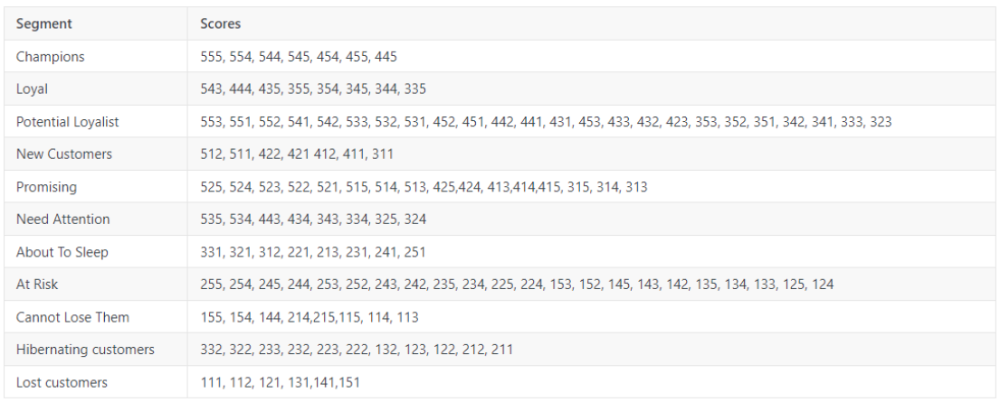

In [22]:
seg_map= {
    r'111|112|121|131|141|151': 'Lost customers',
    r'332|322|233|232|223|222|132|123|122|212|211': 'Hibernating customers', 
    r'155|154|144|214|215|115|114|113': 'Cannot Lose Them',
    r'255|254|245|244|253|252|243|242|235|234|225|224|153|152|145|143|142|135|134|133|125|124': 'At Risk',
    r'331|321|312|221|213|231|241|251': 'About To Sleep',
    r'535|534|443|434|343|334|325|324': 'Need Attention',
    r'525|524|523|522|521|515|514|513|425|424|413|414|415|315|314|313': 'Promising',
    r'512|511|422|421|412|411|311': 'New Customers',
    r'553|551|552|541|542|533|532|531|452|451|442|441|431|453|433|432|423|353|352|351|342|341|333|323': 'Potential Loyalist',
    r'543|444|435|355|354|345|344|335': 'Loyal',
    r'555|554|544|545|454|455|445': 'Champions'
}

In [23]:
df_rfm['Segment'] = df_rfm['r_quartile'].astype(str) + df_rfm['f_quartile'].astype(str) + df_rfm['m_quartile'].astype(str)
df_rfm['Segment'] = df_rfm['Segment'].replace(seg_map, regex=True)
df_rfm.head()

,recency,frequency,mean_price,r_quartile,f_quartile,m_quartile,RFM_Score,Segment
customer_unique_id,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,4,1,4,414,Promising
0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,4,1,1,411,New Customers
0000f46a3911fa3c0805444483337064,537,1,86.22,1,1,3,113,Cannot Lose Them
0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,2,1,1,211,Hibernating customers
0004aac84e0df4da2b147fca70cf8255,288,1,196.89,2,1,4,214,Cannot Lose Them


In [24]:
df_rfm['Segment'].unique()

array(['Promising', 'New Customers', 'Cannot Lose Them',
       'Hibernating customers', 'Lost customers', 'About To Sleep',
       'Loyal', 'At Risk', 'Potential Loyalist', 'Champions',
       'Need Attention'], dtype=object)

In [25]:
df_rfm['Segment'].nunique()

11

In [26]:
RFMStats = df_rfm[["Segment", "recency", "frequency", "mean_price"]].groupby("Segment").agg(['mean','median', 'min', 'max', 'count'])
RFMStats

recency                         frequency         \
                             mean median  min  max  count      mean median   
Segment                                                                      
About To Sleep         276.960377  278.0  177  381   5628  1.013504      1   
At Risk                385.506039  366.0  269  695  15896  1.043470      1   
Cannot Lose Them       434.300704  436.5  269  695   5680  1.027289      1   
Champions               83.612509   80.0    1  176   5324  1.108189      1   
Hibernating customers  341.419335  324.0  177  695   8120  1.000000      1   
Lost customers         474.313976  468.0  382  695   4615  1.022102      1   
Loyal                  175.920280  190.0    1  268   5858  1.047969      1   
Need Attention         154.545983  175.0    1  268   5676  1.000000      1   
New Customers          123.119005  126.0    1  268   4983  1.000000      1   
Potential Loyalist     130.538803  130.0    1  268  17563  1.063486      1   
Promising              105.577098   92.0    1  268  11868  1.000000      1   

                                      mean_price                       \
                      min max  count        mean   median         min   
Segment                                                                 
About To Sleep          1   3   5628   49.332675   42.770    3.776667   
At Risk                 1   4  15896  213.865280  144.890   53.150000   
Cannot Lose Them        1   4   5680  254.005861  175.280   83.800000   
Champions               1   7   5324  307.296176  212.055  126.540000   
Hibernating customers   1   1   8120   74.806865   71.920    4.464000   
Lost customers          1   6   4615   42.608662   41.090    2.410769   
Loyal                   1   9   5858  270.155690  198.130   83.870000   
Need Attention          1   1   5676  213.576917  157.790   83.800000   
New Customers           1   1   4983   50.333004   48.310    1.856818   
Potential Loyalist      1  14  17563   70.325825   68.040    4.242500   
Promising               1   1  11868  213.267489  151.325    5.572500   

                                       
                           max  count  
Segment                                
About To Sleep          126.48   5628  
At Risk                6081.54  15896  
Cannot Lose Them       6929.31   5680  
Champions              4513.32   5324  
Hibernating customers   126.54   8120  
Lost customers           83.69   4615  
Loyal                  3826.80   5858  
Need Attention         7274.88   5676  
New Customers            83.79   4983  
Potential Loyalist      126.54  17563  
Promising              4681.78  11868

In [27]:
RFMStats['Ratio']= (100*RFMStats['mean_price']["count"]/RFMStats['mean_price']["count"].sum()).round(2)
RFMStats

recency                         frequency         \
                             mean median  min  max  count      mean median   
Segment                                                                      
About To Sleep         276.960377  278.0  177  381   5628  1.013504      1   
At Risk                385.506039  366.0  269  695  15896  1.043470      1   
Cannot Lose Them       434.300704  436.5  269  695   5680  1.027289      1   
Champions               83.612509   80.0    1  176   5324  1.108189      1   
Hibernating customers  341.419335  324.0  177  695   8120  1.000000      1   
Lost customers         474.313976  468.0  382  695   4615  1.022102      1   
Loyal                  175.920280  190.0    1  268   5858  1.047969      1   
Need Attention         154.545983  175.0    1  268   5676  1.000000      1   
New Customers          123.119005  126.0    1  268   4983  1.000000      1   
Potential Loyalist     130.538803  130.0    1  268  17563  1.063486      1   
Promising              105.577098   92.0    1  268  11868  1.000000      1   

                                      mean_price                       \
                      min max  count        mean   median         min   
Segment                                                                 
About To Sleep          1   3   5628   49.332675   42.770    3.776667   
At Risk                 1   4  15896  213.865280  144.890   53.150000   
Cannot Lose Them        1   4   5680  254.005861  175.280   83.800000   
Champions               1   7   5324  307.296176  212.055  126.540000   
Hibernating customers   1   1   8120   74.806865   71.920    4.464000   
Lost customers          1   6   4615   42.608662   41.090    2.410769   
Loyal                   1   9   5858  270.155690  198.130   83.870000   
Need Attention          1   1   5676  213.576917  157.790   83.800000   
New Customers           1   1   4983   50.333004   48.310    1.856818   
Potential Loyalist      1  14  17563   70.325825   68.040    4.242500   
Promising               1   1  11868  213.267489  151.325    5.572500   

                                       Ratio  
                           max  count         
Segment                                       
About To Sleep          126.48   5628   6.17  
At Risk                6081.54  15896  17.43  
Cannot Lose Them       6929.31   5680   6.23  
Champions              4513.32   5324   5.84  
Hibernating customers   126.54   8120   8.90  
Lost customers           83.69   4615   5.06  
Loyal                  3826.80   5858   6.42  
Need Attention         7274.88   5676   6.22  
New Customers            83.79   4983   5.46  
Potential Loyalist      126.54  17563  19.26  
Promising              4681.78  11868  13.01

In [28]:
tab = RFMStats.reset_index()

In [29]:
tab = tab[['Segment','Ratio']]

In [30]:
tab.transpose().reset_index(level=0, drop=True).transpose()

,,
0,About To Sleep,6.17
1,At Risk,17.43
2,Cannot Lose Them,6.23
3,Champions,5.84
4,Hibernating customers,8.9
5,Lost customers,5.06
6,Loyal,6.42
7,Need Attention,6.22
8,New Customers,5.46
9,Potential Loyalist,19.26


In [31]:
tab.columns=['Segment','Ratio']

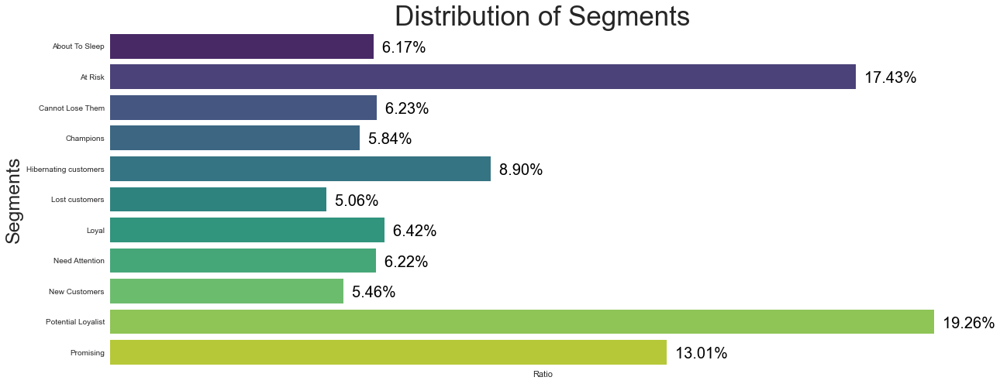

In [32]:
plt.figure(figsize=(20,8))
plt.rc('font', size=20)
per= sns.barplot(x=tab['Ratio'], y=tab['Segment'], data=tab, palette="viridis")
sns.despine(bottom = True, left = True)
for i, v in enumerate(RFMStats['Ratio']):
    per.text(v, i+.20,"  {:.2f}".format(v)+"%", color='black', ha="left")
per.set_ylabel('Segments', fontsize=25)
per.set(xticks=[])
plt.title('Distribution of Segments', fontsize=35)
plt.show()

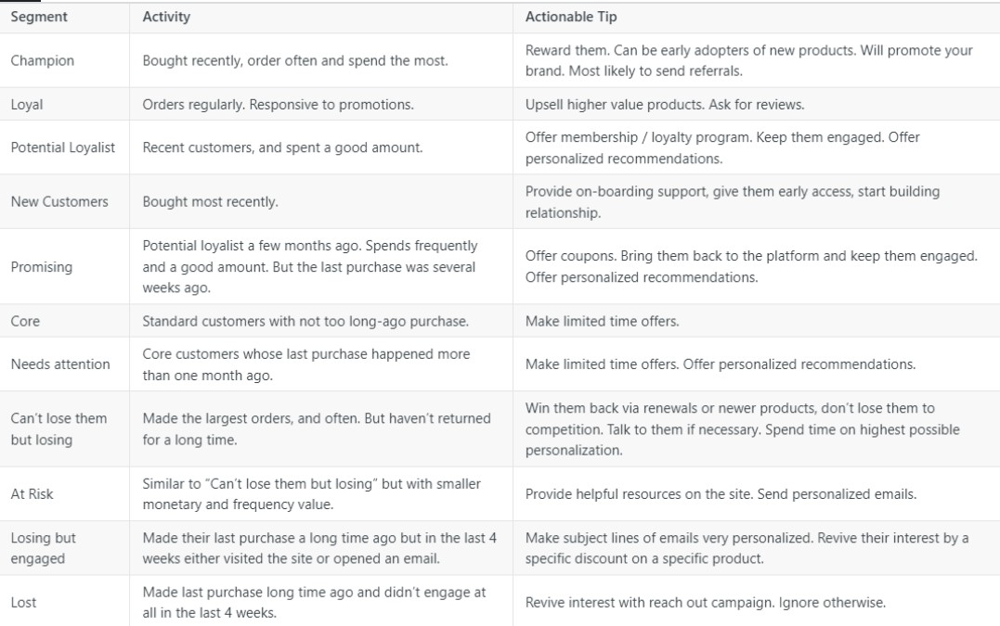

In [33]:
df_radar = df_rfm.copy()

In [34]:

df_radar[['r_quartile']] = df_radar[['r_quartile']].apply(pd.to_numeric)
                            
df_radar[['f_quartile']] = df_radar[['f_quartile']].apply(pd.to_numeric)
                            
df_radar[['m_quartile']] = df_radar[['m_quartile']].apply(pd.to_numeric)

In [35]:
df_radar

,recency,frequency,mean_price,r_quartile,f_quartile,m_quartile,RFM_Score,Segment
customer_unique_id,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,4,1,4,414,Promising
0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,4,1,1,411,New Customers
0000f46a3911fa3c0805444483337064,537,1,86.22,1,1,3,113,Cannot Lose Them
0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,2,1,1,211,Hibernating customers
0004aac84e0df4da2b147fca70cf8255,288,1,196.89,2,1,4,214,Cannot Lose Them
...,...,...,...,...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,447,1,2067.42,1,5,5,155,Cannot Lose Them
fffea47cd6d3cc0a88bd621562a9d061,262,1,84.58,3,5,3,353,Potential Loyalist
ffff371b4d645b6ecea244b27531430a,568,1,112.46,1,5,3,153,At Risk


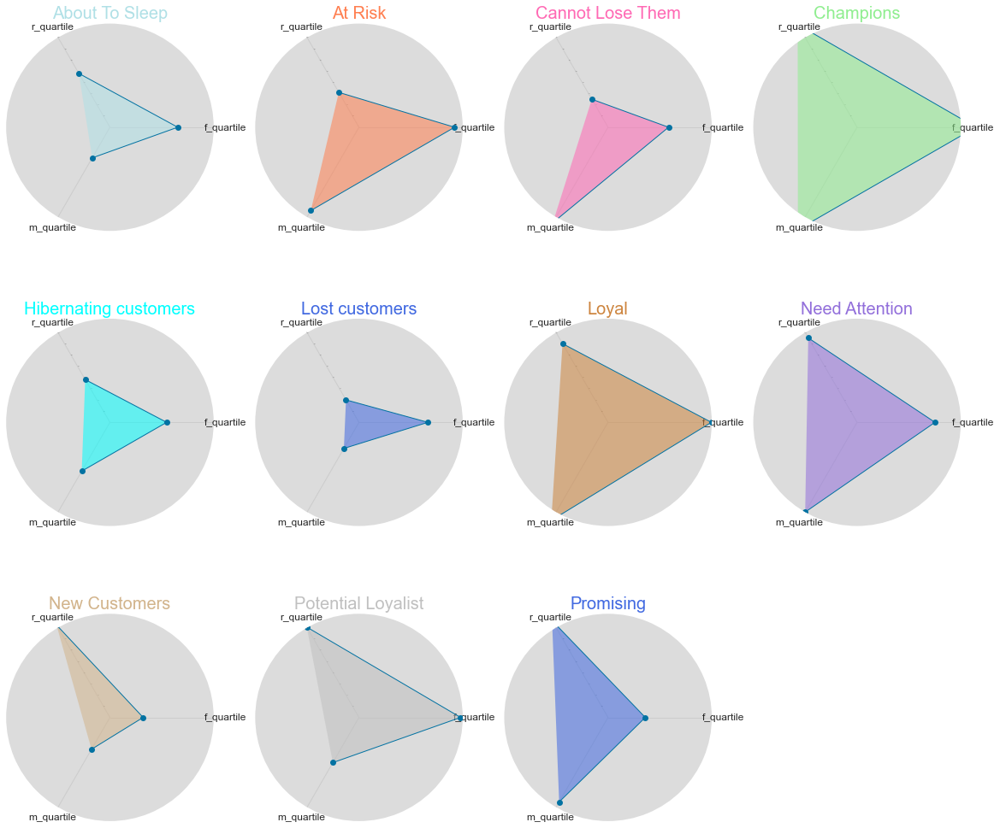

In [36]:
# Radarplot des différents types de client
# ---------------------------------------------------------------------

df_plot = df_radar.groupby('Segment')[['r_quartile', 'f_quartile', 'm_quartile']].mean()
plt.rc('axes', facecolor='Gainsboro')

# number of variable
categories = list(df_plot.columns)

N = len(categories)

# What will be the angle of each axis in the plot? (we divide the plot /
# number of variable)
angles = [n / float(N) * 2 * pi for n in range(N)]


fig = plt.figure(1, figsize=(20, 18))

colors = ['PowderBlue', 'Coral', 'HotPink', 'LightGreen', 'Cyan',
          'RoyalBlue', 'Peru', 'MediumPurple', 'Tan', 'Silver',
          'RoyalBlue']

for i, region in enumerate(df_plot.index):

    ax = fig.add_subplot(3, 4, i+1, polar=True)

    ax.set_theta_offset(2*pi/3)
    ax.set_theta_direction(-1)
    ax.set_rlabel_position(0)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles, categories, size=10)
    plt.yticks(color="grey", size=2)
    values = df_plot.iloc[i].values
    ax.plot(angles, values, 'o-', linewidth=1, linestyle='solid')
    ax.fill(angles, values, colors[i], alpha=0.55)
    ax.set_xticks(angles)
    ax.set_xticklabels(categories, fontsize=12)
    ax.set_title(region, size=20, color=colors[i])
    ax.grid(True)
    plt.grid(True)
    plt.ylim(0, 4)

plt.show()

## 4. Modélisation : K-means

Nous allons effectuer un clustering k-means avec 4 variables de base :
  - 3 variables RFM (récence, fréquence, valeur monétaire)
  - 1 variable moyenne note de satisfaction
    
Plusieurs test seront réalisés :
- avec et sans transformation logarithmique des variables numériques
- component monétaire exprimé en valeur totale et valeur moyenne   
- differentes méthodes de standartisation (StadardScaler, RobustScaler)

Les métriques utilisées :

- Coefficient de silhouette : mesure la différence entre la distance quadratique moyenne intra-groupe et celle du groupe le plus proche (à maximiser).
- Indice de Davies_Bouldin : mesure le rapport maximal de la dispersion des paires de clusters par rapport à leur distance (à minimiser).
- Score de Calinski_Harabasz : le rapport entre la dispersion inter-clusters et la dispersion intra-clusters (à maximiser).

Pour faciliter la comparaison des résultats nous allons créer une fonction qui calcule des métriques pour comparer les différents algorithmes de clustering.

Parameters :
    nom_algo : nom de l'algorithme, obligatoire.
    data : données à analyser, obligatoire.
    preds : le résultat de la prédiction, obligatoire.
    dataframe_comparaison : dataframe de sauvegarde des résultats, obligatoire.
Returns
    dataframe_metrique : résultat des métriques

In [37]:
# fonction pour calculer les métriques en fonction du nombre de clusters: le coefficient de silhouette,
# dispersion, indice de davies_bouldin

def calcul_comp_clustering(nom_algo, data, preds, dataframe_comparaison):
  
    silhouette = []
    davies_bouldin = []
    calin_harab = []
    algos = []
    nb_cluster = []

    nbcluster = len(set(preds))
    if nbcluster > 1:

        # Calcul du score de coefficient de silhouette
        silh = silhouette_score(data, preds)
        # Calcul de l'indice davies-bouldin
        db = davies_bouldin_score(data, preds)
        # Calcul de l'indice  Calinski_harabasz
        cal_har = calinski_harabasz_score(data, preds)

        silhouette.append(silh)
        davies_bouldin.append(db)
        calin_harab.append(cal_har)

    else:

        silhouette.append(0)
        davies_bouldin.append(00)
        calin_harab.append(0)

    algos.append(nom_algo)
    nb_cluster.append(nbcluster)

    dataframe_comparaison = dataframe_comparaison.append(pd.DataFrame({
        'Algos': algos,
        'Nb_clusters': nb_cluster,
        'coef_silh': silhouette,
        'davies_bouldin': davies_bouldin,
        'calinski_harabasz': calin_harab,
    }), ignore_index=True)

    return dataframe_comparaison

### K-means : 4 variables numériques (RFM + satisfaction)

In [38]:
# création du dataframe avec 4 variables (valeur moyenne pour le composant monétaire RFM)

df_resultats_comp4 = pd.DataFrame()
df4 = df[['customer_unique_id','recency','frequency','sum_price','avg_review_score']]
df4 = df4.set_index('customer_unique_id')

In [39]:
df4.head(2)

,recency,frequency,sum_price,avg_review_score
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,5.0
0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,4.0


In [40]:
# vérification de l'asymétrie de la distribution

def check_skew(df, column):
    skew = stats.skew(df[column])
    skewtest = stats.skewtest(df[column])
    plt.title('Distribution of ' + column)
    sns.distplot(df[column])
    plt.show()
    print("{}'s: Skew: {}, : {}".format(column, skew, skewtest))
    return

C:\Users\mfila\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


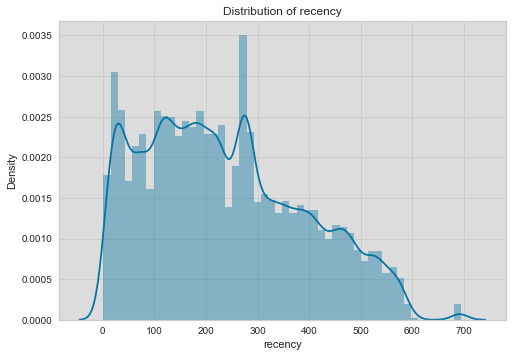

recency's: Skew: 0.4512683917382238, : SkewtestResult(statistic=53.14233978881814, pvalue=0.0)


C:\Users\mfila\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


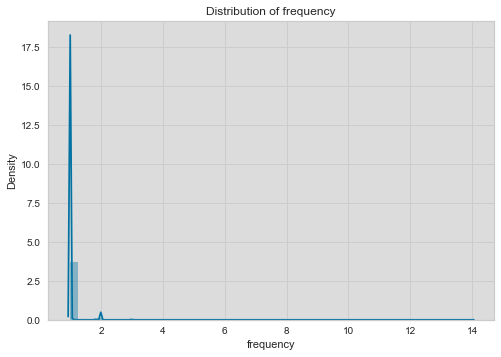

frequency's: Skew: 10.67248275380876, : SkewtestResult(statistic=328.7453185457062, pvalue=0.0)


C:\Users\mfila\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


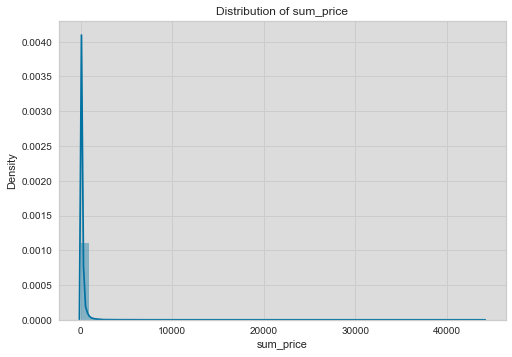

sum_price's: Skew: 27.53147468205657, : SkewtestResult(statistic=424.04156840291137, pvalue=0.0)


C:\Users\mfila\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


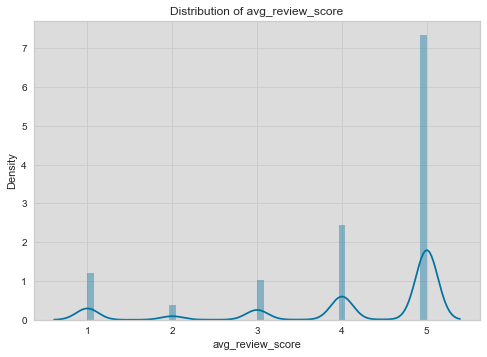

avg_review_score's: Skew: -1.4790900919177603, : SkewtestResult(statistic=-136.52802898640468, pvalue=0.0)


In [41]:
for col in df4.columns:
    check_skew(df4, col)

In [42]:
# Création du dataframe avec les variables transformées en logarithme

col = ['recency','frequency','sum_price','avg_review_score']
df4_log = df4[col].apply(np.log, axis=1)

Les calculs sur l’ensemble de la base de données peuvent prendre beaucoup de temps. Nous allons effectuer les tests sur un échantillon pour ensuite vérifier les meilleurs modèles sur l’ensemble de données.

In [43]:
# création d'un échantillon du dataset avec 4 variables transformées en log

df4_sampl, _ = train_test_split(df4_log, train_size=5000,
                               random_state=123)
ind_samp = df4_sampl.index

In [44]:
# Standardisation StandardScaler
scaler = StandardScaler()
df4_scaled = scaler.fit_transform(df4_sampl)

# Dataframe
df4_scaled = pd.DataFrame(df4_scaled, index=df4_sampl.index,
                             columns=df4_sampl.columns)

In [45]:
df4_scaled.head(2)

,recency,frequency,sum_price,avg_review_score
customer_unique_id,,,,
f6bdd3ee1531c4c1e8d82925affdc375,-0.093889,-0.17153,0.143953,0.107141
c45a227d0dc48199de81e712620b24e8,0.508719,-0.17153,0.366675,0.107141


**K-means : 4 variables (RFM monétaire total, transformées en log, StandardScaler)**

In [46]:
df_resultats_comp4_log = pd.DataFrame()

In [47]:
# Test du modèle

for k in range(2, 9):
    pred_kmeans = KMeans(n_clusters=k,
                   random_state=123).fit_predict(df4_scaled)
    
    df_resultats_comp4_log = \
    calcul_comp_clustering('KMeans', df4_scaled,
                                    pred_kmeans,
                                    df_resultats_comp4_log)
df_resultats_comp4_log.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz
KMeans,2,0.657193,0.540909,1642.592898
KMeans,3,0.467760,0.795654,2142.102911
KMeans,4,0.397206,0.883067,2620.933286
KMeans,5,0.363105,0.817116,3112.162523
KMeans,6,0.320479,0.894846,2970.857276
KMeans,7,0.313123,0.910977,2832.370544
KMeans,8,0.303118,0.991769,2742.029059


<AxesSubplot:xlabel='Nb_clusters', ylabel='coef_silh'>

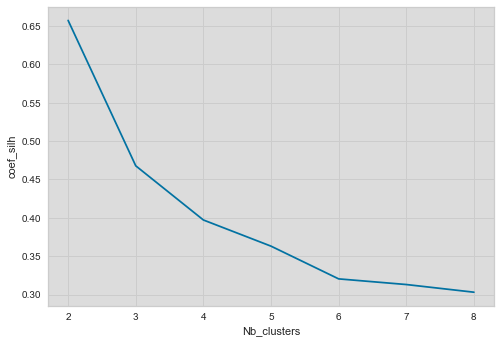

In [48]:
sns.lineplot(x="Nb_clusters", y="coef_silh", data=df_resultats_comp4_log)

<AxesSubplot:xlabel='Nb_clusters', ylabel='davies_bouldin'>

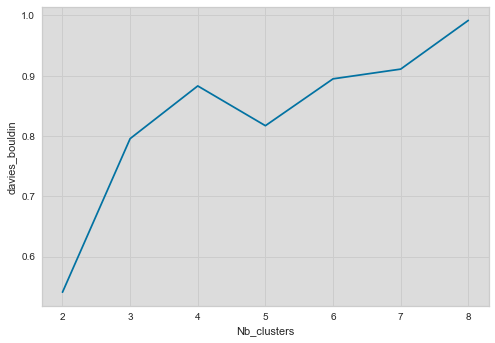

In [49]:
sns.lineplot(x="Nb_clusters", y="davies_bouldin", data=df_resultats_comp4_log)

<AxesSubplot:xlabel='Nb_clusters', ylabel='calinski_harabasz'>

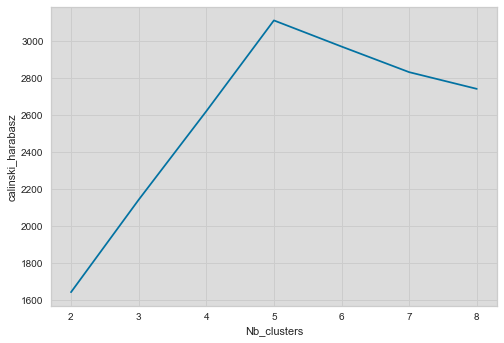

In [50]:
sns.lineplot(x="Nb_clusters", y="calinski_harabasz", data=df_resultats_comp4_log)

**K-means : 4 variables (RFM monétaire total, non transformées en log, RobustScaler)**

In [51]:
df_resultats_comp4_robust = pd.DataFrame()

In [52]:
# création d'un échantillon

df4_sampl, _ = train_test_split(df4, train_size=5000,
                               random_state=123)
ind_samp = df4_sampl.index

In [53]:
# Standardisation RobustScaler
scaler = RobustScaler()
df4_scaled = scaler.fit_transform(df4_sampl)

# Dataframe
df4_scaled = pd.DataFrame(df4_scaled, index=df4_sampl.index,
                             columns=df4_sampl.columns)

In [54]:
# Test du modèle

for k in range(2, 9):
    pred_kmeans = KMeans(n_clusters=k,
                   random_state=123).fit_predict(df4_scaled)
    
    df_resultats_comp4_robust = \
    calcul_comp_clustering('KMeans', df4_scaled,
                                    pred_kmeans,
                                    df_resultats_comp4_robust)
df_resultats_comp4_robust.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz
KMeans,2,0.903770,0.490877,3180.442388
KMeans,3,0.692941,0.641238,3357.585962
KMeans,4,0.503642,0.717401,3773.461477
KMeans,5,0.511098,0.591628,4413.278503
KMeans,6,0.515747,0.592558,4750.457274
KMeans,7,0.431677,0.705747,4757.601422
KMeans,8,0.364695,0.746061,4882.893387


<AxesSubplot:xlabel='Nb_clusters', ylabel='coef_silh'>

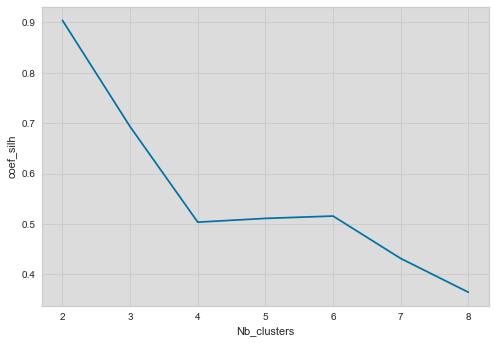

In [55]:
sns.lineplot(x="Nb_clusters", y="coef_silh", data=df_resultats_comp4_robust)

<AxesSubplot:xlabel='Nb_clusters', ylabel='davies_bouldin'>

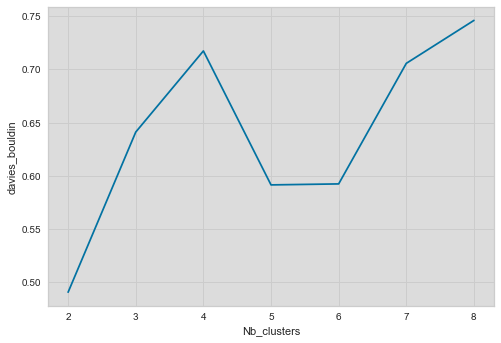

In [56]:
sns.lineplot(x="Nb_clusters", y="davies_bouldin", data=df_resultats_comp4_robust)

<AxesSubplot:xlabel='Nb_clusters', ylabel='calinski_harabasz'>

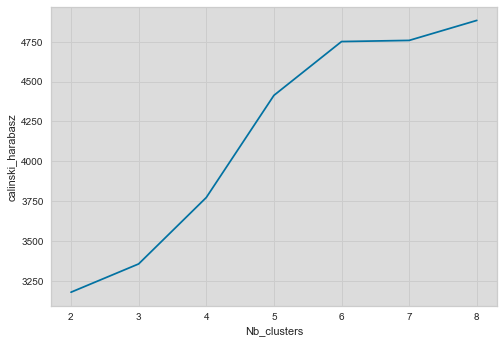

In [57]:
sns.lineplot(x="Nb_clusters", y="calinski_harabasz", data=df_resultats_comp4_robust)

Après plusieurs tests, les meiileurs résultats de clustering avec 4 variables sont obtenus :
   - avec la variable monétaire totale
   - sans transformation logaritmique
   - RobustScaler

**Visualisation des métriques pour le modèle K-means avec 4 variables**

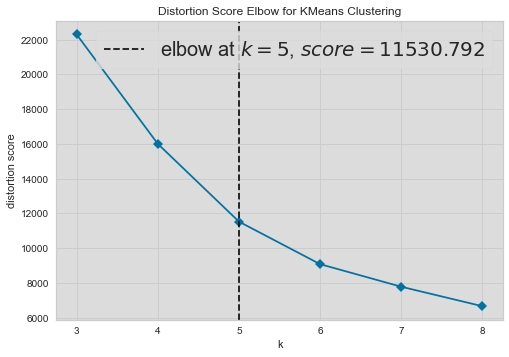

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [58]:
# Modèle
model = KMeans(random_state=123)

# Hyperparamètre k entre 3 et 8
# métrique = distortion ( calcule la somme des distances au carré entre
# chaque point et le centre qui lui est attribué)
visualizer = KElbowVisualizer(model, k=(3, 9), timings=False)

# Entraîne le modèle
visualizer.fit(df4_scaled)
visualizer.show()

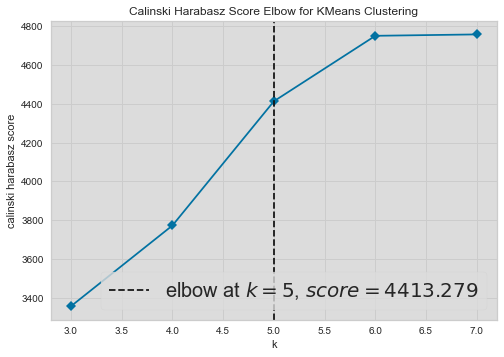

<AxesSubplot:title={'center':'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [59]:
# Modèle
model = KMeans(random_state=123)

# Hyperparamètre k entre 3 et 8
# métrique = calinski_harabasz (calcule le rapport de dispersion entre
# et au sein des clusters)
visualizer = KElbowVisualizer(model, k=(3, 8),
                              metric='calinski_harabasz', timings=False)

# Entraîne le modèle
visualizer.fit(df4_scaled)
visualizer.show()

C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


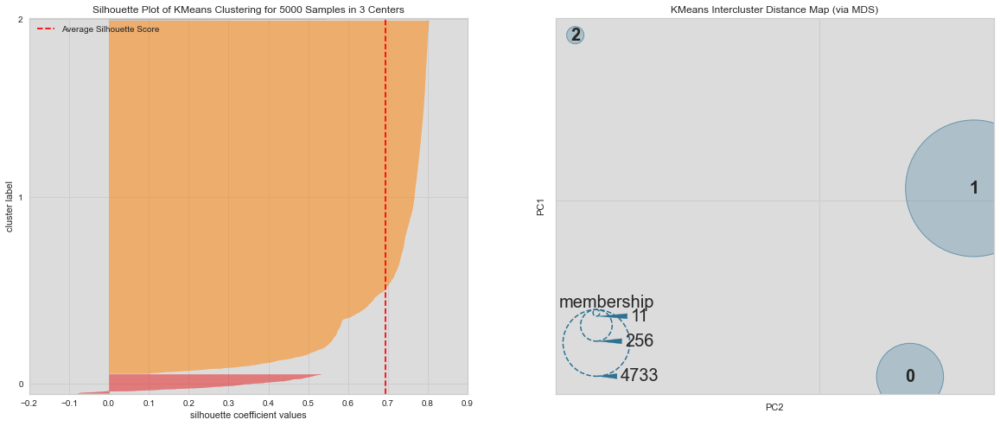

For n_clusters = 3 The average silhouette_score is : 0.6929409530961084 



C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_mds.py:506: UserWarning: The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.
  warnings.warn(


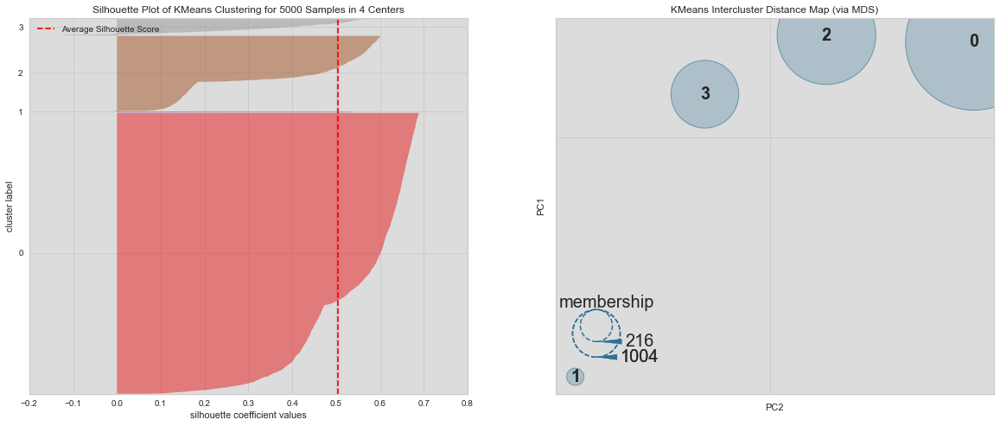

For n_clusters = 4 The average silhouette_score is : 0.5036416425427156 



C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


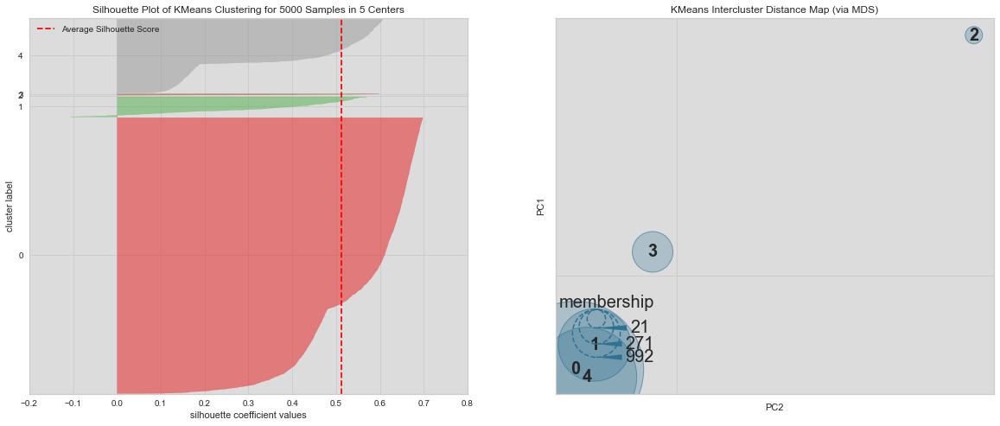

For n_clusters = 5 The average silhouette_score is : 0.511098135574142 



C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


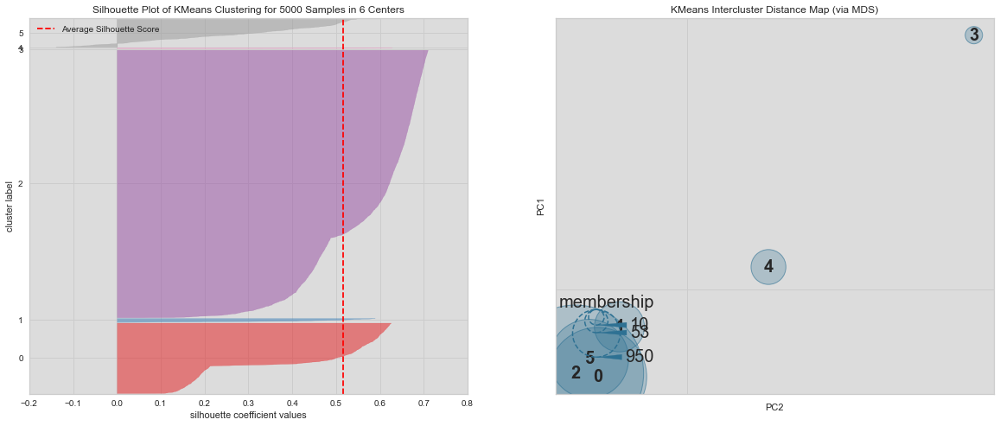

For n_clusters = 6 The average silhouette_score is : 0.5157472321201465 



In [60]:
# Silouhette score evaluation and visualisation
#   & Intercluster distance Map with best k
for k in range(3, 7):
    
    # Initialize the clusterer with k clusters value and a random generator
    # seed of 123 for reproducibility.
    model = KMeans(n_clusters=k,
                   random_state=123)
    cluster_labels = model.fit_predict(df4_scaled)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters    
    silhouette_avg = silhouette_score(df4_scaled, cluster_labels)
    fig, axes = plt.subplots(nrows=1,
                             ncols=2,
                             sharex=False,
                             sharey=False,
                             figsize=(20, 8))

    visualizer = SilhouetteVisualizer(model,
                                      ax=axes[0])
    distance_visualizer = InterclusterDistance(model,
                                               ax=axes[1])
    visualizer.fit(df4_scaled)
    distance_visualizer.fit(df4_scaled)

    visualizer.finalize()
    distance_visualizer.show()
    
    print(
    "For n_clusters =",
    k,
    "The average silhouette_score is :",
    silhouette_avg, '\n'
    )

In [61]:
def two_dim_viz(X, model):

    # Fit the model and define clusters
    model = model.fit(X)
    cluster_labels = model.predict(X)

    # Create 2D TSNE and PCA features
    X_tsne = TSNE(n_components=2,
                  perplexity=30,
                  n_iter=300,
                  learning_rate=300,
                  early_exaggeration=12,
                  n_jobs=-1,
                  init='pca').fit_transform(X)

    pca = PCA(2)
    X_reduced = pca.fit_transform(X)

    # Plot creation
    plt.figure(figsize=(20, 10))
    
    plt.subplot(1, 2, 1)
    sns.scatterplot(x=X_tsne[:, 0],
                    y=X_tsne[:, 1],
                    hue=cluster_labels,
                    legend="brief",
                    s=100,
                    palette='Set1'
                    )
    plt.xlabel("")
    plt.ylabel("")
    plt.title("t-SNE clusters representation")
    plt.legend()

    plt.subplot(1, 2, 2)
    sns.scatterplot(x=X_reduced[:, 1],
                    y=X_reduced[:, 0],
                    hue=cluster_labels,
                    legend="brief",
                    palette='Set1',
                    s=100
                    )
    plt.xlim(-6, 6)
    plt.ylim(-6, 6)
    plt.xlabel("F1")
    plt.ylabel("F2")
    plt.title("PCA clusters representation")
   
    plt.legend()

C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


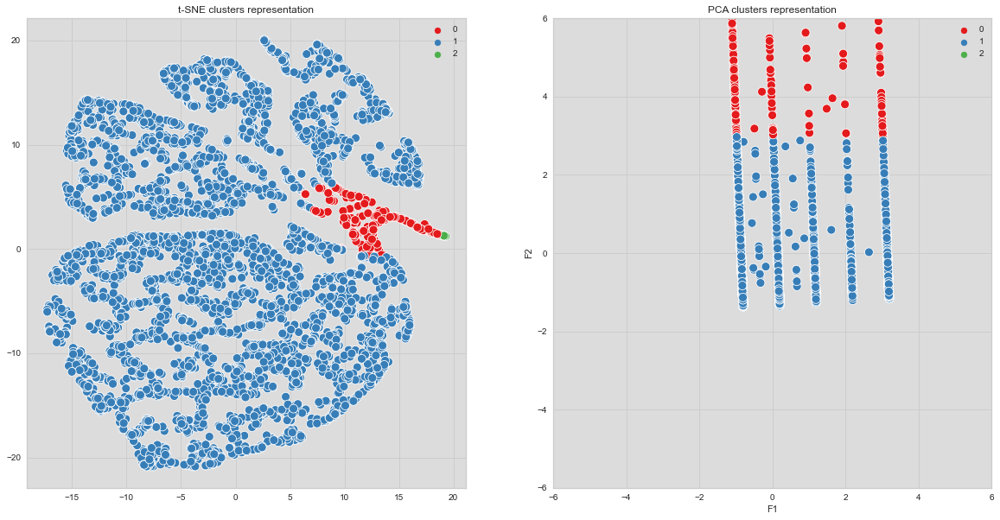

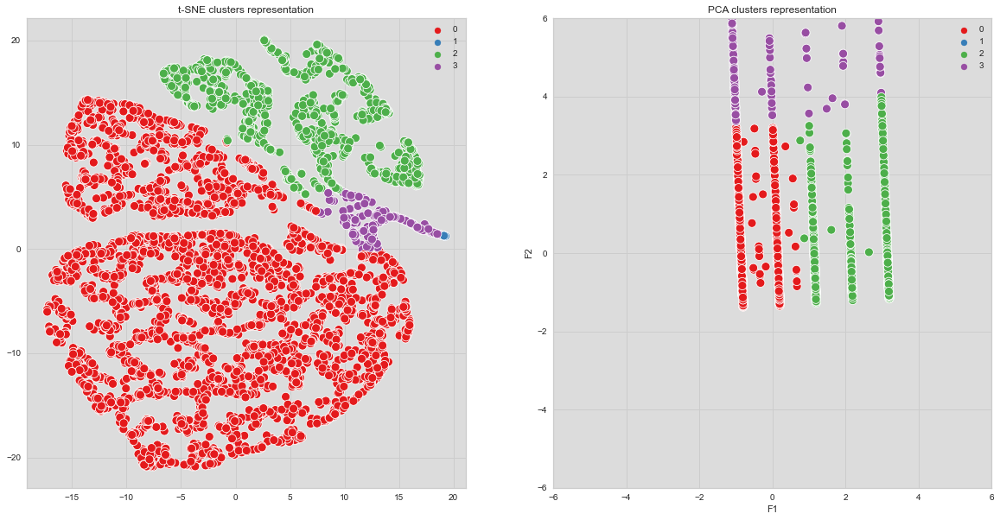

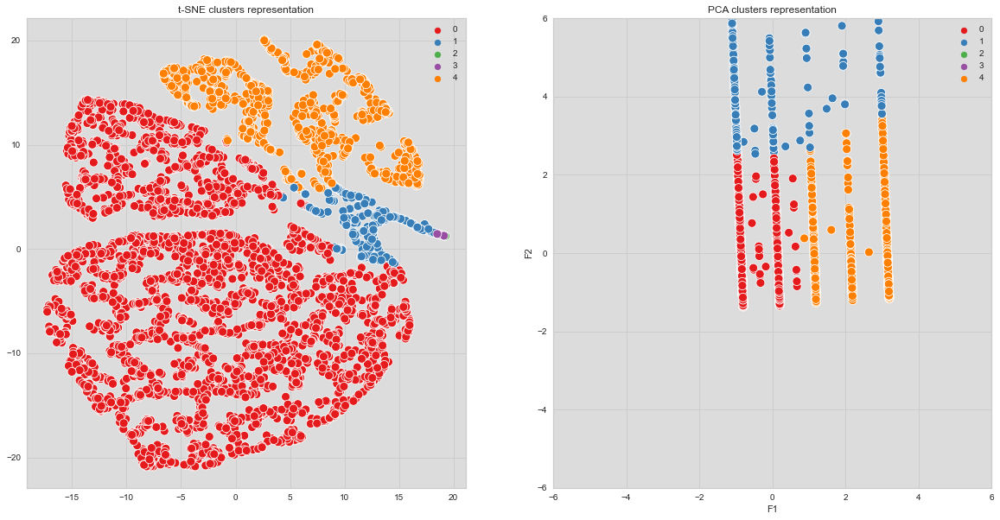

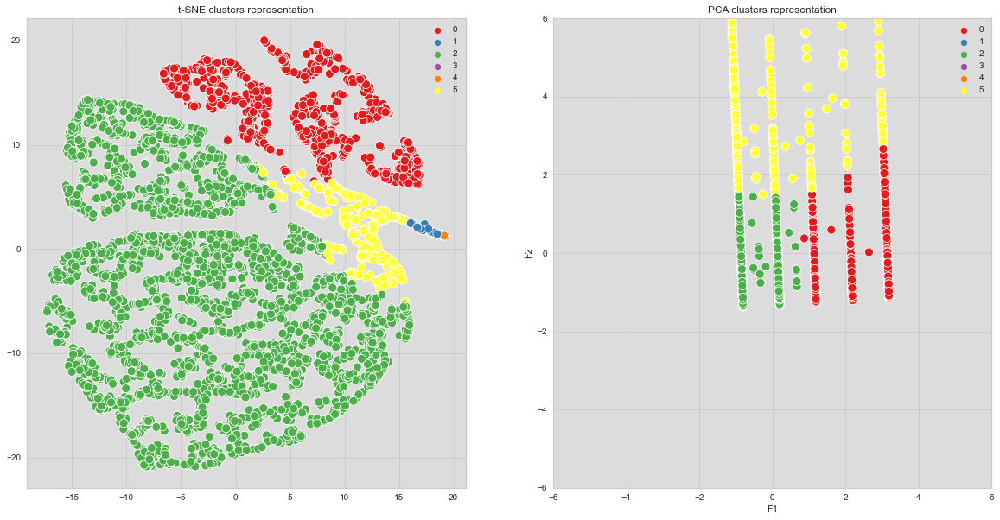

In [62]:
# Show visualisation with dimension reduction for different number of cluster
for k in range(3, 7):
    two_dim_viz(X=df4_scaled,
                model=KMeans(n_clusters=k,
                             random_state=123))

In [63]:
df4_clust = df4_sampl.copy()
df4_clust.loc[:, ('cluster')] = KMeans(n_clusters=4,random_state=123).fit_predict(df4_scaled)

In [64]:
df4_clust.cluster.value_counts().sort_index()

0    3769
1      11
2    1004
3     216
Name: cluster, dtype: int64

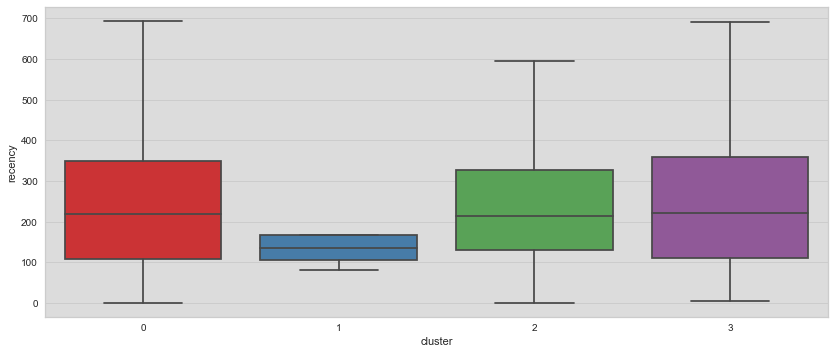

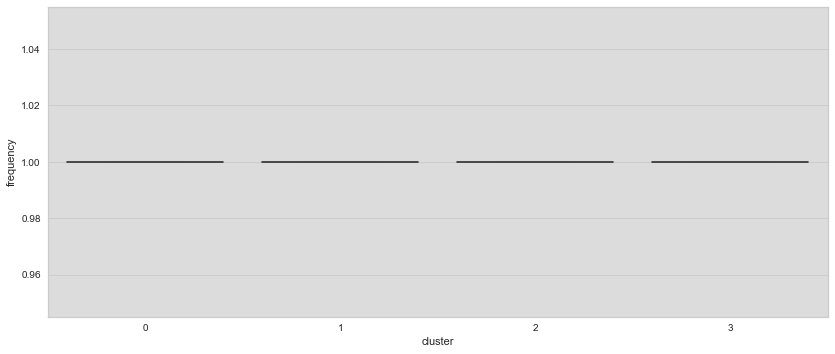

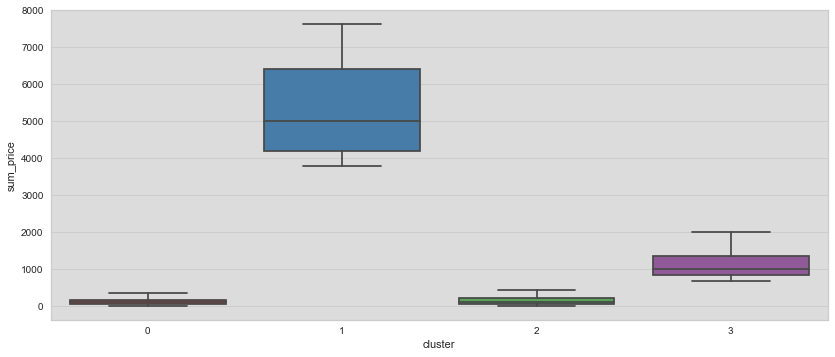

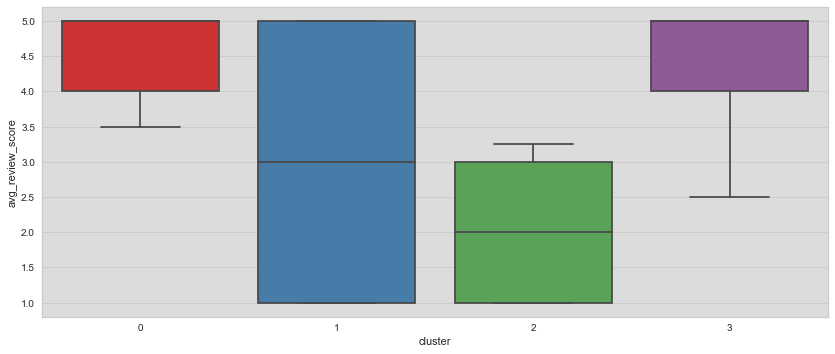

In [65]:
# Boxplot of each featurs per cluster
for i, col in enumerate(df4_clust.iloc[:, :-1].columns):
    plt.figure(figsize=(12, (df4_clust.shape[1]) * 5))
    plt.subplot(df4_clust.shape[1], 1, i+1)
    sns.boxplot(data=df4_clust,
                y=col,
                x='cluster',
                palette='Set1',
                showfliers = False)
    plt.tight_layout()
plt.show()

In [66]:
# NB: df_clust is the untransformed database with clustering result at the end
X, y = df4_clust.iloc[:,:-1], df4_clust.iloc[:,-1]

In [67]:
from sklearn.tree import DecisionTreeClassifier

tree = DecisionTreeClassifier(max_depth=6, random_state=123)
tree = tree.fit(X, y)

In [68]:
feature_importances = pd.Series(tree.feature_importances_,
                                index = X.columns,
                                name='Feature importance')\
                                .sort_values(ascending=False)
feature_importances

avg_review_score    0.779356
sum_price           0.220644
recency             0.000000
frequency           0.000000
Name: Feature importance, dtype: float64

Nous allons ajouter d'autres variables numériques pour avoir plus fine segmentation des clients.

### K-means : RFM + satisfaction + autres variables numériques

Double approche technique et métier : 

Plusieurs test ont été effectué pour trouver à la fois les variables permettant d'obtenir des bons scores de clustering et pertinentes d'un point vu métier (clusters interpretables). Le plus petit nombre de variables donne les meilleurs scores mais ne permet pas de caracteriser finement les groupes de clients. Le grand nombre de variables complique l'interpretation des clusters.

In [69]:
df9 = df2.copy()

In [70]:
df9.info()

<class 'pandas.core.frame.DataFrame'>
Index: 91211 entries, 0000366f3b9a7992bf8c76cfdf3221e2 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 9 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   recency                    91211 non-null  int64  
 1   frequency                  91211 non-null  int64  
 2   mean_price                 91211 non-null  float64
 3   sum_price                  91211 non-null  float64
 4   mean_delivery_days         91211 non-null  float64
 5   mean_delivery_late         91211 non-null  bool   
 6   avg_review_score           91211 non-null  float64
 7   mean_n_item                91211 non-null  float64
 8   mean_payment_installments  91211 non-null  float64
dtypes: bool(1), float64(6), int64(2)
memory usage: 6.3+ MB


In [71]:
df9['mean_delivery_late'] = df9['mean_delivery_late'].astype(int)

#### K-means : 6 variables (RFM monétaire total, moyenne note de satisfaction, moyen nombre d'articles par commande, moyen nombre de paiements)

In [72]:
# création du dataframe avec  variables (RFM + satisfaction + livraison + nombre d'arlicle par panier + options de payement)

df9 = df9[['recency','frequency','sum_price','avg_review_score','mean_n_item','mean_payment_installments']]

C:\Users\mfila\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


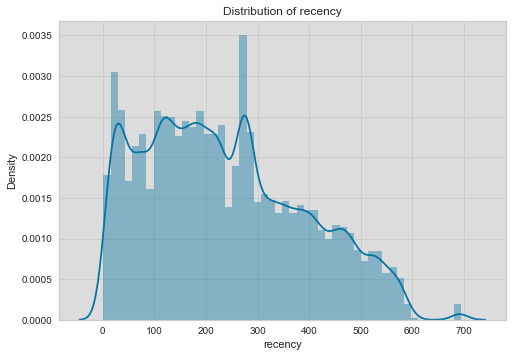

recency's: Skew: 0.4512683917382238, : SkewtestResult(statistic=53.14233978881814, pvalue=0.0)


C:\Users\mfila\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


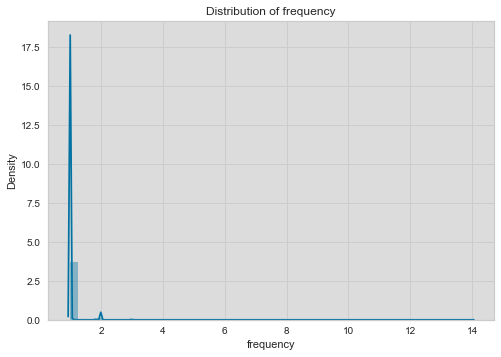

frequency's: Skew: 10.67248275380876, : SkewtestResult(statistic=328.7453185457062, pvalue=0.0)


C:\Users\mfila\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


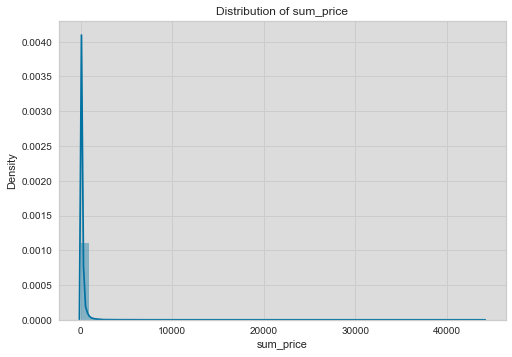

sum_price's: Skew: 27.53147468205657, : SkewtestResult(statistic=424.04156840291137, pvalue=0.0)


C:\Users\mfila\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


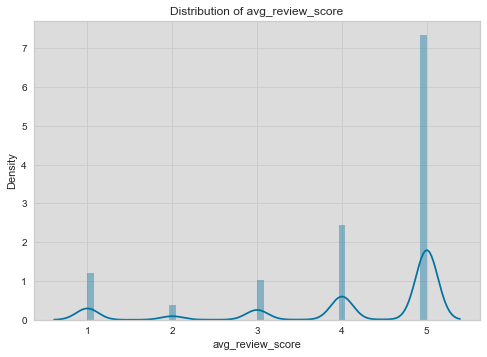

avg_review_score's: Skew: -1.4790900919177603, : SkewtestResult(statistic=-136.52802898640468, pvalue=0.0)


C:\Users\mfila\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


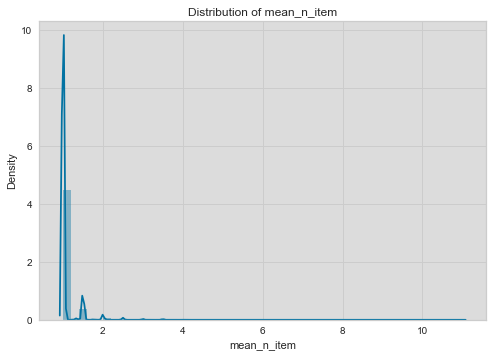

mean_n_item's: Skew: 7.346197041150721, : SkewtestResult(statistic=291.30112383676027, pvalue=0.0)


C:\Users\mfila\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


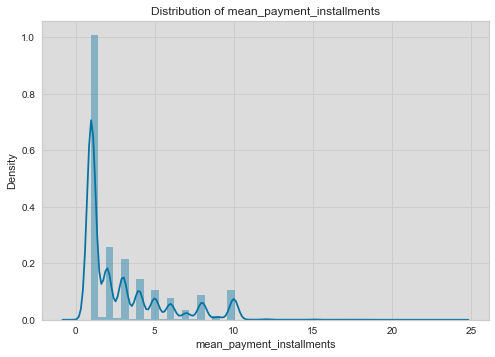

mean_payment_installments's: Skew: 1.6107636239190983, : SkewtestResult(statistic=144.11764952515352, pvalue=0.0)


In [73]:
for col in df9.columns:
    check_skew(df9, col)

In [74]:
df9_sampl, _ = train_test_split(df9, train_size=5000,
                               random_state=123)
ind_samp = df9_sampl.index

In [75]:
# Standardisation RobustScaler
scaler = RobustScaler()
df9_scaled = scaler.fit_transform(df9_sampl)

# Dataframe
df9_scaled = pd.DataFrame(df9_scaled, index=df9_sampl.index,
                             columns=df9_sampl.columns)

In [76]:
# Test du modèle
df_resultats_comp9 = pd.DataFrame()

for k in range(2, 10):
    pred_kmeans = KMeans(n_clusters=k,
                   random_state=123).fit_predict(df9_scaled)
    
    df_resultats_comp9 = \
    calcul_comp_clustering('KMeans', df9_scaled,
                                    pred_kmeans,
                                    df_resultats_comp9)
df_resultats_comp9.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz
KMeans,2,0.892900,0.504872,2834.525154
KMeans,3,0.651087,0.706600,2892.532222
KMeans,4,0.435359,0.823339,3059.926048
KMeans,5,0.440484,0.681571,3338.373548
KMeans,6,0.443830,0.694984,3390.626107
KMeans,7,0.372926,0.821508,3495.879096
KMeans,8,0.366764,0.812665,3409.289112
KMeans,9,0.298936,0.885035,3402.337260


<AxesSubplot:xlabel='Nb_clusters', ylabel='coef_silh'>

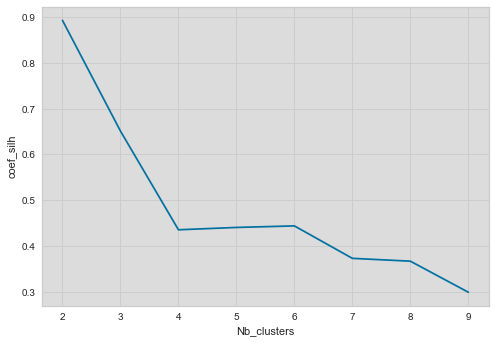

In [77]:
sns.lineplot(x="Nb_clusters", y="coef_silh", data=df_resultats_comp9)

<AxesSubplot:xlabel='Nb_clusters', ylabel='davies_bouldin'>

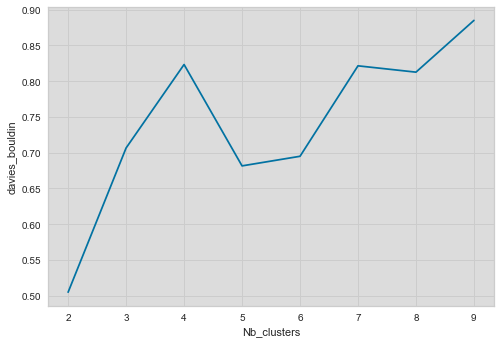

In [78]:
sns.lineplot(x="Nb_clusters", y="davies_bouldin", data=df_resultats_comp9)

<AxesSubplot:xlabel='Nb_clusters', ylabel='calinski_harabasz'>

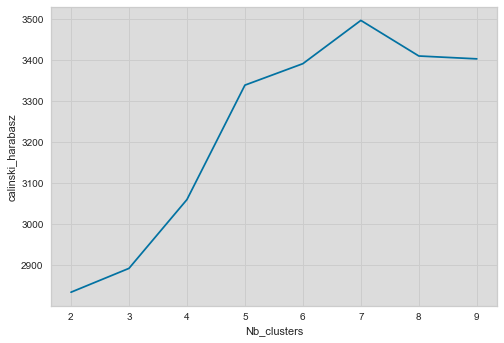

In [79]:
sns.lineplot(x="Nb_clusters", y="calinski_harabasz", data=df_resultats_comp9)

**Visualisation des métriques pour le modèle K-means avec 6 variables numériques**

C:\Users\mfila\anaconda3\lib\site-packages\yellowbrick\utils\kneed.py:156: YellowbrickWarning: No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
C:\Users\mfila\anaconda3\lib\site-packages\yellowbrick\cluster\elbow.py:374: YellowbrickWarning: No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning
  warnings.warn(warning_message, YellowbrickWarning)


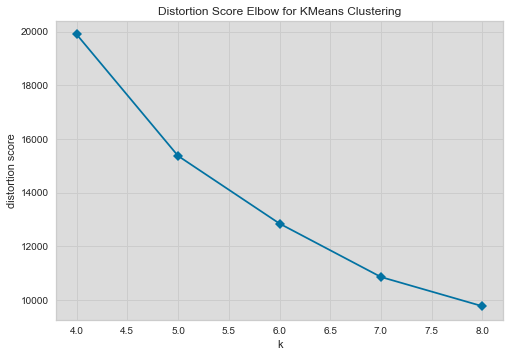

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [80]:
# Modèle
model = KMeans(random_state=123)

# Hyperparamètre k entre 4 et 9
# métrique = distortion ( calcule la somme des distances au carré entre
# chaque point et le centre qui lui est attribué)
visualizer = KElbowVisualizer(model, k=(4, 9), timings=False)

# Entraîne le modèle
visualizer.fit(df9_scaled)
visualizer.show()

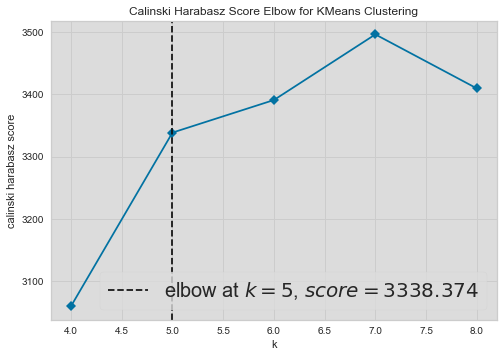

<AxesSubplot:title={'center':'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [81]:
# Modèle
model = KMeans(random_state=123)

# Hyperparamètre k entre 4 et 9
# métrique = calinski_harabasz (calcule le rapport de dispersion entre
# et au sein des clusters)
visualizer = KElbowVisualizer(model, k=(4, 9),
                              metric='calinski_harabasz', timings=False)

# Entraîne le modèle
visualizer.fit(df9_scaled)
visualizer.show()

C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


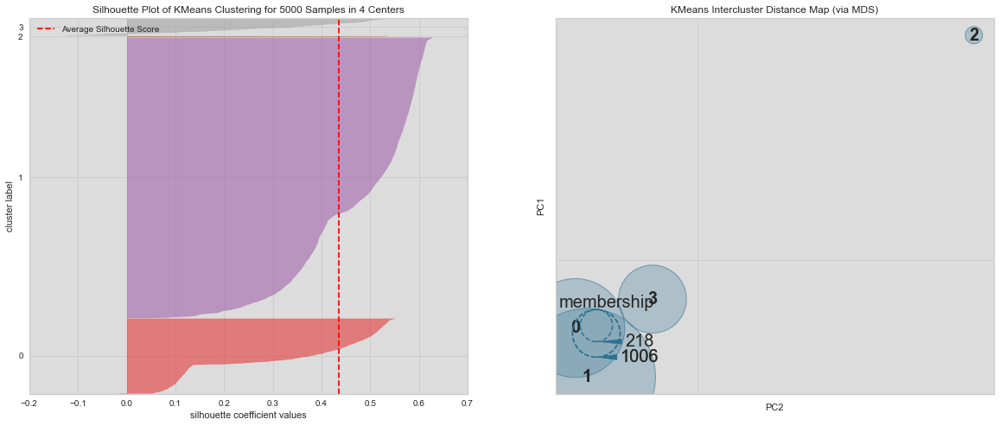

For n_clusters = 4 The average silhouette_score is : 0.4353592162838106 



C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


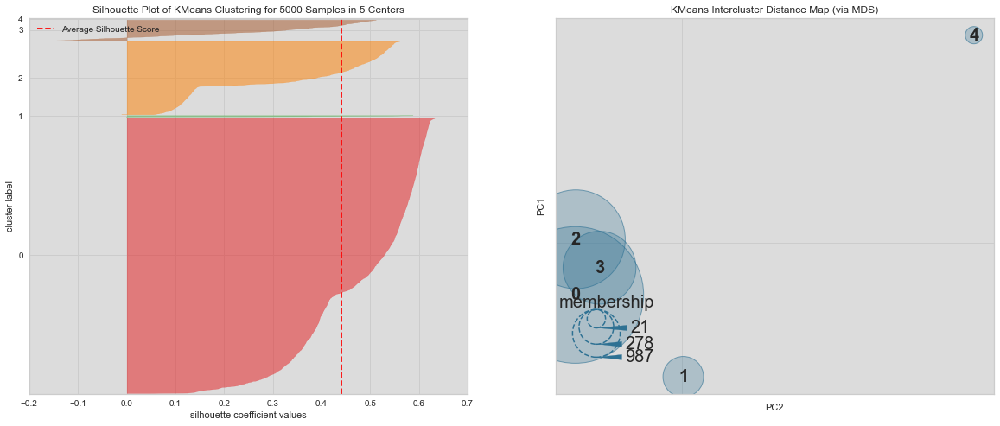

For n_clusters = 5 The average silhouette_score is : 0.44048372463087987 



C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_mds.py:506: UserWarning: The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.
  warnings.warn(


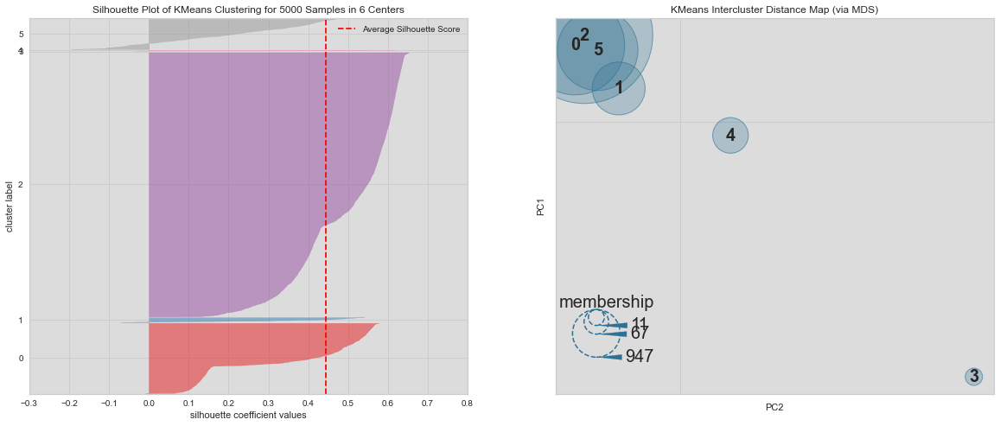

For n_clusters = 6 The average silhouette_score is : 0.4438301538176784 



C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


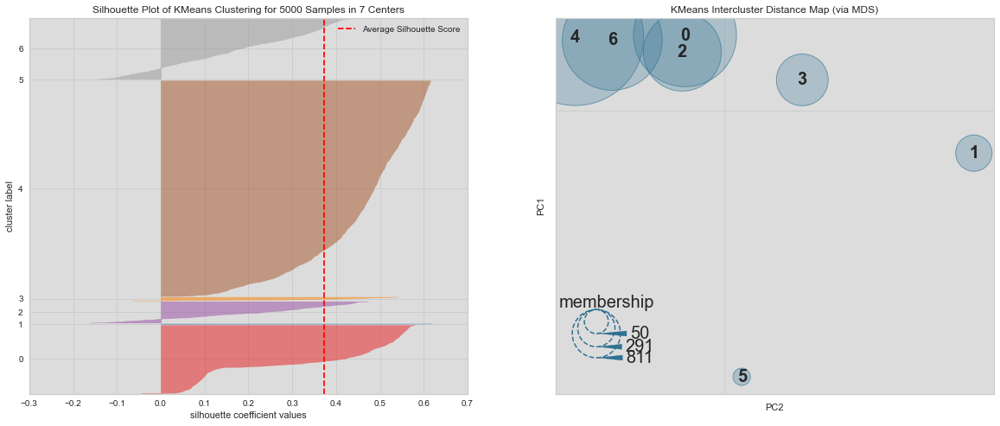

For n_clusters = 7 The average silhouette_score is : 0.37292635601094587 



C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


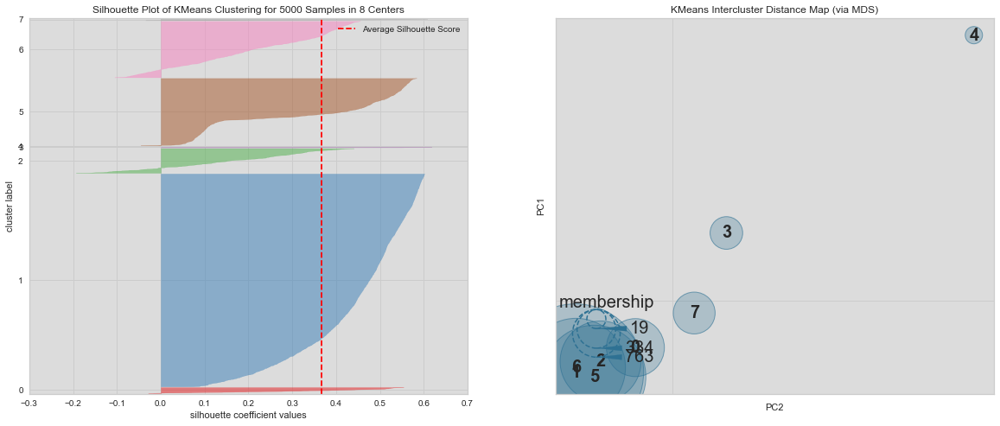

For n_clusters = 8 The average silhouette_score is : 0.3667640218863536 



In [82]:
# Silouhette score evaluation and visualisation
#   & Intercluster distance Map with best k
for k in range(4, 9):
    
    # Initialize the clusterer with k clusters value and a random generator
    # seed of 123 for reproducibility.
    model = KMeans(n_clusters=k,
                   random_state=123)
    cluster_labels = model.fit_predict(df9_scaled)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters    
    silhouette_avg = silhouette_score(df9_scaled, cluster_labels)
    fig, axes = plt.subplots(nrows=1,
                             ncols=2,
                             sharex=False,
                             sharey=False,
                             figsize=(20, 8))

    visualizer = SilhouetteVisualizer(model,
                                      ax=axes[0])
    distance_visualizer = InterclusterDistance(model,
                                               ax=axes[1])
    visualizer.fit(df9_scaled)
    distance_visualizer.fit(df9_scaled)

    visualizer.finalize()
    distance_visualizer.show()
    
    print(
    "For n_clusters =",
    k,
    "The average silhouette_score is :",
    silhouette_avg, '\n'
    )

C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\mfi

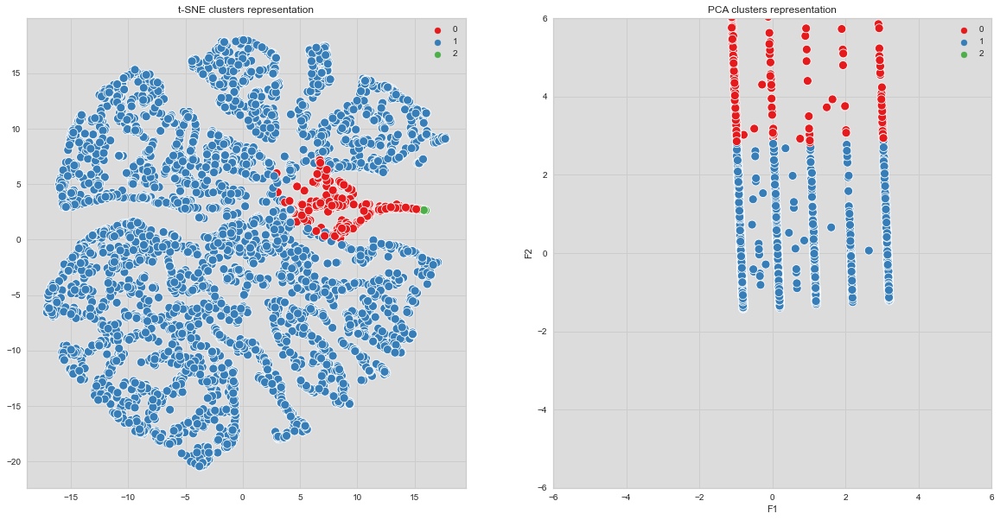

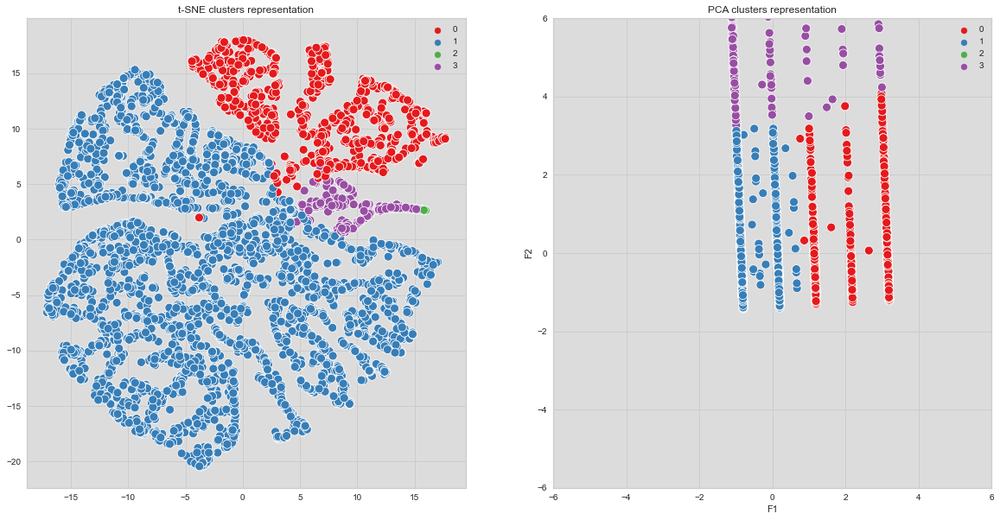

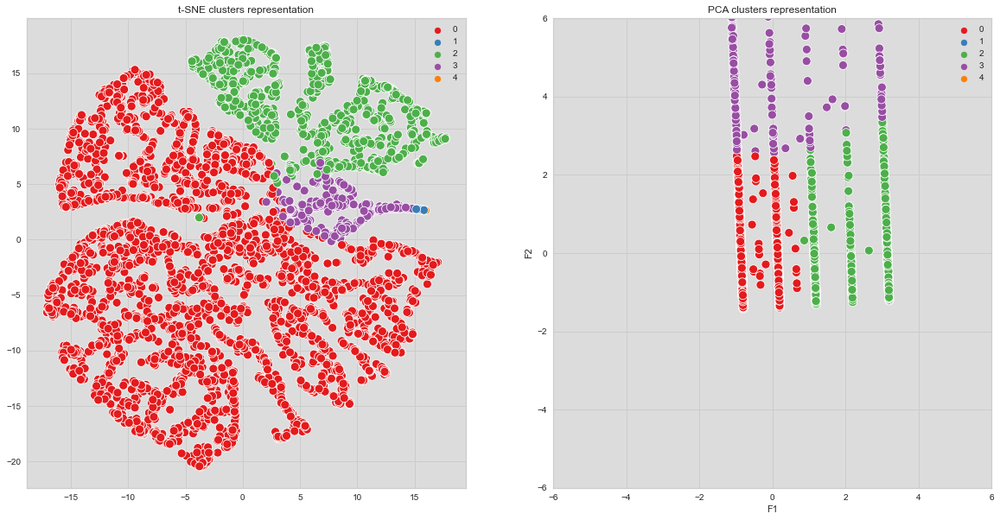

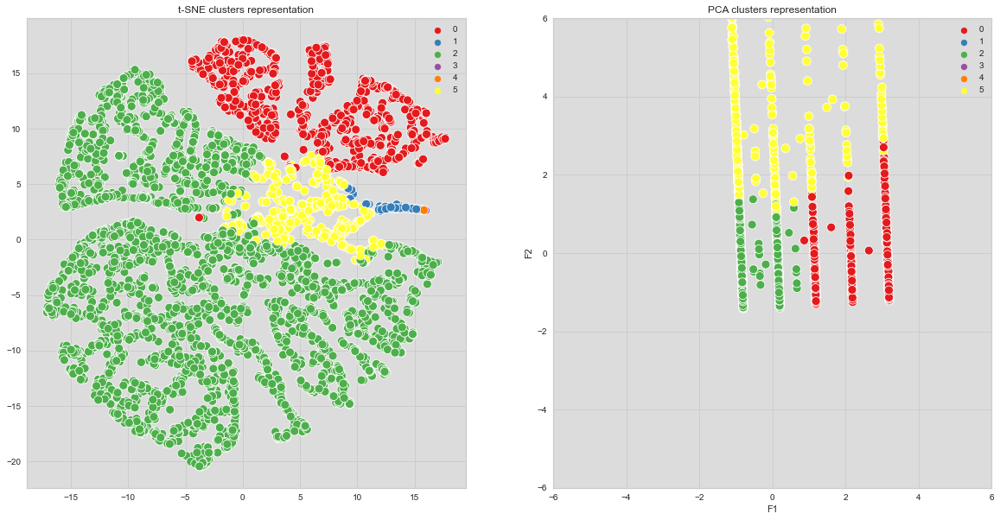

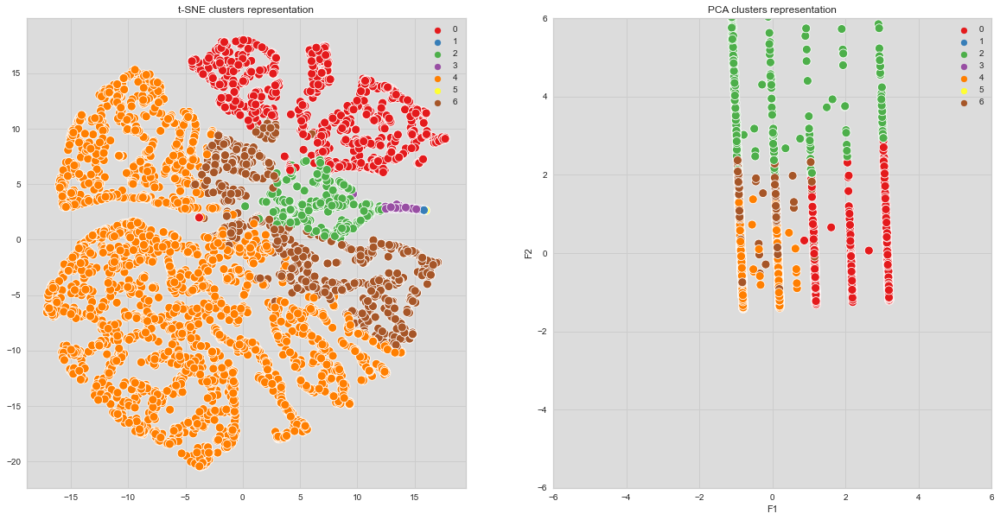

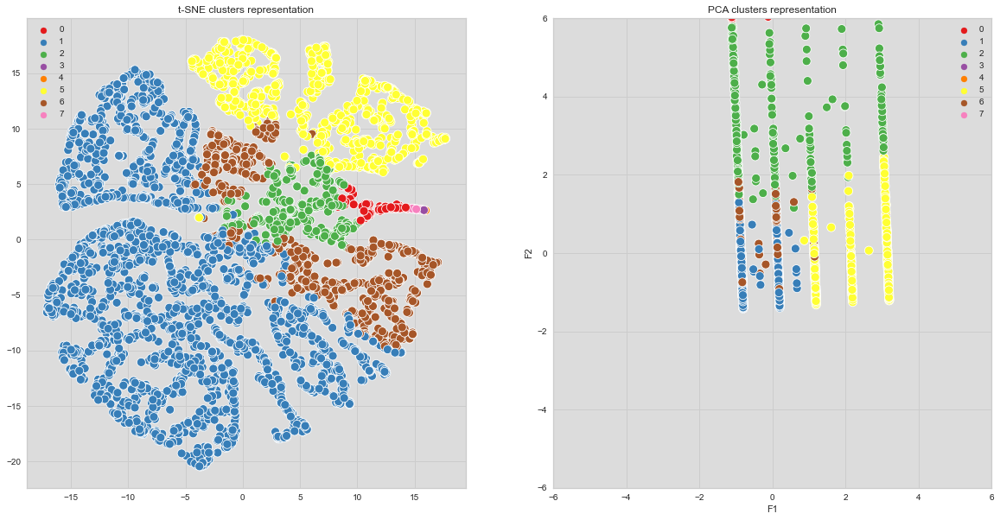

In [83]:
# Show visualisation with dimension reduction for different number of cluster
for k in range(3, 9):
    two_dim_viz(X=df9_scaled,
                model=KMeans(n_clusters=k,                             
                             random_state=123))

In [84]:
df9_clust = df9_sampl.copy()
df9_clust.loc[:, ('cluster')] = KMeans(n_clusters=6,random_state=123).fit_predict(df9_scaled)

In [85]:
df9_clust.cluster.value_counts().sort_index()

0     947
1      67
2    3565
3       1
4      11
5     409
Name: cluster, dtype: int64

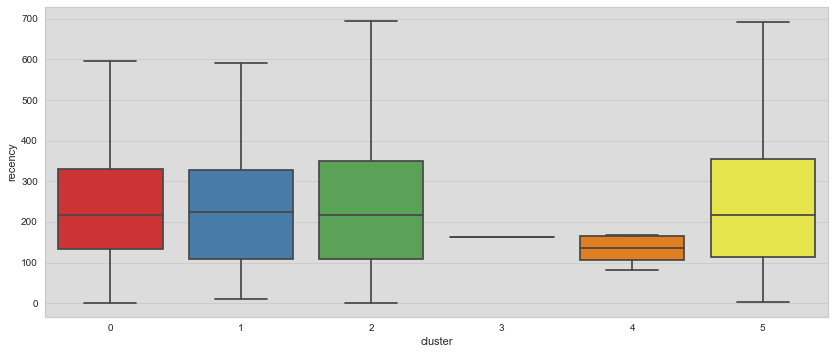

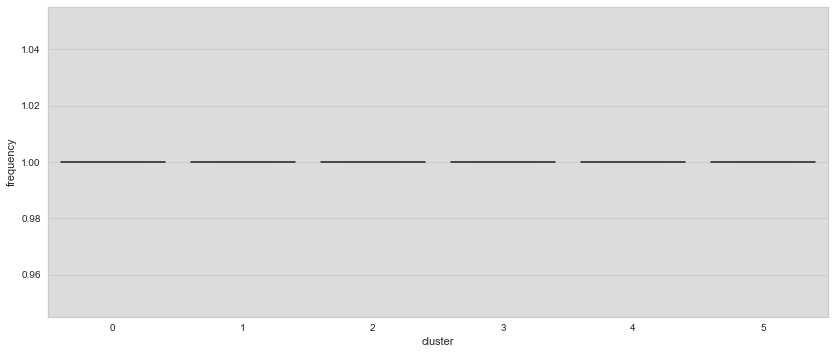

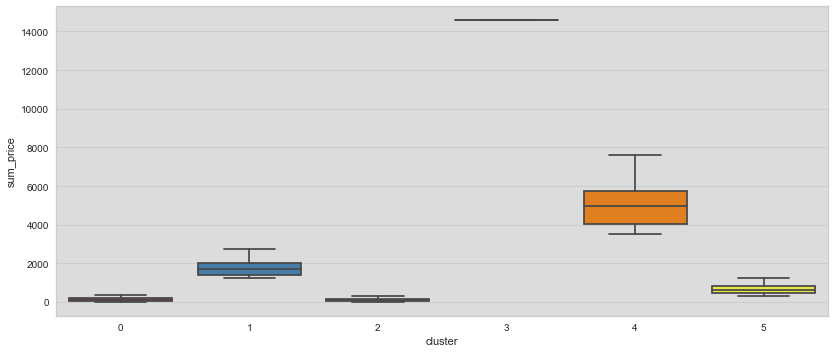

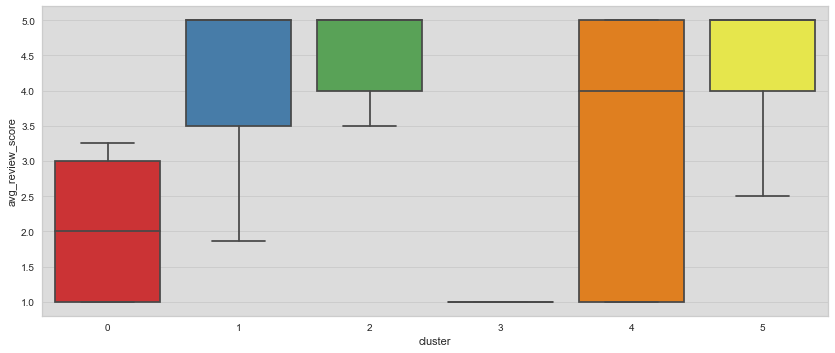

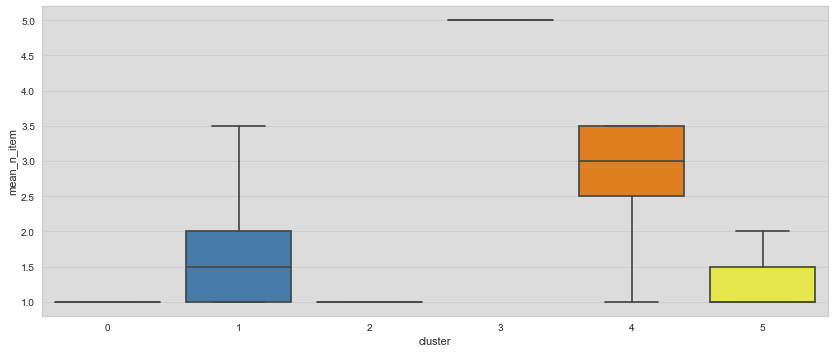

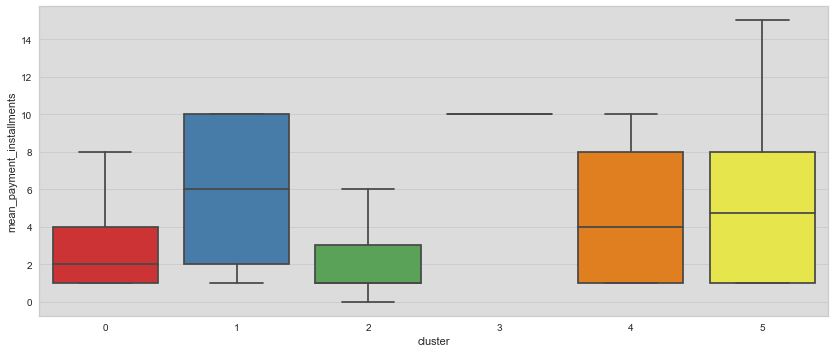

In [86]:
# Boxplot of each featurs per cluster
for i, col in enumerate(df9_clust.iloc[:, :-1].columns):
    plt.figure(figsize=(12, (df9_clust.shape[1]) * 5))
    plt.subplot(df9_clust.shape[1], 1, i+1)
    sns.boxplot(data=df9_clust,
                y=col,
                x='cluster',
                palette='Set1',
                showfliers = False)
    plt.tight_layout()
plt.show()

In [87]:
# df_clust is the untransformed database with clustering result at the end
X, y = df9_clust.iloc[:,:-1], df9_clust.iloc[:,-1]

In [88]:
from sklearn.tree import DecisionTreeClassifier

tree = DecisionTreeClassifier(max_depth=6, random_state=123)
tree = tree.fit(X, y)

In [89]:
feature_importances = pd.Series(tree.feature_importances_,
                                index = X.columns,
                                name='Feature importance')\
                                .sort_values(ascending=False)
feature_importances

avg_review_score             0.611649
sum_price                    0.366157
mean_payment_installments    0.019341
mean_n_item                  0.002086
recency                      0.000766
frequency                    0.000000
Name: Feature importance, dtype: float64

Pour le modèle avec 6 variables numériques 5 clusters semble être un nombre optimal (les tests effectués sur un échantillon de 5000 clients).

#### K-means : 9 variables numériques (RFM, satisfaction, options de livraison, options de paiement)

In [90]:
df11 = df.copy()

In [91]:
df11['mean_delivery_late'] = df11['mean_delivery_late'].astype(int)

In [92]:
# création du dataframe avec  variables (RFM + satisfaction + livraison + nombre d'arlicle par panier + options de payement)

df11 = df11[['recency', 'frequency',
       'mean_price', 'sum_price',
       'mean_delivery_days', 'mean_delivery_late', 'avg_review_score',
       'mean_n_item', 
       'mean_payment_installments']]

In [93]:
df11_sampl, _ = train_test_split(df11, train_size=5000,
                               random_state=123)
ind_samp = df11_sampl.index

In [94]:
# Standardisation RobustScaler
scaler = RobustScaler()
df11_scaled = scaler.fit_transform(df11_sampl)

# Dataframe
df11_scaled = pd.DataFrame(df11_scaled, index=df11_sampl.index,
                             columns=df11_sampl.columns)

In [95]:
# Test du modèle
df_resultats_comp11 = pd.DataFrame()

for k in range(2, 10):
    pred_kmeans = KMeans(n_clusters=k,
                   random_state=123).fit_predict(df11_scaled)
    
    df_resultats_comp11 = \
    calcul_comp_clustering('KMeans', df11_scaled,
                                    pred_kmeans,
                                    df_resultats_comp11)
df_resultats_comp11.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz
KMeans,2,0.771987,0.772901,2510.960978
KMeans,3,0.647717,0.779032,2408.513717
KMeans,4,0.417478,1.000666,2292.344858
KMeans,5,0.420686,0.963926,2279.302424
KMeans,6,0.399985,0.881142,2265.631179
KMeans,7,0.299864,1.001608,2219.460534
KMeans,8,0.302401,1.024932,2135.210461
KMeans,9,0.304516,0.990846,2076.031981


<AxesSubplot:xlabel='Nb_clusters', ylabel='coef_silh'>

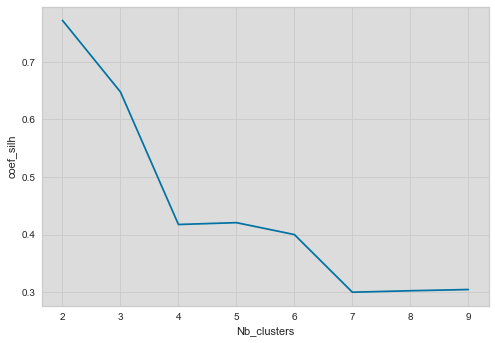

In [96]:
sns.lineplot(x="Nb_clusters", y="coef_silh", data=df_resultats_comp11)

<AxesSubplot:xlabel='Nb_clusters', ylabel='davies_bouldin'>

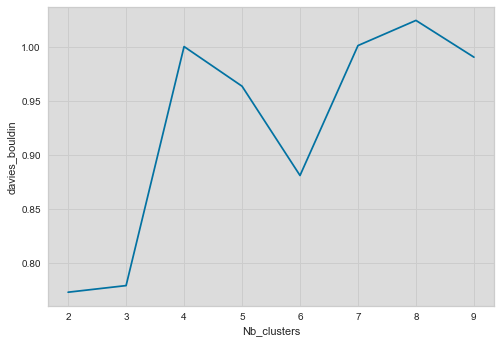

In [97]:
sns.lineplot(x="Nb_clusters", y="davies_bouldin", data=df_resultats_comp11)

<AxesSubplot:xlabel='Nb_clusters', ylabel='calinski_harabasz'>

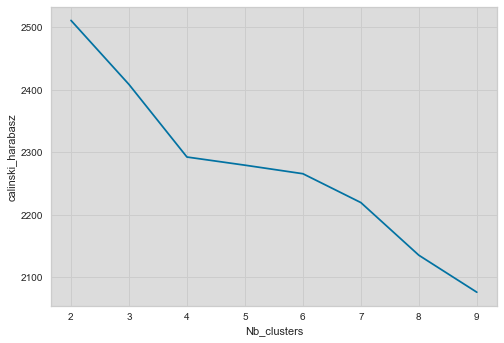

In [98]:
sns.lineplot(x="Nb_clusters", y="calinski_harabasz", data=df_resultats_comp11)

**Visualisation des métriques pour le modèle K-means avec 9 variables numériques**

C:\Users\mfila\anaconda3\lib\site-packages\yellowbrick\utils\kneed.py:156: YellowbrickWarning: No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
C:\Users\mfila\anaconda3\lib\site-packages\yellowbrick\cluster\elbow.py:374: YellowbrickWarning: No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning
  warnings.warn(warning_message, YellowbrickWarning)


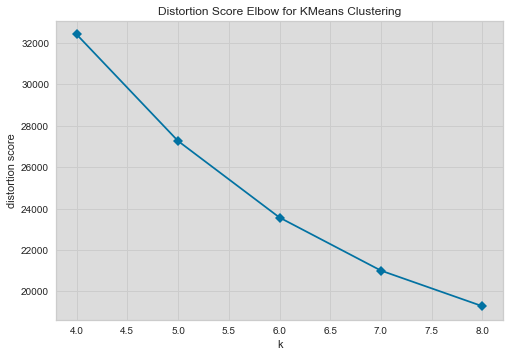

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [99]:
# Modèle
model = KMeans(random_state=123)

# Hyperparamètre k entre 4 et 9
# métrique = distortion ( calcule la somme des distances au carré entre
# chaque point et le centre qui lui est attribué)
visualizer = KElbowVisualizer(model, k=(4, 9), timings=False)

# Entraîne le modèle
visualizer.fit(df11_scaled)
visualizer.show()

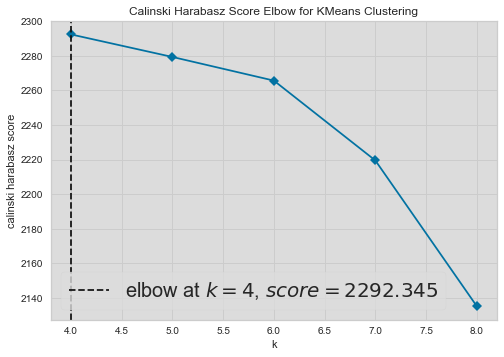

<AxesSubplot:title={'center':'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [100]:
# Modèle
model = KMeans(random_state=123)

# Hyperparamètre k entre 4 et 9
# métrique = calinski_harabasz (calcule le rapport de dispersion entre
# et au sein des clusters)
visualizer = KElbowVisualizer(model, k=(4, 9),
                              metric='calinski_harabasz', timings=False)

# Entraîne le modèle
visualizer.fit(df11_scaled)
visualizer.show()

C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


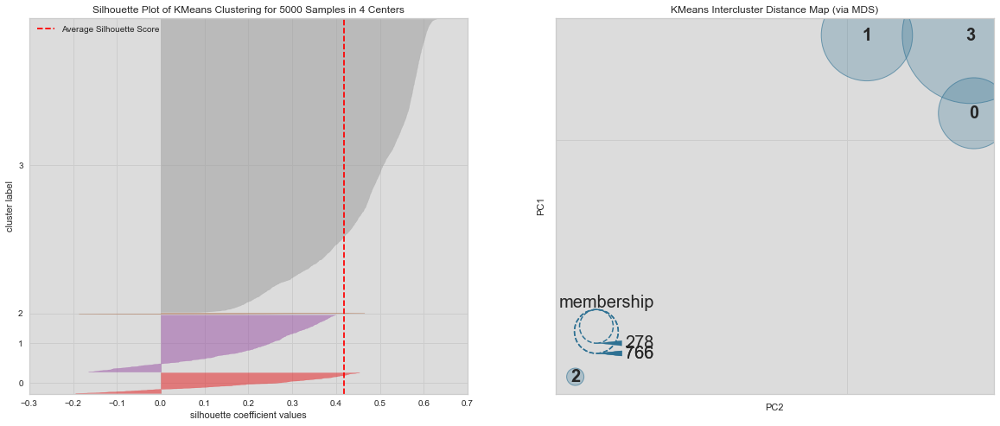

For n_clusters = 4 The average silhouette_score is : 0.41747764530518616 



C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


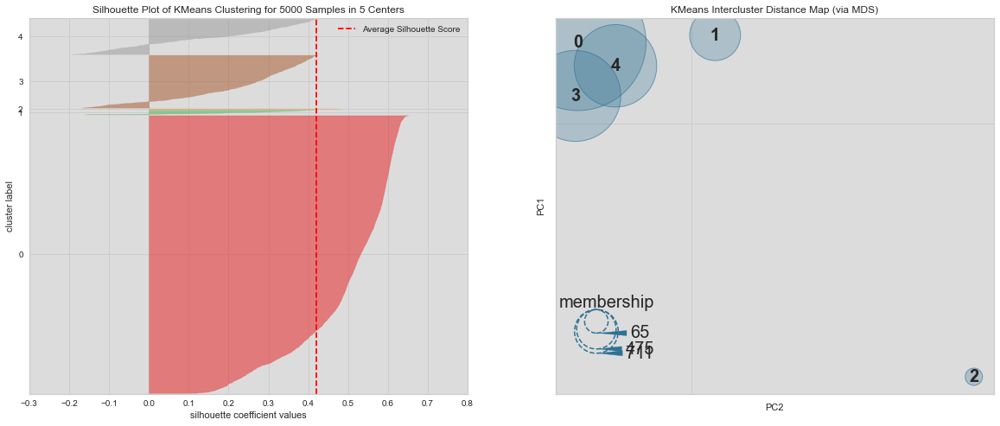

For n_clusters = 5 The average silhouette_score is : 0.4206856477158145 



C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


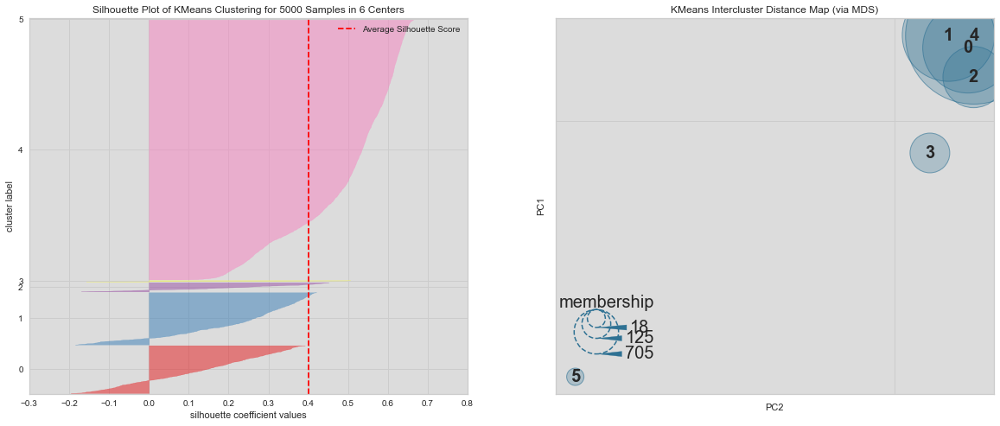

For n_clusters = 6 The average silhouette_score is : 0.399985302503582 



C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


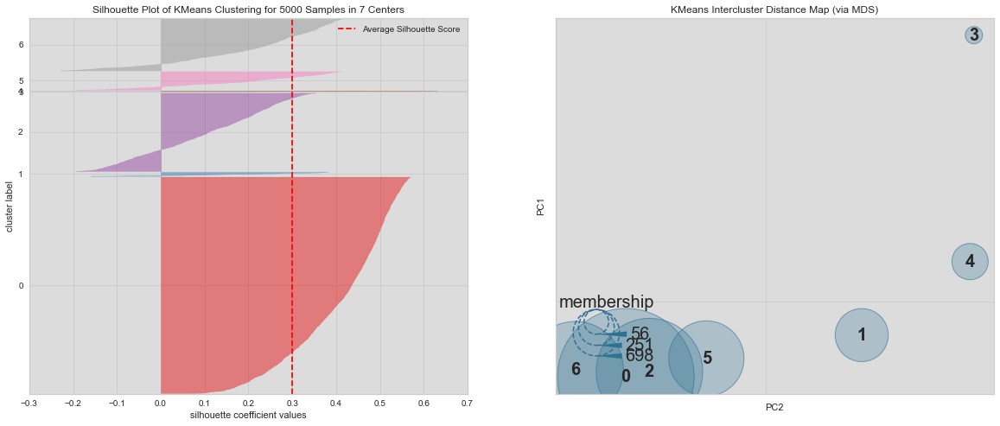

For n_clusters = 7 The average silhouette_score is : 0.2998639415217644 



C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


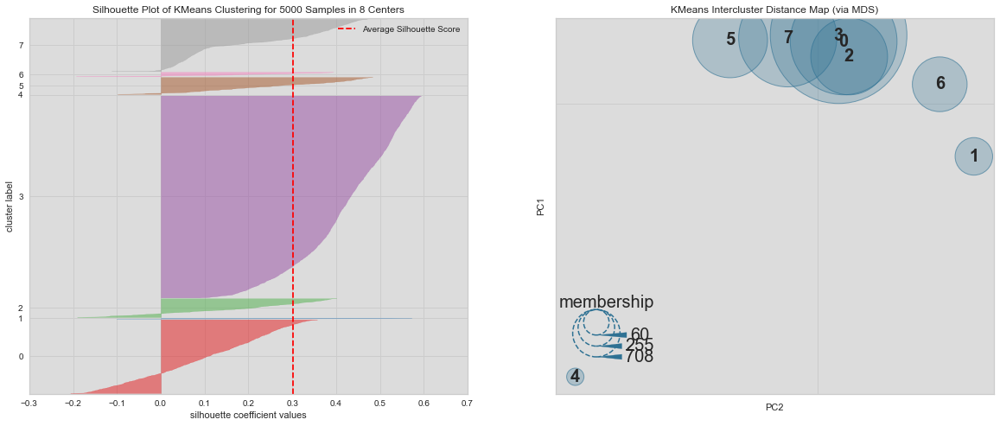

For n_clusters = 8 The average silhouette_score is : 0.3024014486158411 



In [101]:
# Silouhette score evaluation and visualisation
#   & Intercluster distance Map with best k
for k in range(4, 9):
    
    # Initialize the clusterer with k clusters value and a random generator
    # seed of 123 for reproducibility.
    model = KMeans(n_clusters=k,
                   random_state=123)
    cluster_labels = model.fit_predict(df11_scaled)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters    
    silhouette_avg = silhouette_score(df11_scaled, cluster_labels)
    fig, axes = plt.subplots(nrows=1,
                             ncols=2,
                             sharex=False,
                             sharey=False,
                             figsize=(20, 8))

    visualizer = SilhouetteVisualizer(model,
                                      ax=axes[0])
    distance_visualizer = InterclusterDistance(model,
                                               ax=axes[1])
    visualizer.fit(df11_scaled)
    distance_visualizer.fit(df11_scaled)

    visualizer.finalize()
    distance_visualizer.show()
    
    print(
    "For n_clusters =",
    k,
    "The average silhouette_score is :",
    silhouette_avg, '\n'
    )

C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\mfi

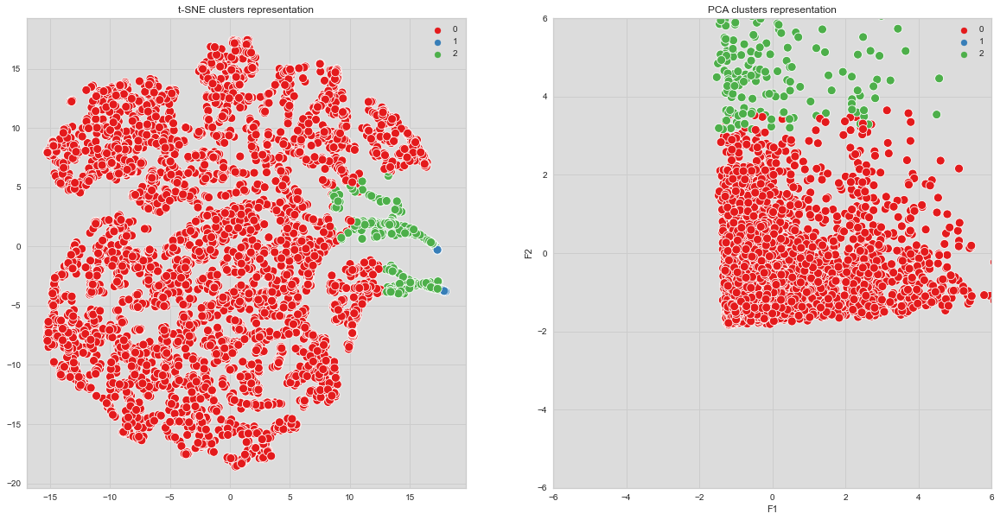

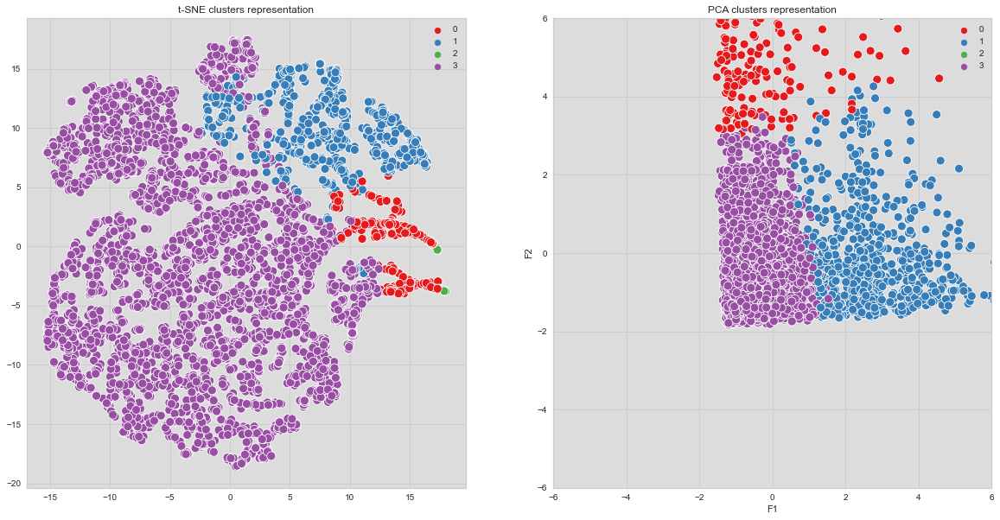

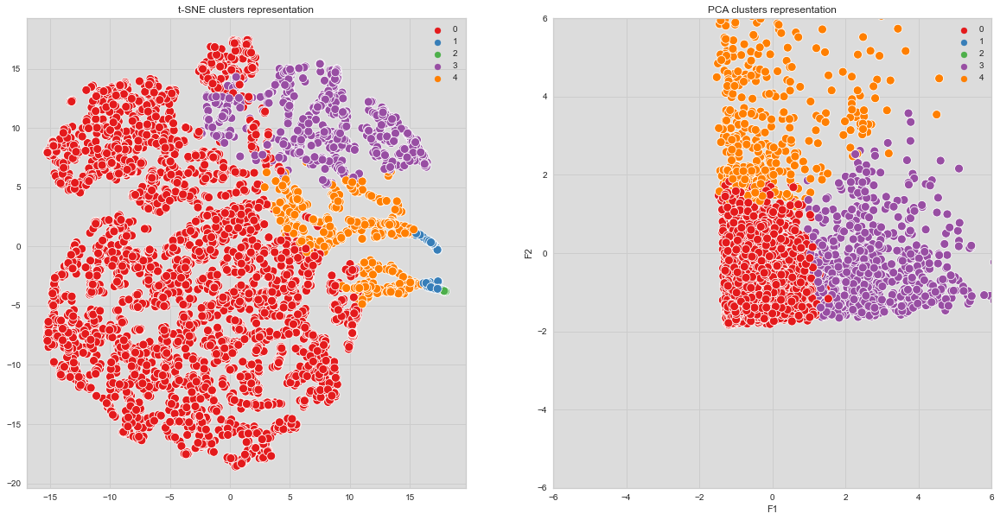

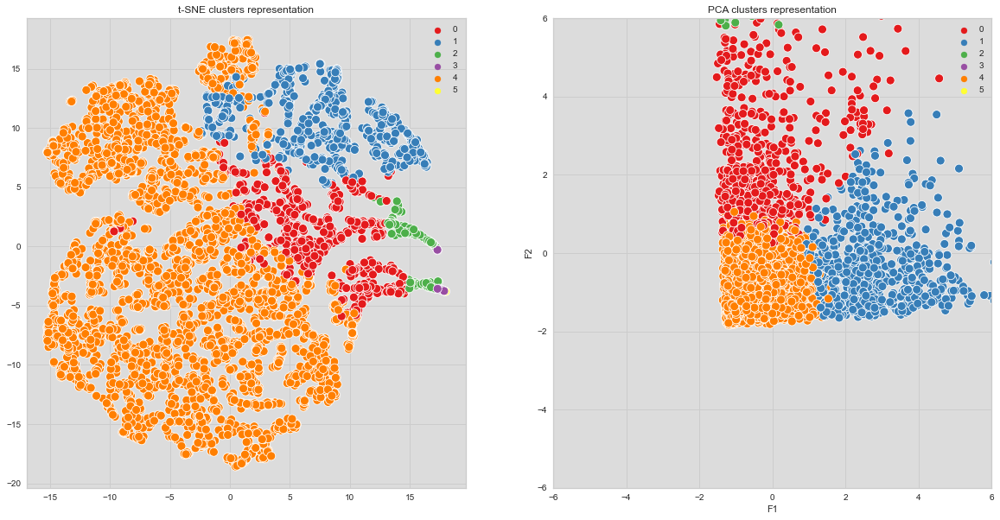

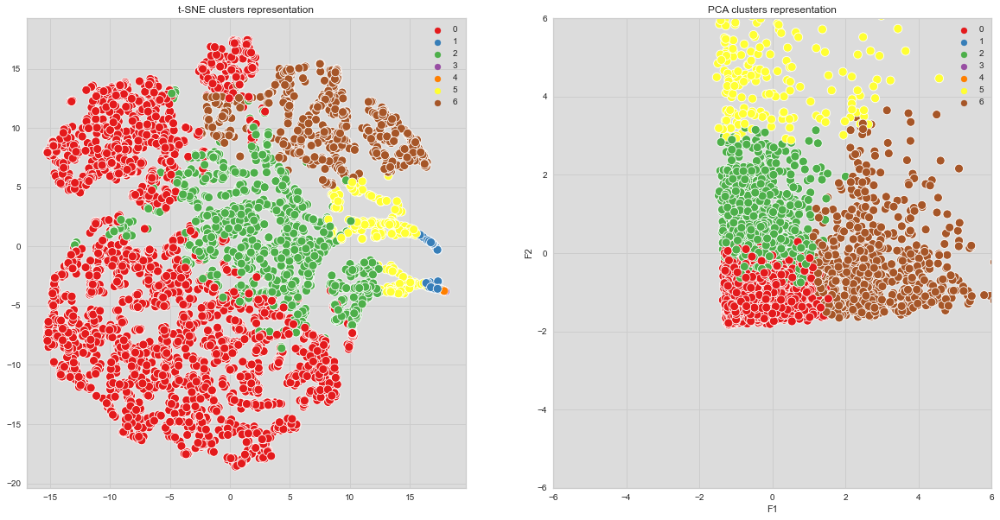

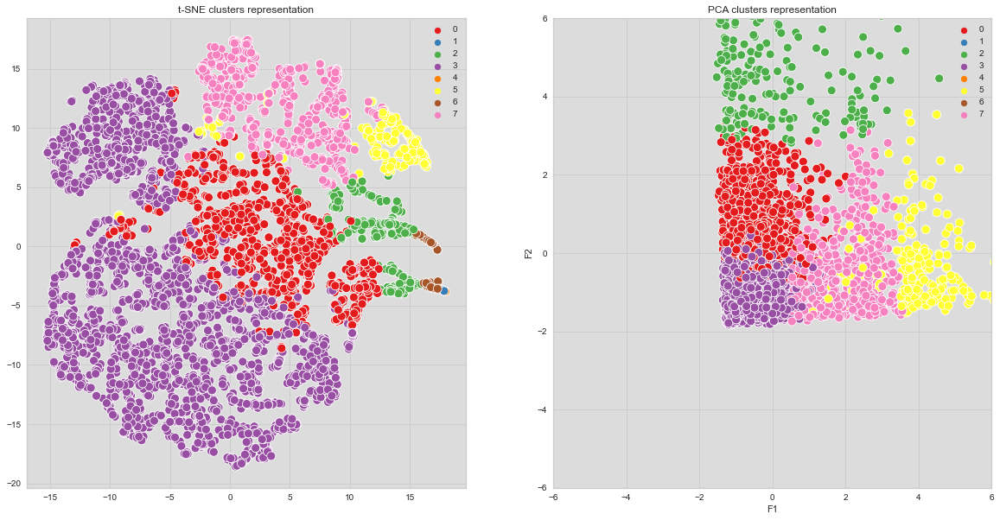

In [102]:
# Show visualisation with dimension reduction for different number of cluster
for k in range(3, 9):
    two_dim_viz(X=df11_scaled,
                model=KMeans(n_clusters=k,                             
                             random_state=123))

In [103]:
df11_clust = df11_sampl.copy()
df11_clust.loc[:, ('cluster')] = KMeans(n_clusters=7,random_state=123).fit_predict(df11_scaled)

In [104]:
df11_clust.cluster.value_counts().sort_index()

0    2926
1      56
2    1058
3       1
4      10
5     251
6     698
Name: cluster, dtype: int64

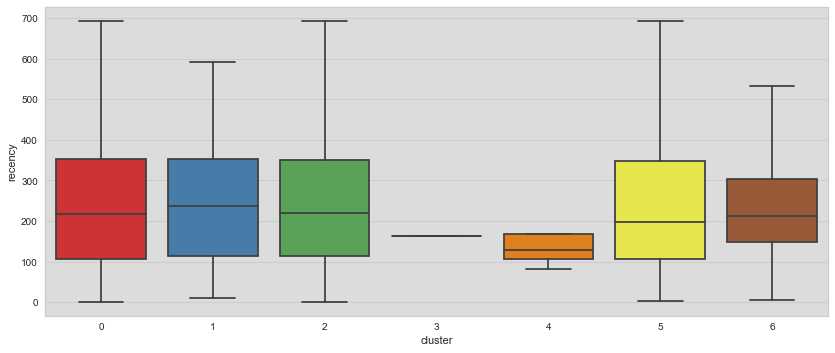

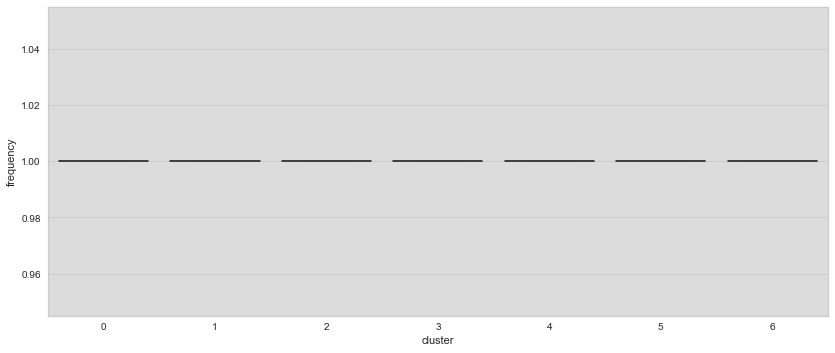

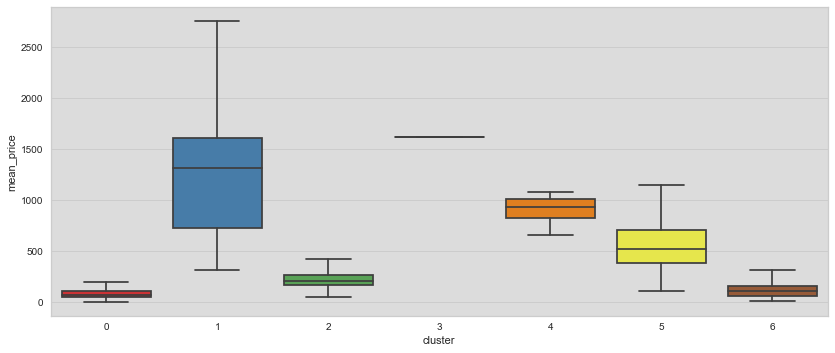

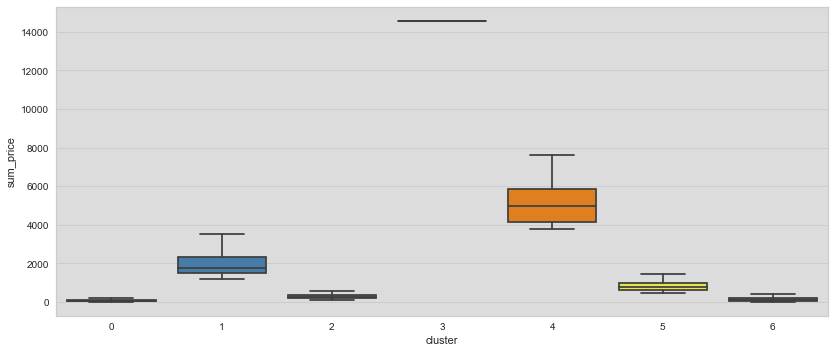

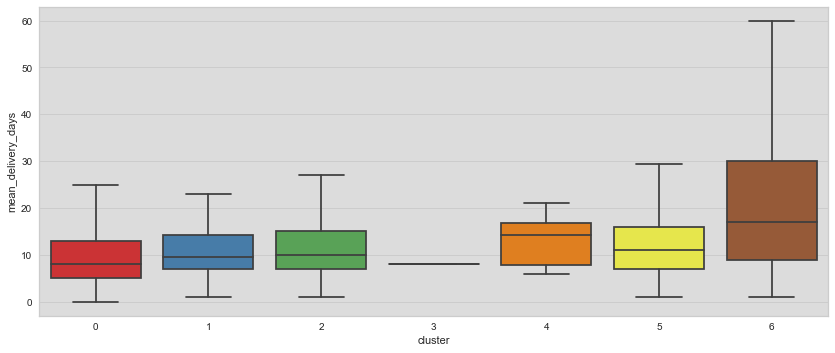

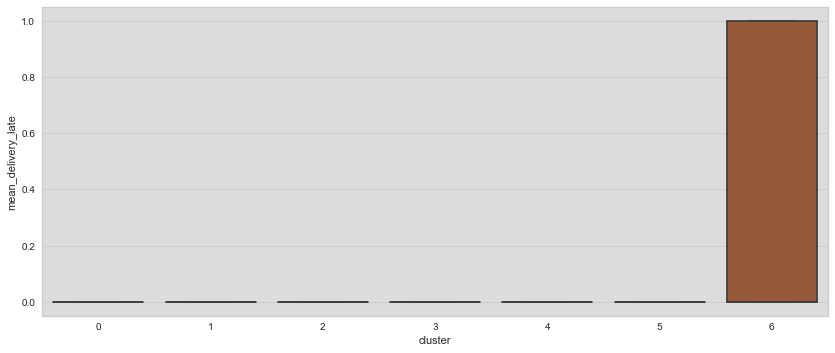

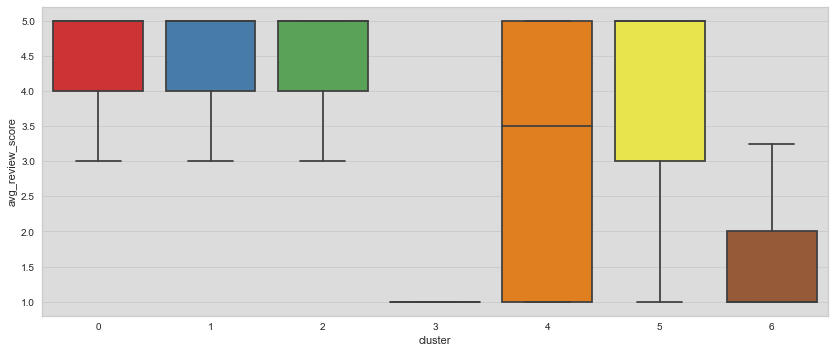

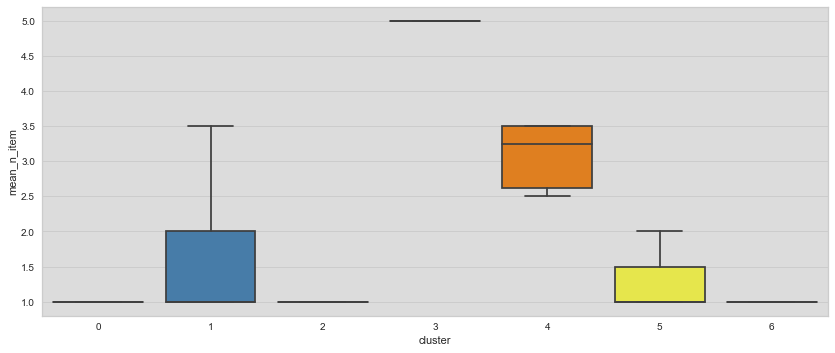

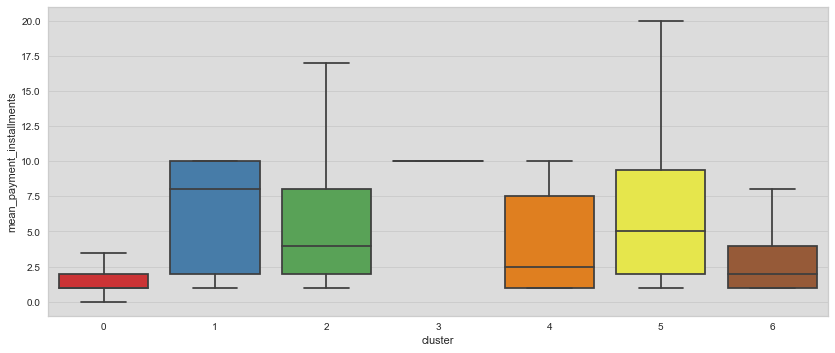

In [105]:
# Boxplot of each featurs per cluster
for i, col in enumerate(df11_clust.iloc[:, :-1].columns):
    plt.figure(figsize=(12, (df11_clust.shape[1]) * 5))
    plt.subplot(df11_clust.shape[1], 1, i+1)
    sns.boxplot(data=df11_clust,
                y=col,
                x='cluster',
                palette='Set1',
                showfliers = False)
    plt.tight_layout()
plt.show()

In [106]:
# NB: df_clust is the untransformed database with clustering result at the end
X, y = df11_clust.iloc[:,:-1], df11_clust.iloc[:,-1]

In [107]:
from sklearn.tree import DecisionTreeClassifier

tree = DecisionTreeClassifier(max_depth=6, random_state=123)
tree = tree.fit(X, y)

In [108]:
feature_importances = pd.Series(tree.feature_importances_,
                                index = X.columns,
                                name='Feature importance')\
                                .sort_values(ascending=False)
feature_importances

sum_price                    0.462357
avg_review_score             0.339964
mean_payment_installments    0.093661
mean_price                   0.067643
mean_delivery_days           0.035656
mean_delivery_late           0.000719
recency                      0.000000
frequency                    0.000000
mean_n_item                  0.000000
Name: Feature importance, dtype: float64

### K-means : RFM + satisfaction + variables numériques + variables catégorielles


In [109]:
df10 = df3.copy()

In [110]:
df10.columns

Index(['recency', 'frequency', 'mean_price', 'sum_price', 'mean_delivery_days',
       'mean_delivery_late', 'avg_review_score', 'mean_n_item',
       'mean_payment_installments', 'main_product_category',
       'main_payment_type'],
      dtype='object')

In [111]:
df10 = df10[['recency', 'frequency', 'sum_price', 'avg_review_score','mean_n_item',
             'main_product_category','mean_payment_installments','main_payment_type']]

In [112]:
df10_sampl, _ = train_test_split(df10, train_size=10000,
                               random_state=123)
ind_samp = df10_sampl.index

In [113]:
df10.info()

<class 'pandas.core.frame.DataFrame'>
Index: 91211 entries, 0000366f3b9a7992bf8c76cfdf3221e2 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 8 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   recency                    91211 non-null  int64  
 1   frequency                  91211 non-null  int64  
 2   sum_price                  91211 non-null  float64
 3   avg_review_score           91211 non-null  float64
 4   mean_n_item                91211 non-null  float64
 5   main_product_category      91211 non-null  object 
 6   mean_payment_installments  91211 non-null  float64
 7   main_payment_type          91211 non-null  object 
dtypes: float64(4), int64(2), object(2)
memory usage: 6.3+ MB


#### K-means : 6 variables numériques, 2 variables catégorielles

In [114]:
# Standartisation

numeric=df10_sampl.select_dtypes('number').columns
normalisation=RobustScaler()

# Preprocessing OneHot    

categ=df10_sampl.select_dtypes('object').columns
OneHot=OneHotEncoder(handle_unknown='ignore',sparse=False)

preprocessor = ColumnTransformer(transformers=[ ('num', normalisation, numeric),
                                                ('cat', OneHot, categ)])
    
# Apprentissage de l'encodage et transformation des données

df10_sampl_stand=preprocessor.fit_transform(df10_sampl)

# Récupération des noms des variables encodeés
encoded_names=numeric.to_list()
encoded_cat_names=preprocessor.named_transformers_['cat'].get_feature_names_out(categ).tolist()
encoded_names.extend(encoded_cat_names)

# création du dataframe des données standartisées et encodées

encoded_df10_sampl=pd.DataFrame(df10_sampl_stand,columns=encoded_names)

In [115]:
df_resultats_comp10_sampl = pd.DataFrame()

In [116]:
# test d10 sampl

for k in range(1, 10):
    pred_kmeans = KMeans(n_clusters=k,
                   random_state=123).fit_predict(encoded_df10_sampl)
    
    df_resultats_comp10_sampl = \
    calcul_comp_clustering('KMeans',
                            encoded_df10_sampl,
                            pred_kmeans,
                            df_resultats_comp10_sampl)
df_resultats_comp10_sampl.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz
KMeans,1,0.000000,0.000000,0.000000
KMeans,2,0.830815,0.609256,5232.802176
KMeans,3,0.629242,0.699988,5178.206813
KMeans,4,0.331073,0.969842,5121.222793
KMeans,5,0.335372,0.951946,4891.476244
KMeans,6,0.246778,1.149109,4605.101899
KMeans,7,0.193930,1.311194,4192.165855
KMeans,8,0.194742,1.202434,4225.713126
KMeans,9,0.173721,1.296425,3969.120858


**Visualisation des métriques pour le modèle K-means avec 8 variables numériques et catégorielles**

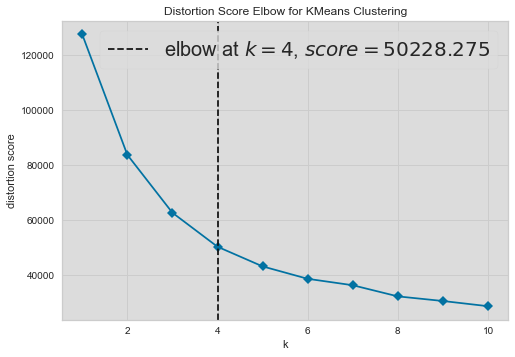

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [117]:
# Modèle
model = KMeans(random_state=123)

# Hyperparamètre k entre 1 et 11
# métrique = distortion ( calcule la somme des distances au carré entre
# chaque point et le centre qui lui est attribué)
visualizer = KElbowVisualizer(model, k=(1, 11), timings=False)

# Entraîne le modèle
visualizer.fit(encoded_df10_sampl)
visualizer.show()

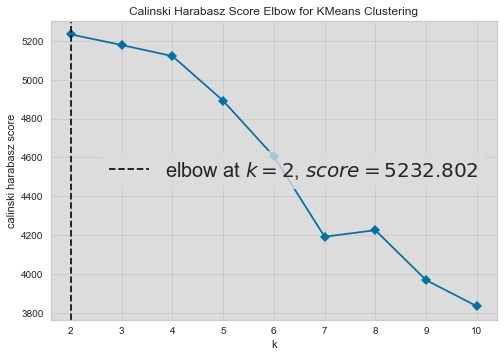

<AxesSubplot:title={'center':'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [118]:
# Modèle
model = KMeans(random_state=123)

# Hyperparamètre k entre 1 et 11
# métrique = calinski_harabasz (calcule le rapport de dispersion entre
# et au sein des clusters)
visualizer = KElbowVisualizer(model, k=(2, 11),
                              metric='calinski_harabasz', timings=False)

# Entraîne le modèle
visualizer.fit(encoded_df10_sampl)
visualizer.show()

C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


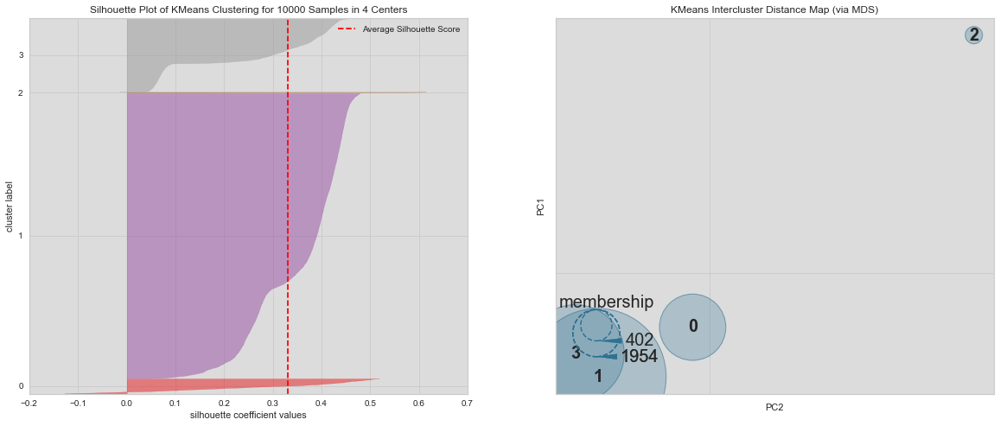

For n_clusters = 4 The average silhouette_score is : 0.3310732400244565 



C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


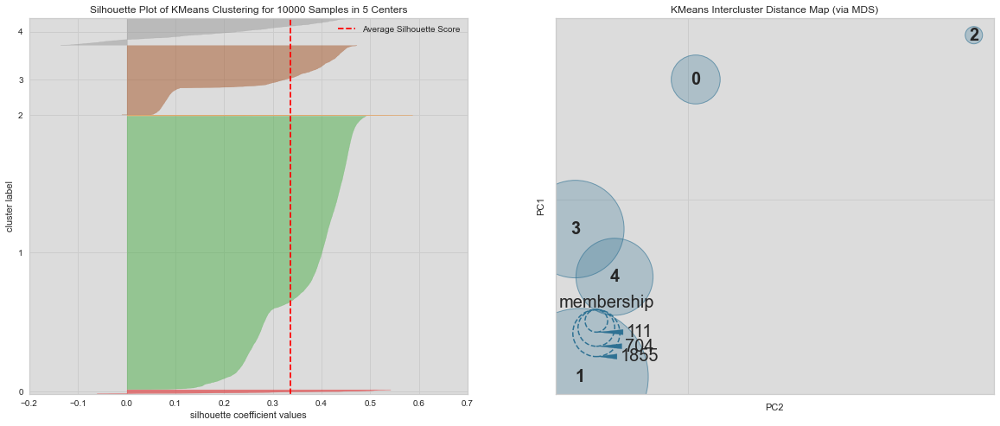

For n_clusters = 5 The average silhouette_score is : 0.3353720564892886 



C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


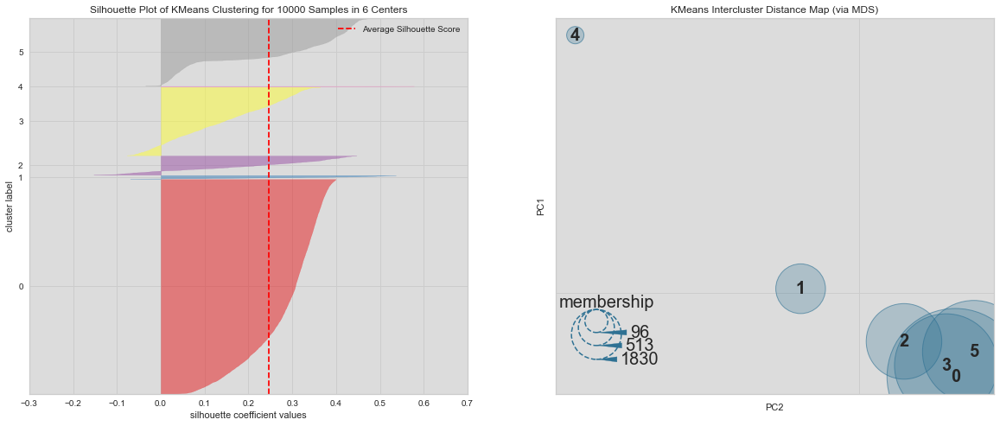

For n_clusters = 6 The average silhouette_score is : 0.2467776399506806 



C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


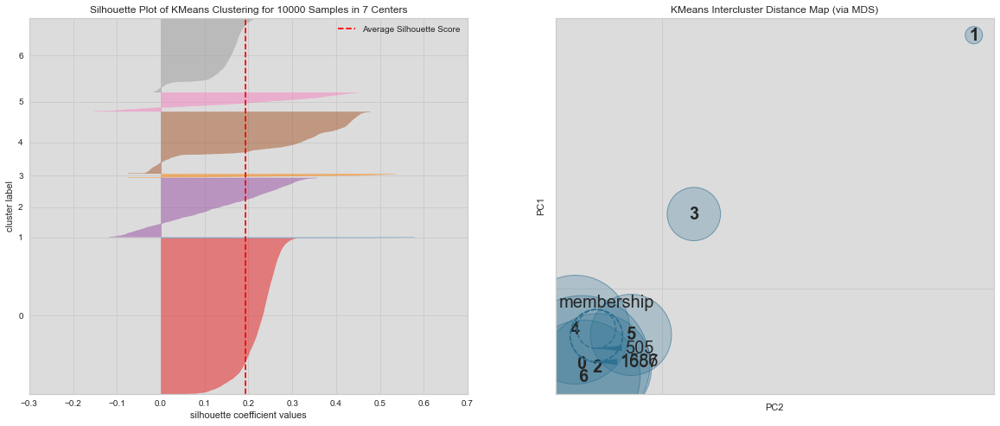

For n_clusters = 7 The average silhouette_score is : 0.1939299515478539 



C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


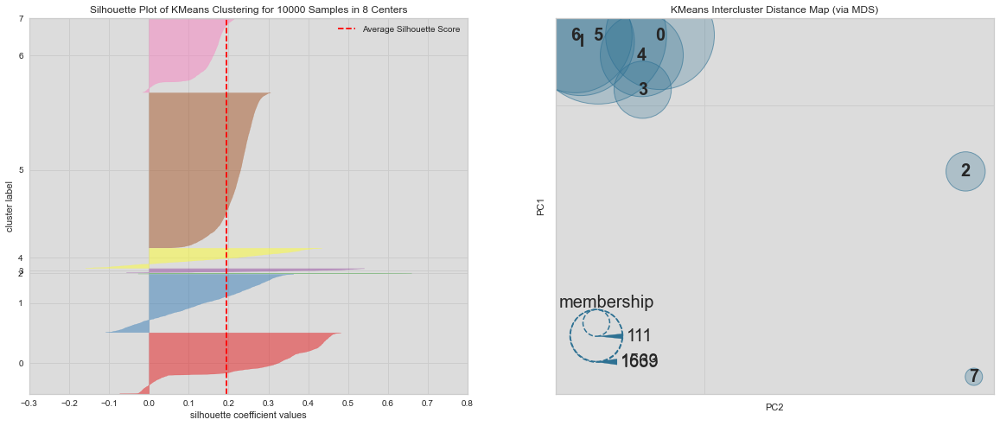

For n_clusters = 8 The average silhouette_score is : 0.19474181276130745 



In [119]:
# Silouhette score evaluation and visualisation
#   & Intercluster distance Map with best k
for k in range(4, 9):
    
    # Initialize the clusterer with k clusters value and a random generator
    # seed of 123 for reproducibility.
    model = KMeans(n_clusters=k,
                   random_state=123)
    cluster_labels = model.fit_predict(encoded_df10_sampl)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters    
    silhouette_avg = silhouette_score(encoded_df10_sampl, cluster_labels)
    fig, axes = plt.subplots(nrows=1,
                             ncols=2,
                             sharex=False,
                             sharey=False,
                             figsize=(20, 8))

    visualizer = SilhouetteVisualizer(model,
                                      ax=axes[0])
    distance_visualizer = InterclusterDistance(model,
                                               ax=axes[1])
    visualizer.fit(encoded_df10_sampl)
    distance_visualizer.fit(encoded_df10_sampl)

    visualizer.finalize()
    distance_visualizer.show()
    
    print(
    "For n_clusters =",
    k,
    "The average silhouette_score is :",
    silhouette_avg, '\n'
    )

C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


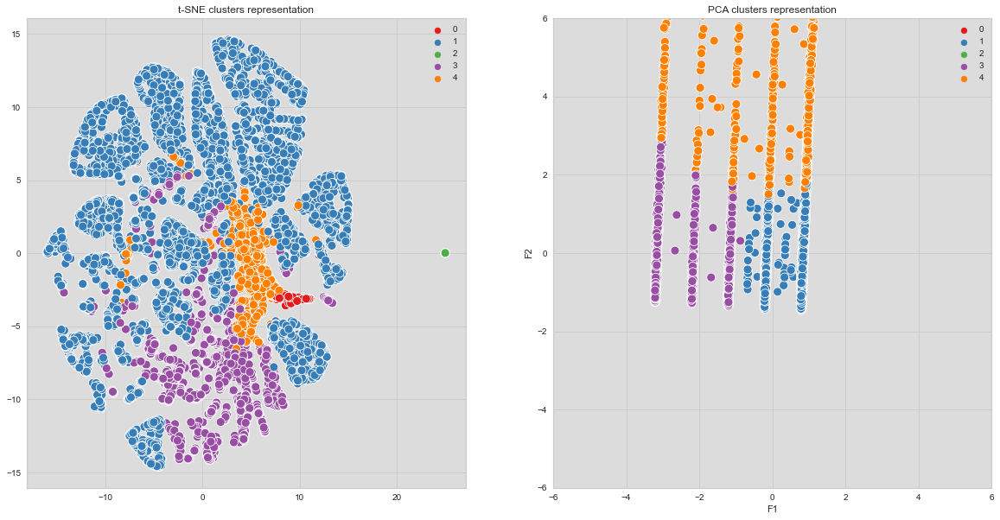

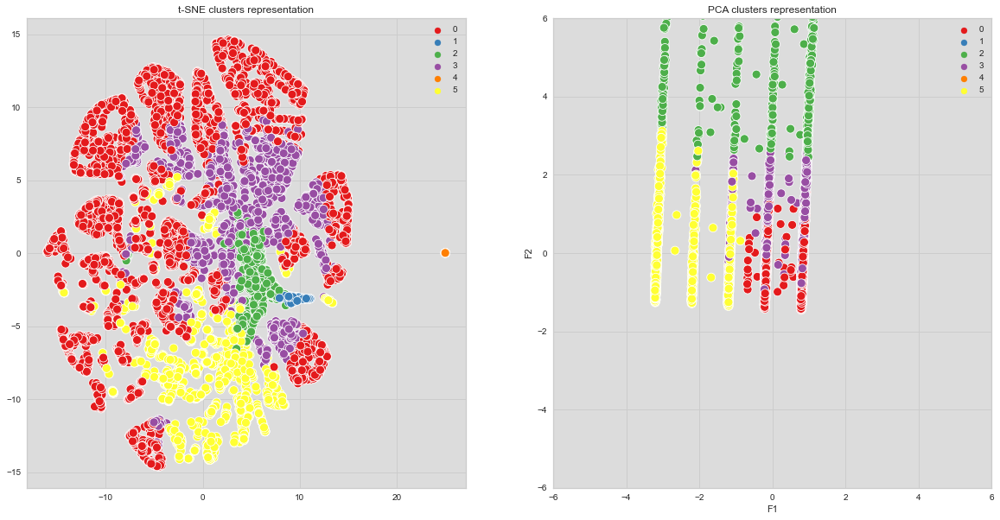

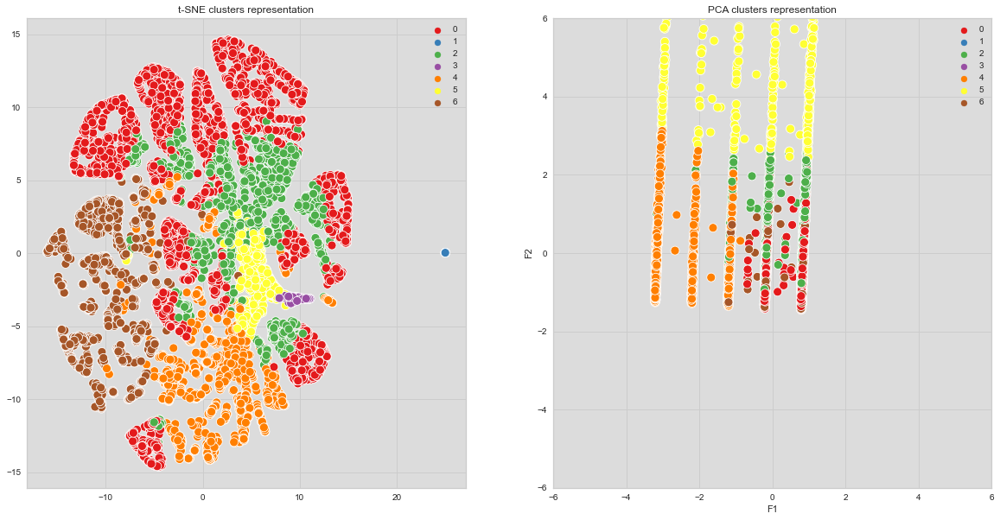

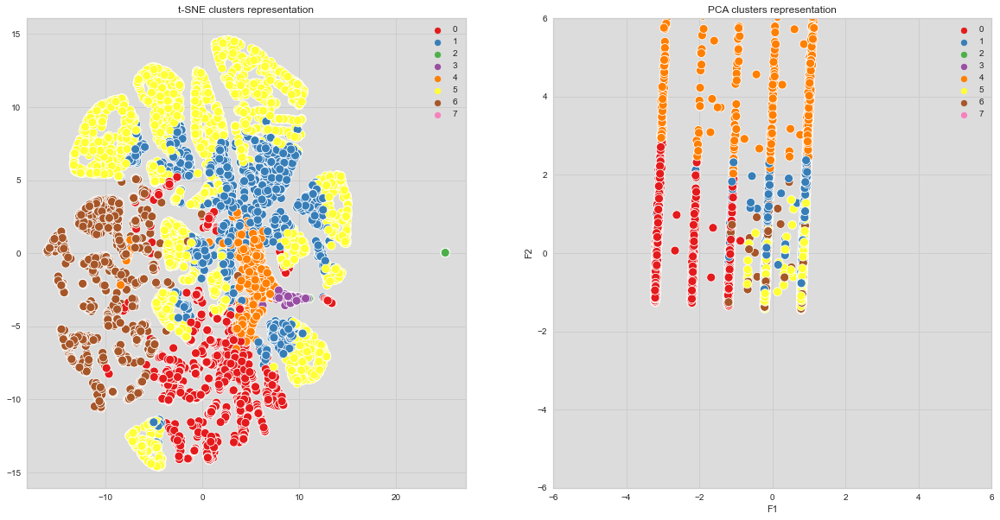

In [120]:
# Modèle
model = KMeans(random_state=123)

# Show visualisation with dimension reduction for different number of cluster
for k in range(5, 9):
    two_dim_viz(X=encoded_df10_sampl,
                model=KMeans(n_clusters=k,
                             max_iter=1000,
                             n_init=10,
                             random_state=123))

Les scores des clusterings avec les variables catégorielles sont moins bons. Le poids des variables categorielles masque les autres axes de categorisation important (RFM). Pour les modèles finaux nous allons choisir 6 varaibles numériques. Les variables catégorielles peuvent être ensuite utilisées pour la description des clusters.  

### Evaluation des clusters K-means

**Vérification des résultats sur le dataset complet sur la base de df9 (6 variables numériques)**

In [121]:
df_fin = df9.copy()

In [122]:
df_resultats_fin = pd.DataFrame()

In [123]:
# Standardisation RobustScaler
scaler = RobustScaler()
df_fin_scaled = scaler.fit_transform(df_fin)

# Dataframe
df_fin_scaled = pd.DataFrame(df_fin_scaled, index=df_fin.index,
                             columns=df_fin.columns)

In [124]:
# Test du modèle

for k in range(2, 10):
    pred_kmeans = KMeans(n_clusters=k,
                   random_state=123).fit_predict(df_fin_scaled)
    
    df_resultats_fin = \
    calcul_comp_clustering('KMeans', df_fin_scaled,
                                    pred_kmeans,
                                    df_resultats_fin)
df_resultats_fin.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz
KMeans,2,0.951228,0.496285,50872.568432
KMeans,3,0.817059,0.555325,58790.445279
KMeans,4,0.657600,0.646124,61413.282669
KMeans,5,0.428077,0.766106,64880.926592
KMeans,6,0.438416,0.747619,67566.130316
KMeans,7,0.439251,0.719568,68383.065376
KMeans,8,0.371985,0.833048,69839.074860
KMeans,9,0.369252,0.820718,69155.977962


<AxesSubplot:xlabel='Nb_clusters', ylabel='coef_silh'>

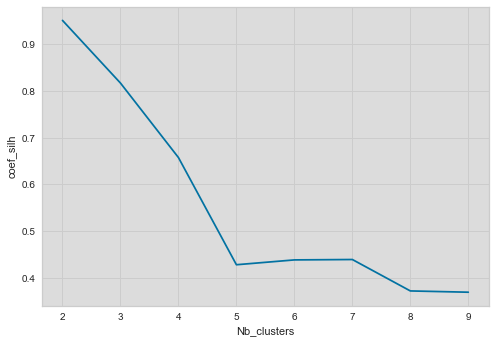

In [125]:
sns.lineplot(x="Nb_clusters", y="coef_silh", data=df_resultats_fin)

<AxesSubplot:xlabel='Nb_clusters', ylabel='davies_bouldin'>

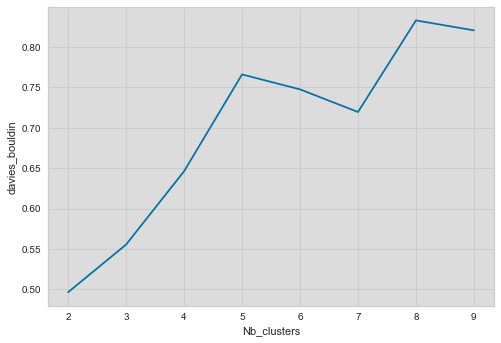

In [126]:
sns.lineplot(x="Nb_clusters", y="davies_bouldin", data=df_resultats_fin)

<AxesSubplot:xlabel='Nb_clusters', ylabel='calinski_harabasz'>

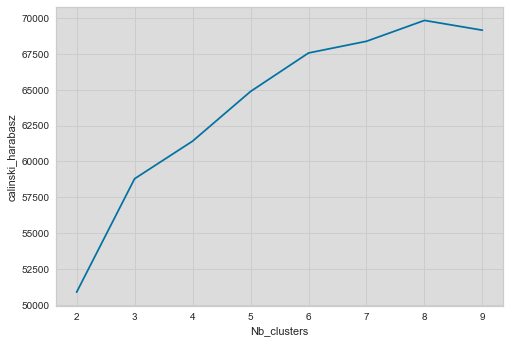

In [127]:
sns.lineplot(x="Nb_clusters", y="calinski_harabasz", data=df_resultats_fin)

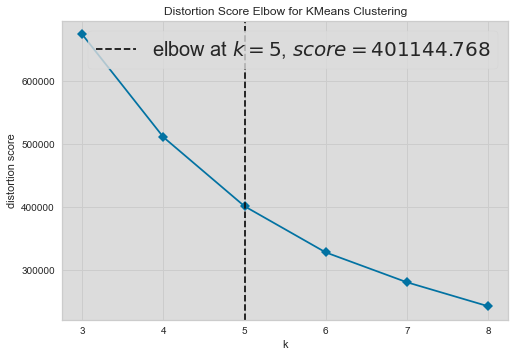

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [128]:
# Modèle
model = KMeans(random_state=123)

# Hyperparamètre k entre 1 et 11
# métrique = distortion ( calcule la somme des distances au carré entre
# chaque point et le centre qui lui est attribué)
visualizer = KElbowVisualizer(model, k=(3, 9), timings=False)

# Entraîne le modèle
visualizer.fit(df_fin_scaled)
visualizer.show()

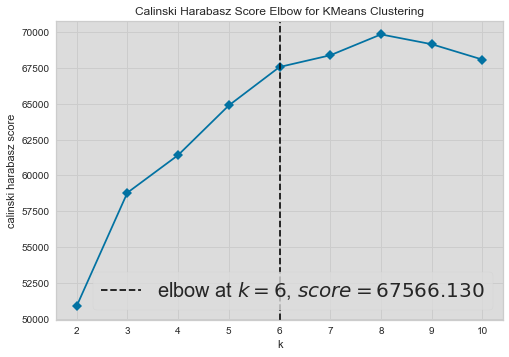

<AxesSubplot:title={'center':'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [129]:
# Modèle
model = KMeans(random_state=123)

# Hyperparamètre k entre 3 et 9
# métrique = calinski_harabasz (calcule le rapport de dispersion entre
# et au sein des clusters)
visualizer = KElbowVisualizer(model, k=(2, 11),
                              metric='calinski_harabasz', timings=False)

# Entraîne le modèle
visualizer.fit(df_fin_scaled)
visualizer.show()

C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


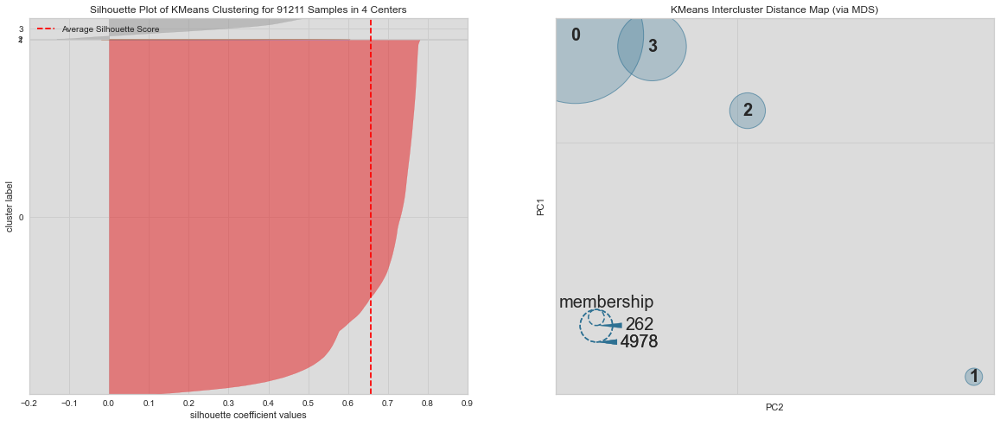

For n_clusters = 4 The average silhouette_score is : 0.6575995234664856 



C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


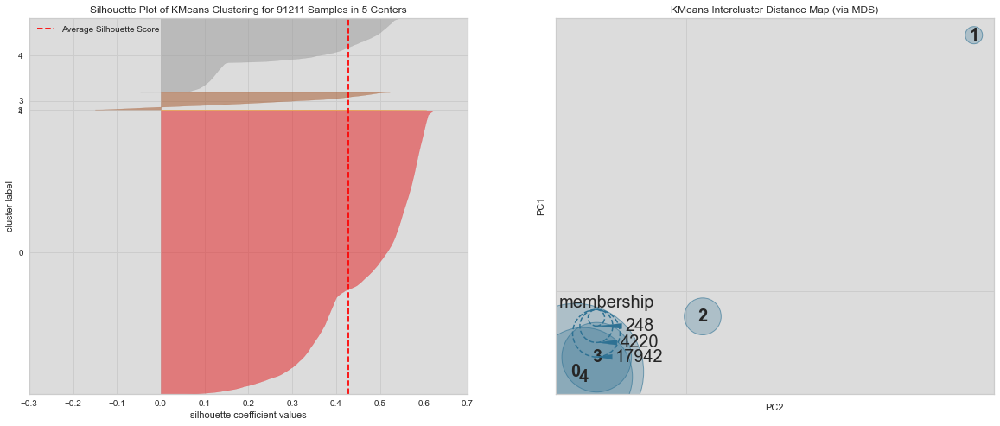

For n_clusters = 5 The average silhouette_score is : 0.4280772797887622 



C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_mds.py:506: UserWarning: The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.
  warnings.warn(


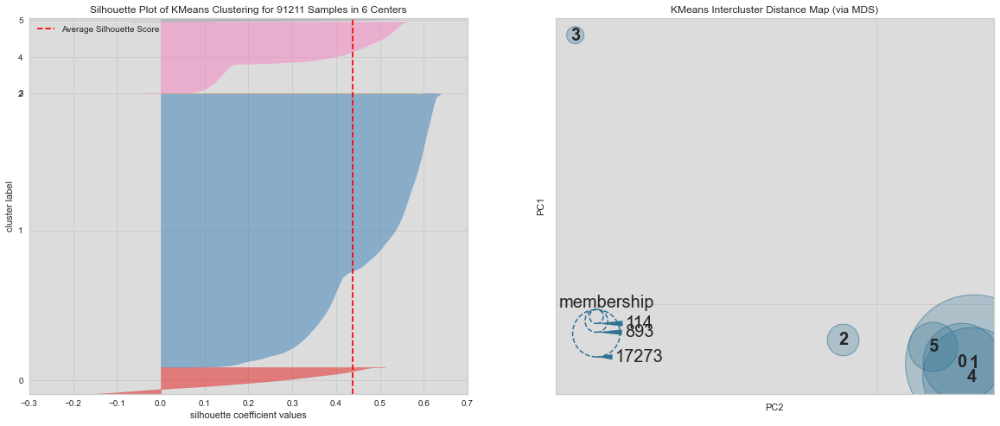

For n_clusters = 6 The average silhouette_score is : 0.4384160454092511 



C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


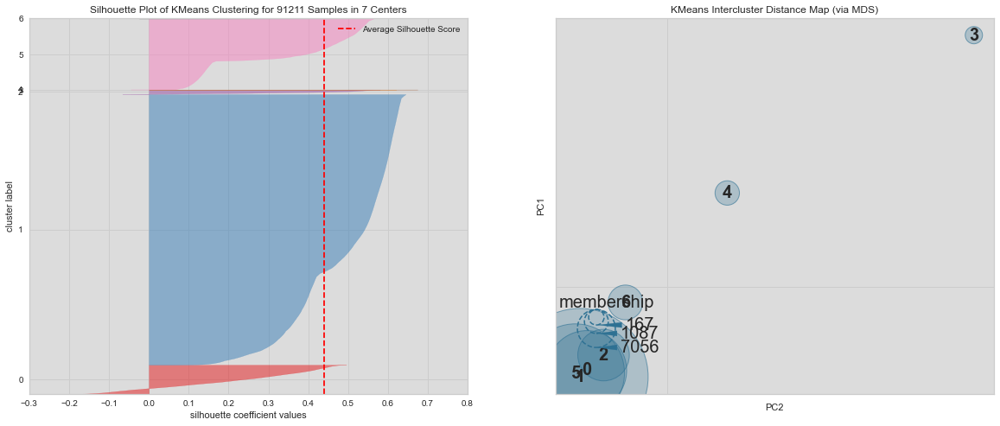

For n_clusters = 7 The average silhouette_score is : 0.43925094002015336 



In [130]:
# Silouhette score evaluation and visualisation
#   & Intercluster distance Map with best k
for k in range(4, 8):
    
    # Initialize the clusterer with k clusters value and a random generator
    # seed of 123 for reproducibility.
    model = KMeans(n_clusters=k,
                   random_state=123)
    cluster_labels = model.fit_predict(df_fin_scaled)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters    
    silhouette_avg = silhouette_score(df_fin_scaled, cluster_labels)
    fig, axes = plt.subplots(nrows=1,
                             ncols=2,
                             sharex=False,
                             sharey=False,
                             figsize=(20, 8))

    visualizer = SilhouetteVisualizer(model,
                                      ax=axes[0])
    distance_visualizer = InterclusterDistance(model,
                                               ax=axes[1])
    visualizer.fit(df_fin_scaled)
    distance_visualizer.fit(df_fin_scaled)

    visualizer.finalize()
    distance_visualizer.show()
    
    print(
    "For n_clusters =",
    k,
    "The average silhouette_score is :",
    silhouette_avg, '\n'
    )

C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
C:\Users\mfila\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


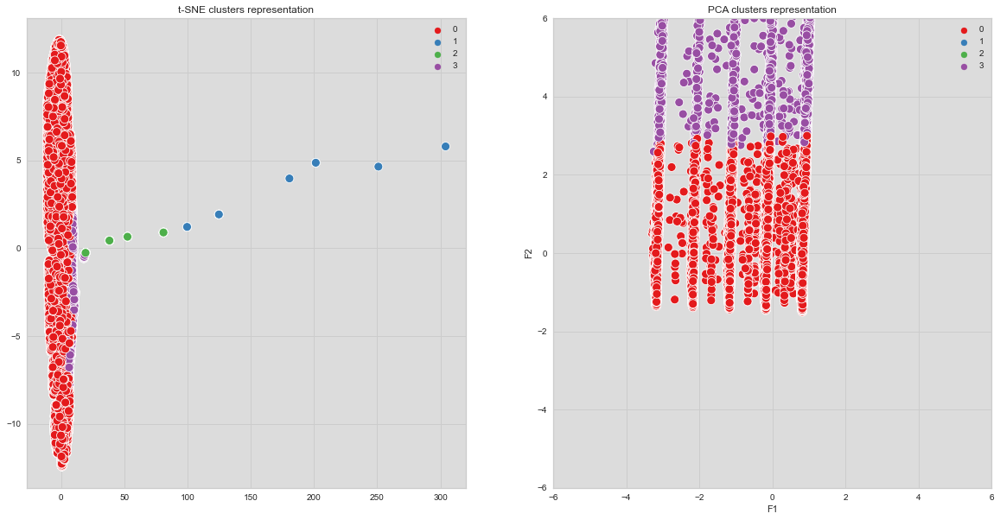

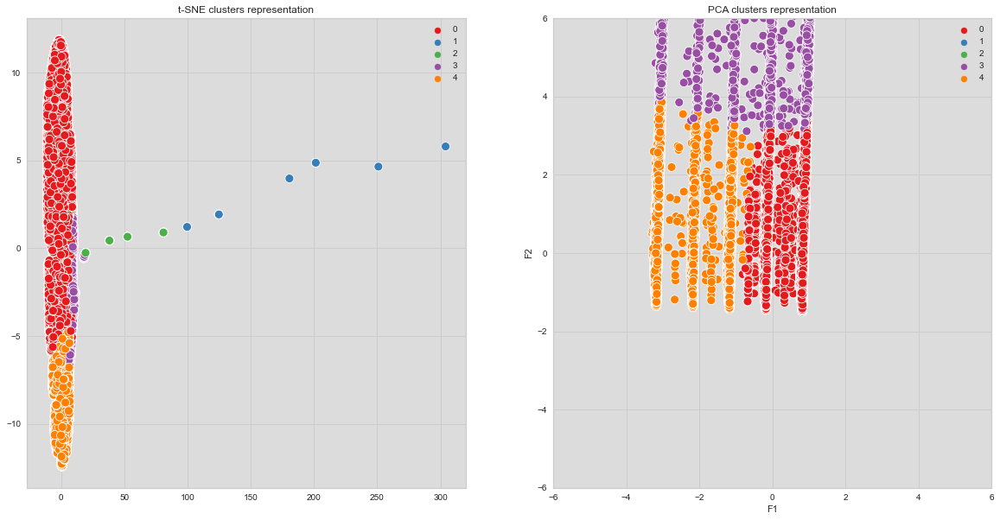

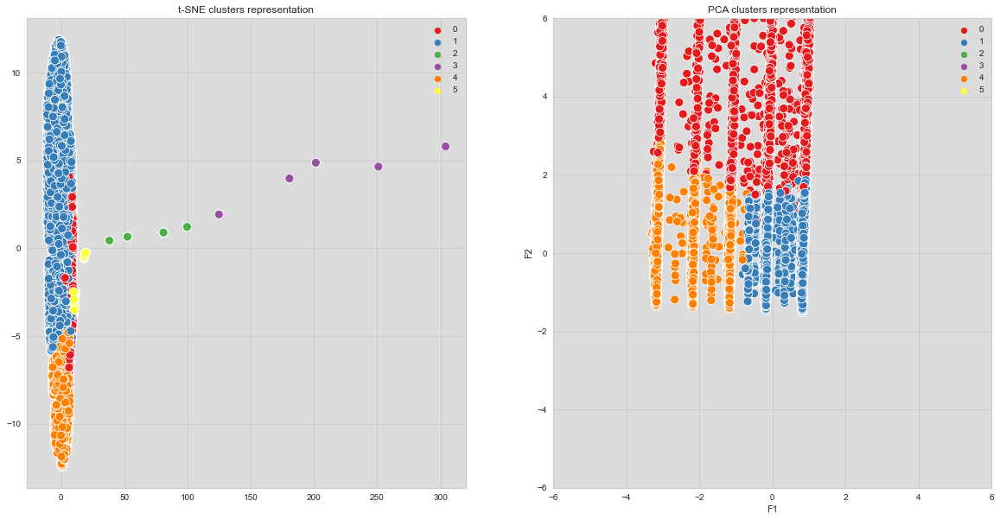

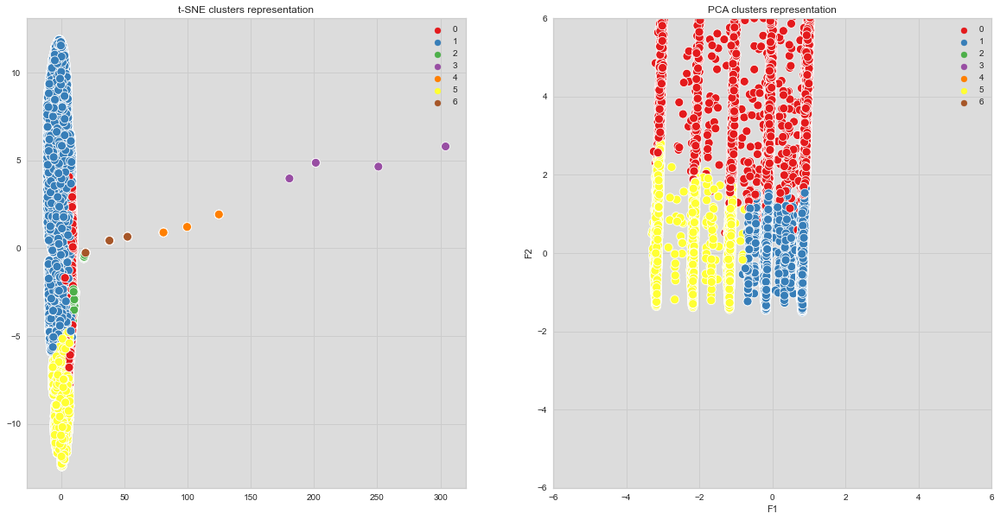

In [131]:
# Show visualisation with dimension reduction for different number of cluster
for k in range(4, 8):
    two_dim_viz(X=df_fin_scaled,
                model=KMeans(n_clusters=k,                             
                             random_state=123))

In [132]:
df_fin_clust = df_fin.copy()
df_fin_clust.loc[:, ('cluster')] = KMeans(n_clusters=5,random_state=123).fit_predict(df_fin_scaled)

In [133]:
df_fin_clust.cluster.value_counts().sort_index()

0    68782
1       19
2      248
3     4220
4    17942
Name: cluster, dtype: int64

**Modèle avec 6 variables et 4 clusters**

In [134]:
# Best model fitting

model_fin4 = KMeans(n_clusters=4,
                   random_state=123)

model_fin4.fit_transform(df_fin_scaled)
df_fin4 = df_fin.copy()
df_fin4.loc[:, ('cluster')] = model_fin4.predict(df_fin_scaled)

<AxesSubplot:>

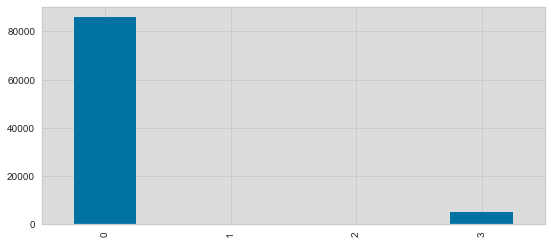

In [135]:

# Distribution of the customers
pd.Series(model_fin4.labels_).value_counts().sort_index().plot.bar(figsize=(9, 4))

In [136]:
pd.Series(model_fin4.labels_).value_counts().sort_index()

0    85952
1       19
2      262
3     4978
dtype: int64

In [137]:
# Function to create PCA correlation circle

def cerle_corr(n_comp, pca, axis_ranks,
               labels=None, label_rotation=0):

    pcs = pca.fit(df_fin_scaled).components_

    fig = plt.figure(figsize=(20, n_comp*5))
    count = 1
    for d1, d2 in axis_ranks:
        if d2 < n_comp:

            # plot init
            fig.subplots_adjust(left=0.1,
                                right=0.9,
                                bottom=0.1,
                                top=0.9)
            ax = plt.subplot(int(n_comp / 2), 2, count)
            ax.set_aspect('equal', adjustable='box')

            # Gaphics limit definition
            ax.set_xlim(-1, 1)
            ax.set_ylim(-1, 1)
            
             # shows arrow
            ax.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                      pcs[d1, ], pcs[d2, :],
                      angles='xy', scale_units='xy', scale=1,
                      color="grey", alpha=0.5)
            # and variable name
            for i, (x, y) in enumerate(pcs[[d1, d2]].T):
                ax.annotate(labels[i], (x, y),
                            ha='center', va='center',
                            fontsize='14', color="#17aafa", alpha=0.8)

            # add axis
            ax.plot([-1, 1], [0, 0], linewidth=1, color='grey', ls='--')
            ax.plot([0, 0], [-1, 1], linewidth=1, color='grey', ls='--')

            # add circle
            cercle = plt.Circle((0, 0), 1, color='#17aafa', fill=False)
            ax.add_artist(cercle)

            # axis name, and explicate inertia percentage
            ax.set_xlabel('F{} ({}%)'
                          .format(d1+1,
                                  round(100*pca
                                        .explained_variance_ratio_[d1], 1)))
            ax.set_ylabel('F{} ({}%)'
                          .format(d2+1,
                                  round(100*pca
                                        .explained_variance_ratio_[d2], 1)))
            
            ax.set_title("Correlation circle (F{} and F{})".format(d1+1, d2+1))
            count += 1

    plt.suptitle("Correlation circle of {} first axes".format(n_comp),
                 y=.9, color="blue", fontsize=18)
    plt.show(block=False)

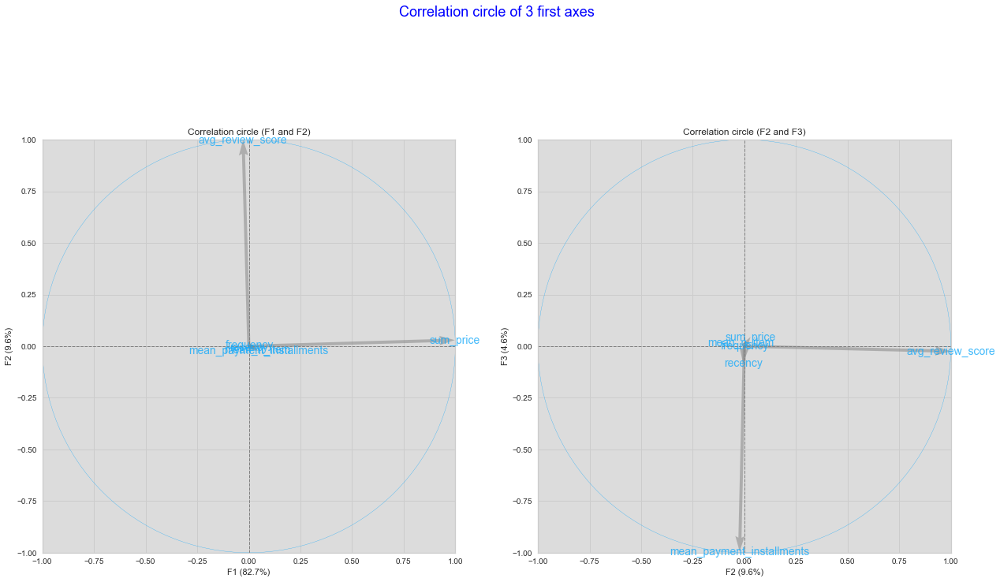

In [138]:
# Plot correlation circle
cerle_corr(n_comp=3,
           pca=PCA(3),
           axis_ranks=[(0, 1), (1, 2)],
           labels=np.array(df_fin_scaled.columns))

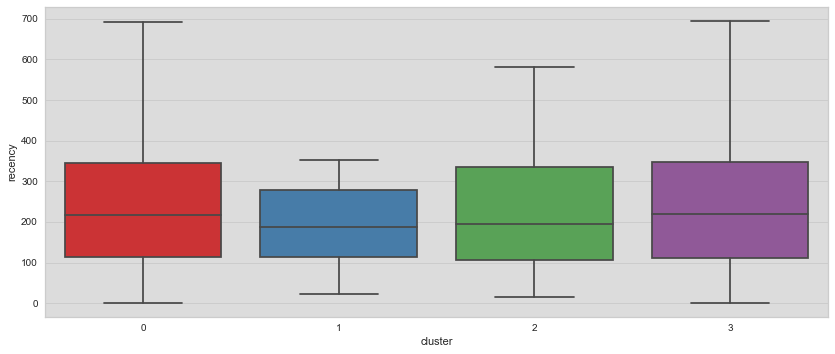

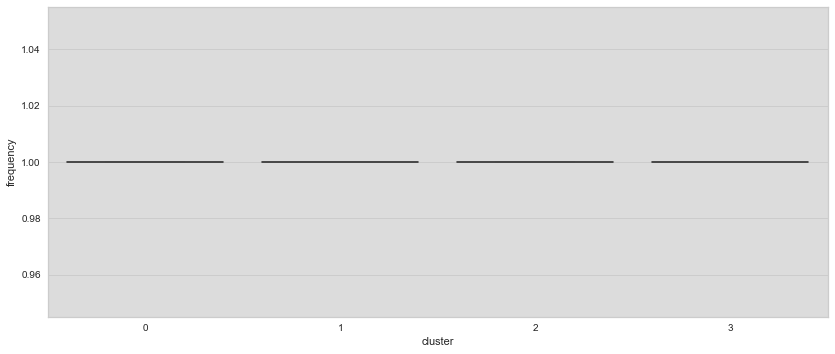

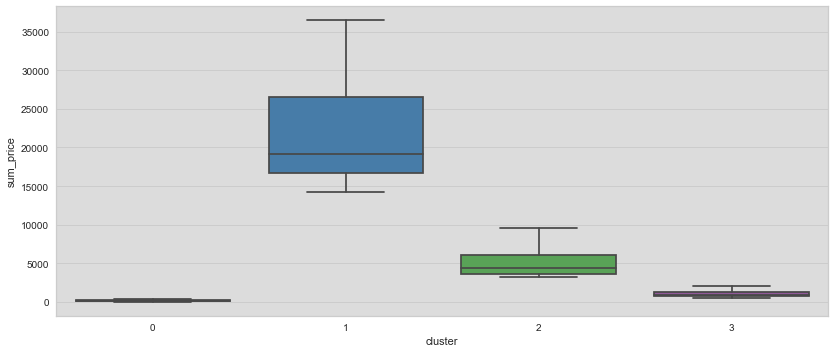

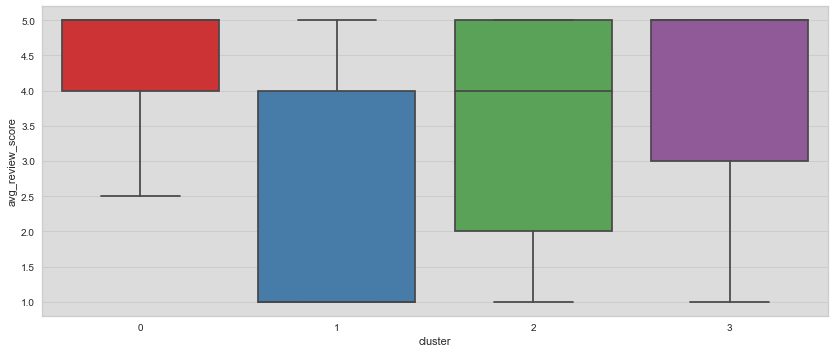

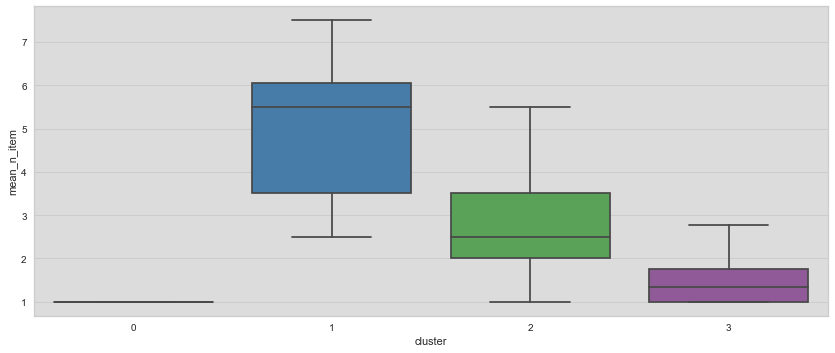

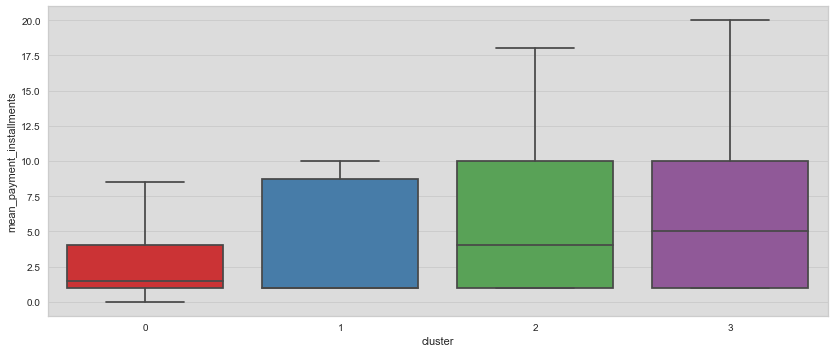

In [139]:
# Boxplot of each featurs per cluster
for i, col in enumerate(df_fin4.iloc[:, :-1].columns):
    plt.figure(figsize=(12, (df_fin4.shape[1]) * 5))
    plt.subplot(df_fin4.shape[1], 1, i+1)
    sns.boxplot(data=df_fin4,
                y=col,
                x='cluster',
                palette='Set1',
                showfliers = False)
    plt.tight_layout()
plt.show()

In [140]:
# NB: df_clust is the untransformed database with clustering result at the end
X, y = df_fin4.iloc[:,:-1], df_fin4.iloc[:,-1]

In [141]:
from sklearn.tree import DecisionTreeClassifier

tree = DecisionTreeClassifier(max_depth=6, random_state=14)
tree = tree.fit(X, y)

In [142]:
feature_importances = pd.Series(tree.feature_importances_,
                                index = X.columns,
                                name='Feature importance')\
                                .sort_values(ascending=False)
feature_importances

sum_price                    0.972464
mean_payment_installments    0.019531
avg_review_score             0.007648
mean_n_item                  0.000222
recency                      0.000135
frequency                    0.000000
Name: Feature importance, dtype: float64

In [143]:
# Calculate average values for each RFM cluster,
# and return a size of each segment
df_fin4_agg = df_fin4.groupby('cluster').agg({
    'recency': ['mean', 'max', 'min'],
    'frequency': ['mean'],
    'sum_price': ['mean'],
    'avg_review_score': ['mean'],
    'mean_payment_installments': ['mean'],
    'mean_n_item': ['mean']

}).round(1)

# Print the aggregated dataset

display(df_fin4_agg)

recency          frequency sum_price avg_review_score  \
           mean  max min      mean      mean             mean   
cluster                                                         
0         237.0  695   1       1.0     140.7              4.2   
1         193.6  352  22       1.3   22067.2              2.3   
2         229.2  694  14       1.1    5191.9              3.5   
3         238.7  694   1       1.1    1082.2              3.8   

        mean_payment_installments mean_n_item  
                             mean        mean  
cluster                                        
0                             2.7         1.0  
1                             4.8         5.3  
2                             4.9         2.7  
3                             5.5         1.5

In [144]:
# Function to have spider chart
import plotly.graph_objs as go


def plot_radars(data, group, highlight=False, which='none'):

    # Find the mean for each group
    data = data.groupby(group).mean()
    
    # We use a MinMaxScaler to scale each features
    scaler = MinMaxScaler()
    data = pd.DataFrame(scaler.fit_transform(data),
                        index=data.index,
                        columns=data.columns).reset_index()

    fig = go.Figure()
    # if highlight is true the choosen cluster can be 'highlighted'
    if highlight == True:
        for k in data[group]:
            if which == k:
                fig.add_trace(go.Scatterpolar(
                    r=data[data[group] == k].iloc[:, 1:].values.reshape(-1),
                    theta=data.columns[1:],
                    fill='toself',
                    name='Cluster ' + str(k),
                    opacity=1
                ))
            else:
                fig.add_trace(go.Scatterpolar(
                    r=data[data[group] == k].iloc[:, 1:].values.reshape(-1),
                    theta=data.columns[1:],
                    fill='toself',
                    name='Cluster ' + str(k),
                    opacity= 0.2
                ))
    else:
        for k in data[group]:
            fig.add_trace(go.Scatterpolar(
                r=data[data[group] == k].iloc[:, 1:].values.reshape(-1),
                theta=data.columns[1:],
                fill='toself',
                
                name='Cluster ' + str(k)
            ))
            

    fig.update_layout(
        autosize=False,
        width=600,
        height=600,
        polar=dict(
        radialaxis=dict(
          visible=True,
          range=[0, 1]
        )),
        showlegend=True,
        title={
            'text': "Cluster's profile comparison",
            'y':0.95,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'},
        title_font_color="black",
        title_font_size=18)

    fig.show()

In [145]:
plot_radars(df_fin4,'cluster')

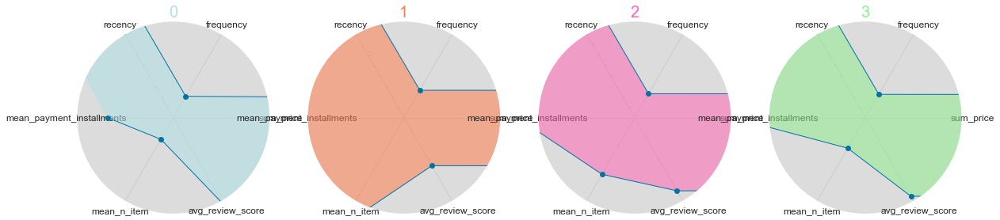

In [146]:
# Radarplot des différents types de client
# ---------------------------------------------------------------------

df_plot = df_fin4.groupby('cluster')[['recency', 'frequency', 'sum_price', 'avg_review_score', 'mean_n_item',
       'mean_payment_installments']].mean()
plt.rc('axes', facecolor='Gainsboro')

# number of variable
categories = list(df_plot.columns)

N = len(categories)

# What will be the angle of each axis in the plot? (we divide the plot /
# number of variable)
angles = [n / float(N) * 2 * pi for n in range(N)]


fig = plt.figure(1, figsize=(20, 18))

colors = ['PowderBlue', 'Coral', 'HotPink', 'LightGreen']

for i, region in enumerate(df_plot.index):

    ax = fig.add_subplot(3, 4, i+1, polar=True)

    ax.set_theta_offset(2*pi/3)
    ax.set_theta_direction(-1)
    ax.set_rlabel_position(0)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles, categories, size=10)
    plt.yticks(color="grey", size=2)
    values = df_plot.iloc[i].values
    ax.plot(angles, values, 'o-', linewidth=1, linestyle='solid')
    ax.fill(angles, values, colors[i], alpha=0.55)
    ax.set_xticks(angles)
    ax.set_xticklabels(categories, fontsize=12)
    ax.set_title(region, size=20, color=colors[i])
    ax.grid(True)
    plt.grid(True)
    plt.ylim(0, 4)

plt.show()

**Modèle avec 6 variables et 7 clusters**

In [147]:
# Best model fitting

model_fin7 = KMeans(n_clusters=7,
                   random_state=123)

model_fin7.fit_transform(df_fin_scaled)
df_fin7 = df_fin.copy()
df_fin7.loc[:, ('cluster')] = model_fin7.predict(df_fin_scaled)

<AxesSubplot:>

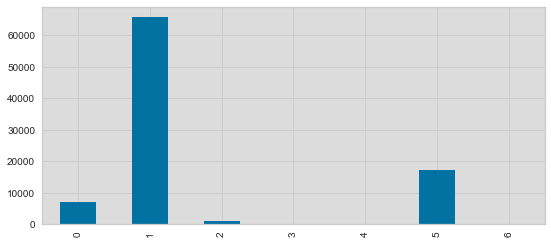

In [148]:

# Distribution of the customers
pd.Series(model_fin7.labels_).value_counts().sort_index().plot.bar(figsize=(9, 4))

In [149]:
pd.Series(model_fin7.labels_).value_counts().sort_index()

0     7056
1    65715
2     1087
3        6
4       23
5    17157
6      167
dtype: int64

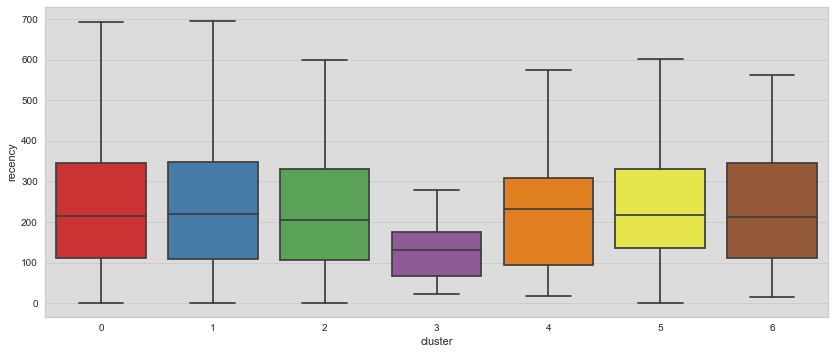

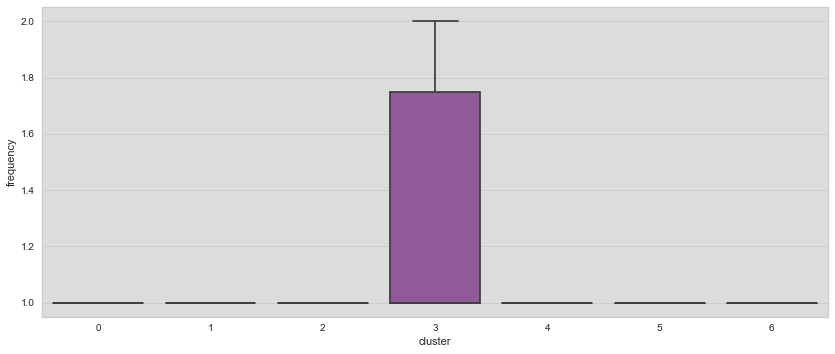

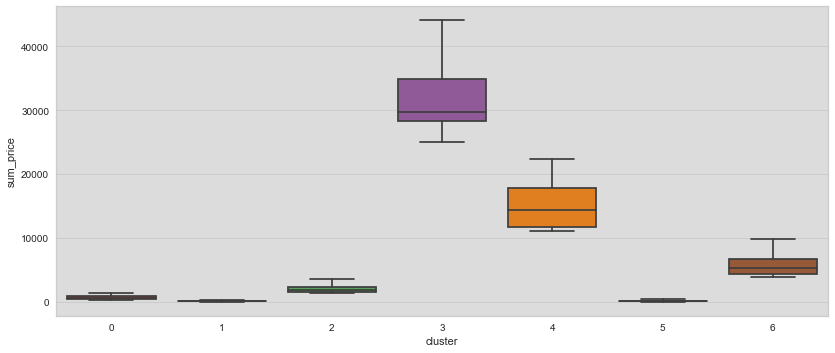

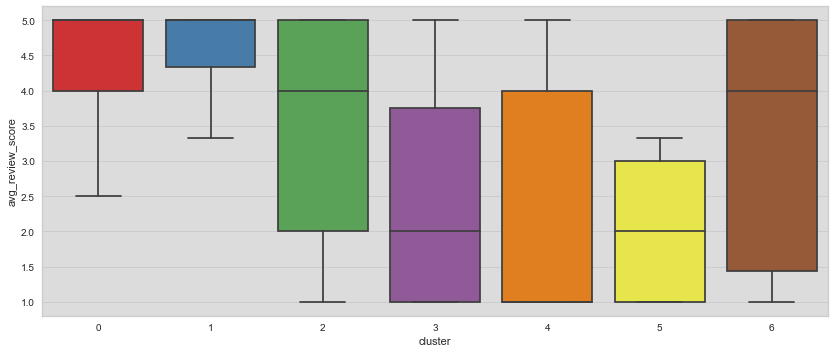

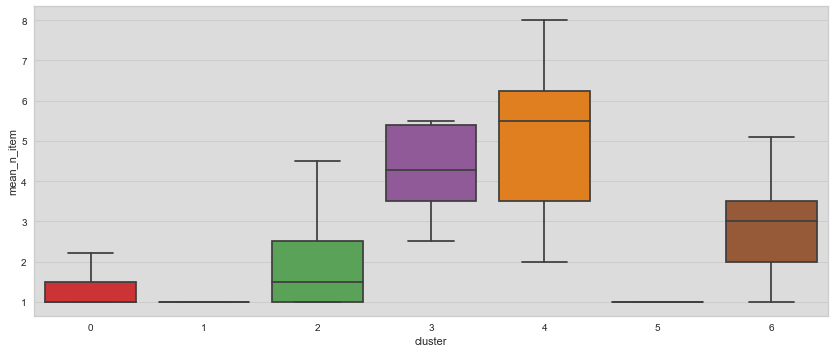

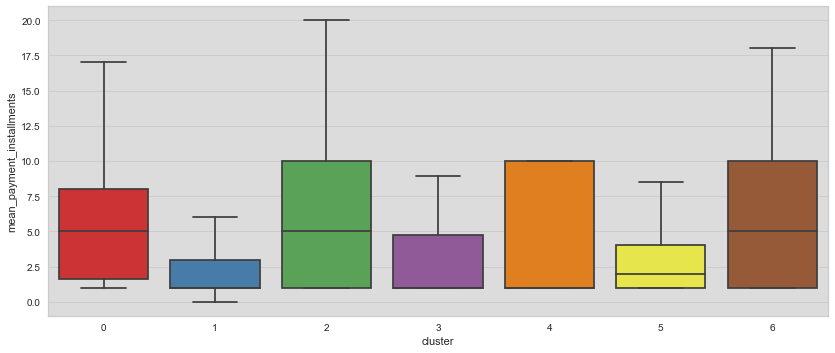

In [150]:
# Boxplot of each featurs per cluster
for i, col in enumerate(df_fin7.iloc[:, :-1].columns):
    plt.figure(figsize=(12, (df_fin4.shape[1]) * 5))
    plt.subplot(df_fin7.shape[1], 1, i+1)
    sns.boxplot(data=df_fin7,
                y=col,
                x='cluster',
                palette='Set1',
                showfliers = False)
    plt.tight_layout()
plt.show()

In [151]:
# NB: df_clust is the untransformed database with clustering result at the end
X, y = df_fin7.iloc[:,:-1], df_fin7.iloc[:,-1]

In [152]:
from sklearn.tree import DecisionTreeClassifier

tree = DecisionTreeClassifier(max_depth=6, random_state=14)
tree = tree.fit(X, y)

In [153]:
feature_importances = pd.Series(tree.feature_importances_,
                                index = X.columns,
                                name='Feature importance')\
                                .sort_values(ascending=False)
feature_importances

avg_review_score             0.629125
sum_price                    0.354620
mean_payment_installments    0.016255
recency                      0.000000
frequency                    0.000000
mean_n_item                  0.000000
Name: Feature importance, dtype: float64

In [154]:
# Calculate average values for each RFM cluster,
# and return a size of each segment
df_fin7_agg = df_fin7.groupby('cluster').agg({
    'recency': ['mean', 'max', 'min'],
    'frequency': ['mean'],
    'sum_price': ['mean'],
    'avg_review_score': ['mean'],
    'mean_payment_installments': ['mean'],
    'mean_n_item': ['mean']

}).round(1)

# Print the aggregated dataset

display(df_fin7_agg)

recency          frequency sum_price avg_review_score  \
           mean  max min      mean      mean             mean   
cluster                                                         
0         237.1  695   1       1.1     701.0              4.1   
1         236.0  695   1       1.0     123.6              4.7   
2         232.0  694   1       1.1    2074.4              3.6   
3         132.5  279  22       1.7   32135.0              2.5   
4         220.6  576  18       1.1   14914.6              2.5   
5         241.6  695   1       1.0     143.1              2.0   
6         238.6  563  16       1.1    5675.5              3.4   

        mean_payment_installments mean_n_item  
                             mean        mean  
cluster                                        
0                             5.4         1.3  
1                             2.6         1.0  
2                             5.4         1.8  
3                             3.2         5.1  
4                             4.8         5.0  
5                             2.8         1.1  
6                             5.0         2.9

In [155]:
# Function to have spider chart
import plotly.graph_objs as go


def plot_radars(data, group, highlight=False, which='none'):

    # Find the mean for each group
    data = data.groupby(group).mean()
    
    # We use a MinMaxScaler to scale each features
    scaler = MinMaxScaler()
    data = pd.DataFrame(scaler.fit_transform(data),
                        index=data.index,
                        columns=data.columns).reset_index()

    fig = go.Figure()
    # if highlight is true the choosen cluster can be 'highlighted'
    if highlight == True:
        for k in data[group]:
            if which == k:
                fig.add_trace(go.Scatterpolar(
                    r=data[data[group] == k].iloc[:, 1:].values.reshape(-1),
                    theta=data.columns[1:],
                    fill='toself',
                    name='Cluster ' + str(k),
                    opacity=1
                ))
            else:
                fig.add_trace(go.Scatterpolar(
                    r=data[data[group] == k].iloc[:, 1:].values.reshape(-1),
                    theta=data.columns[1:],
                    fill='toself',
                    name='Cluster ' + str(k),
                    opacity= 0.2
                ))
    else:
        for k in data[group]:
            fig.add_trace(go.Scatterpolar(
                r=data[data[group] == k].iloc[:, 1:].values.reshape(-1),
                theta=data.columns[1:],
                fill='toself',
                
                name='Cluster ' + str(k)
            ))
            

    fig.update_layout(
        autosize=False,
        width=600,
        height=600,
        polar=dict(
        radialaxis=dict(
          visible=True,
          range=[0, 1]
        )),
        showlegend=True,
        title={
            'text': "Cluster's profile comparison",
            'y':0.95,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'},
        title_font_color="black",
        title_font_size=18)

    fig.show()

In [156]:
plot_radars(df_fin7,'cluster')

### Meilleur modèle k-means, analyse des clusters

**Modèle avec 6 variables et 5 clusters**

In [157]:
# Best model fitting

model_fin6 = KMeans(n_clusters=5,
                   random_state=123)

model_fin6.fit_transform(df_fin_scaled)
df_fin6 = df_fin.copy()
df_fin6.loc[:, ('cluster')] = model_fin6.predict(df_fin_scaled)

<AxesSubplot:>

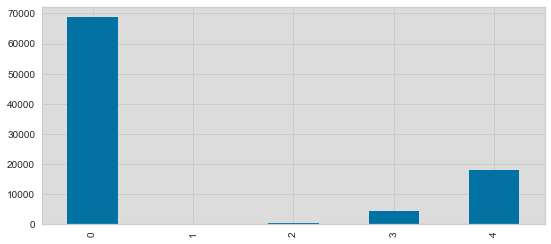

In [158]:

# Distribution of the customers
pd.Series(model_fin6.labels_).value_counts().sort_index().plot.bar(figsize=(9, 4))

In [159]:
pd.Series(model_fin6.labels_).value_counts().sort_index()

0    68782
1       19
2      248
3     4220
4    17942
dtype: int64

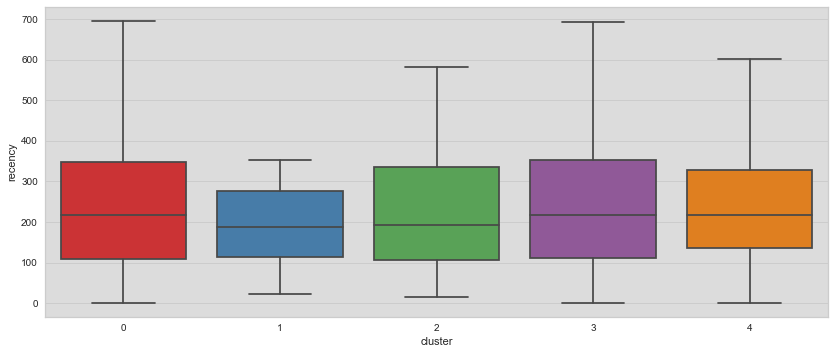

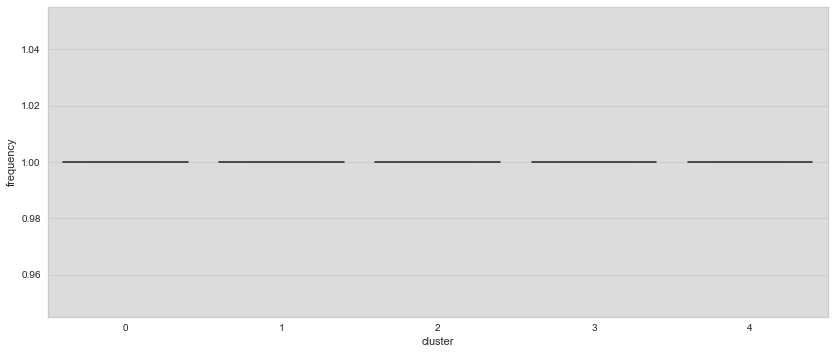

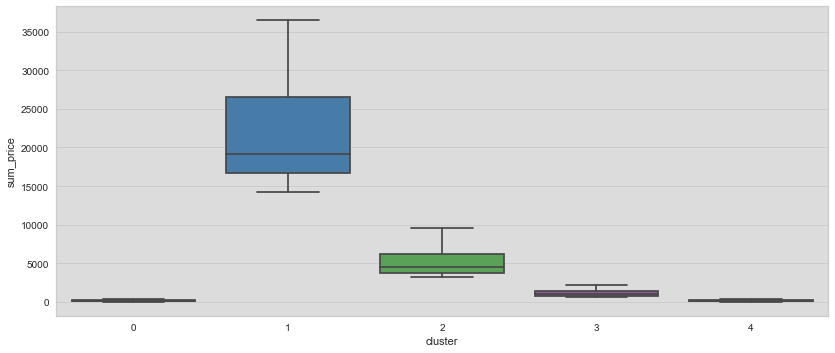

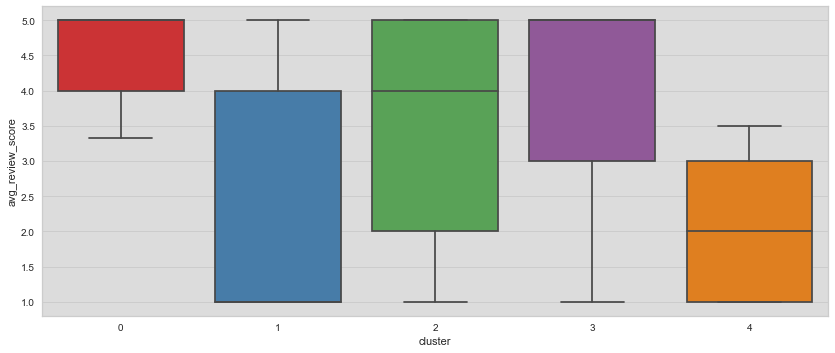

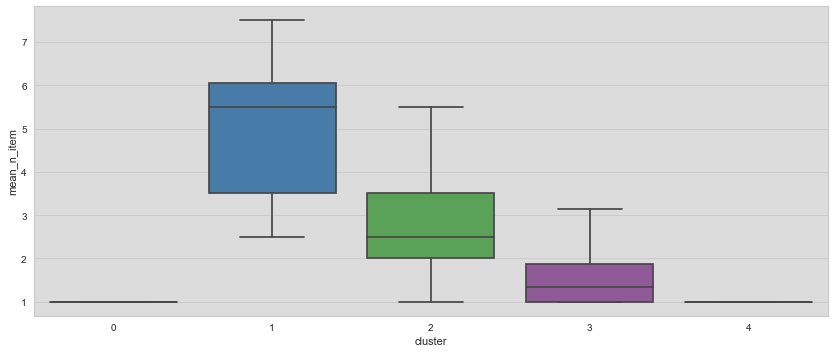

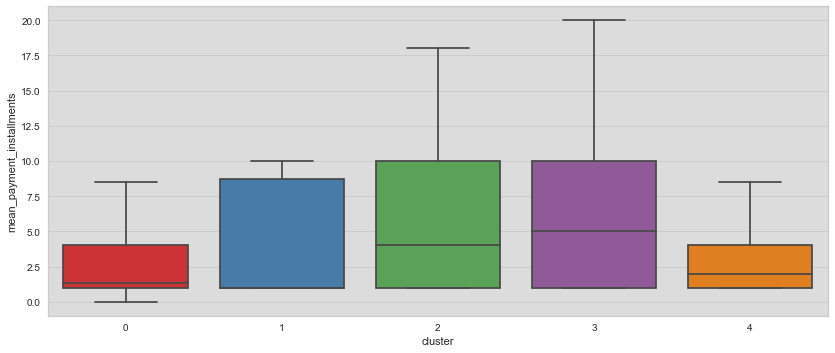

In [160]:
# Boxplot of each featurs per cluster
for i, col in enumerate(df_fin6.iloc[:, :-1].columns):
    plt.figure(figsize=(12, (df_fin6.shape[1]) * 5))
    plt.subplot(df_fin6.shape[1], 1, i+1)
    sns.boxplot(data=df_fin6,
                y=col,
                x='cluster',
                palette='Set1',
                showfliers = False)
    plt.tight_layout()
plt.show()

In [161]:
# NB: df_clust is the untransformed database with clustering result at the end
X, y = df_fin6.iloc[:,:-1], df_fin6.iloc[:,-1]

In [162]:
from sklearn.tree import DecisionTreeClassifier

tree = DecisionTreeClassifier(max_depth=6, random_state=14)
tree = tree.fit(X, y)

In [163]:
feature_importances = pd.Series(tree.feature_importances_,
                                index = X.columns,
                                name='Feature importance')\
                                .sort_values(ascending=False)
feature_importances

avg_review_score             0.764119
sum_price                    0.232316
mean_payment_installments    0.003537
recency                      0.000028
frequency                    0.000000
mean_n_item                  0.000000
Name: Feature importance, dtype: float64

In [164]:
# Calculate average values for each RFM cluster,
# and return a size of each segment
df_fin6_agg = df_fin6.groupby('cluster').agg({
    'recency': ['mean', 'max', 'min','median'],
    'frequency': ['mean'],
    'sum_price': ['mean', 'max', 'min'],
    'avg_review_score': ['mean'],
    'mean_payment_installments': ['mean'],
    'mean_n_item': ['mean']

}).round(1)

# Print the aggregated dataset

display(df_fin6_agg)

recency                 frequency sum_price                    \
           mean  max min median      mean      mean      max      min   
cluster                                                                 
0         236.0  695   1  218.0       1.0     140.7    686.4      9.6   
1         193.6  352  22  188.0       1.3   22067.2  44048.0  14196.3   
2         230.1  694  14  192.5       1.1    5304.5  12490.9   3246.5   
3         239.3  694   1  218.0       1.1    1170.3   3235.7    609.6   
4         240.9  695   1  217.0       1.0     161.9    750.6     10.9   

        avg_review_score mean_payment_installments mean_n_item  
                    mean                      mean        mean  
cluster                                                         
0                    4.7                       2.7         1.0  
1                    2.3                       4.8         5.3  
2                    3.5                       4.9         2.8  
3                    3.9                       5.5         1.5  
4                    2.0                       2.9         1.1

In [165]:
# Function to have spider chart
import plotly.graph_objs as go


def plot_radars(data, group, highlight=False, which='none'):

    # Find the mean for each group
    data = data.groupby(group).mean()
    
    # We use a MinMaxScaler to scale each features
    scaler = MinMaxScaler()
    data = pd.DataFrame(scaler.fit_transform(data),
                        index=data.index,
                        columns=data.columns).reset_index()

    fig = go.Figure()
    # if highlight is true the choosen cluster can be 'highlighted'
    if highlight == True:
        for k in data[group]:
            if which == k:
                fig.add_trace(go.Scatterpolar(
                    r=data[data[group] == k].iloc[:, 1:].values.reshape(-1),
                    theta=data.columns[1:],
                    fill='toself',
                    name='Cluster ' + str(k),
                    opacity=1
                ))
            else:
                fig.add_trace(go.Scatterpolar(
                    r=data[data[group] == k].iloc[:, 1:].values.reshape(-1),
                    theta=data.columns[1:],
                    fill='toself',
                    name='Cluster ' + str(k),
                    opacity= 0.2
                ))
    else:
        for k in data[group]:
            fig.add_trace(go.Scatterpolar(
                r=data[data[group] == k].iloc[:, 1:].values.reshape(-1),
                theta=data.columns[1:],
                fill='toself',
                
                name='Cluster ' + str(k)
            ))
            

    fig.update_layout(
        autosize=False,
        width=600,
        height=600,
        polar=dict(
        radialaxis=dict(
          visible=True,
          range=[0, 1]
        )),
        showlegend=True,
        title={
            'text': "Cluster's profile comparison",
            'y':0.95,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'},
        title_font_color="black",
        title_font_size=18)

    fig.show()

In [166]:
plot_radars(df_fin6,'cluster')

In [167]:
pd.Series(model_fin6.labels_).value_counts().sort_index()

0    68782
1       19
2      248
3     4220
4    17942
dtype: int64

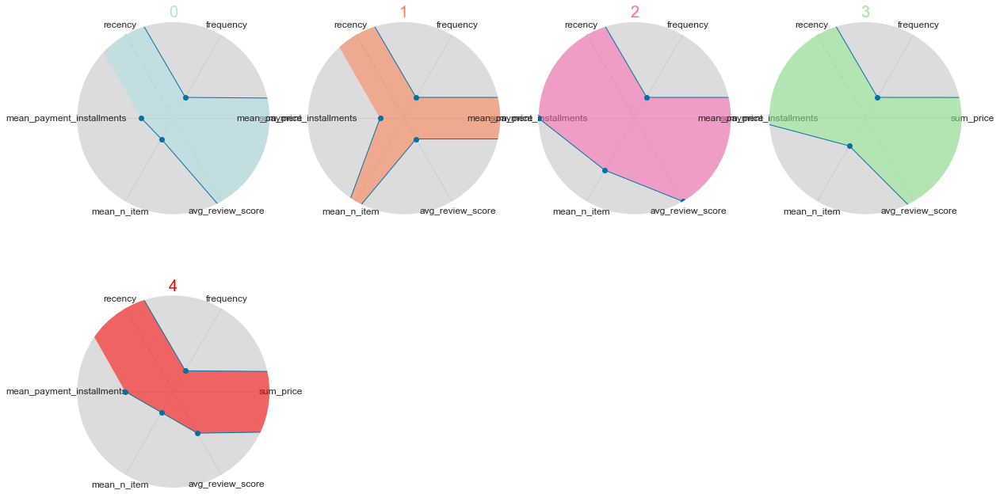

In [168]:
# Radarplot des différents types de client
# ---------------------------------------------------------------------

df_plot = df_fin6.groupby('cluster')[['recency', 'frequency', 'sum_price', 'avg_review_score', 'mean_n_item',
       'mean_payment_installments']].median()
plt.rc('axes', facecolor='Gainsboro')

# number of variable
categories = list(df_plot.columns)

N = len(categories)

# What will be the angle of each axis in the plot? (we divide the plot /
# number of variable)
angles = [n / float(N) * 2 * pi for n in range(N)]


fig = plt.figure(1, figsize=(20, 18))

colors = ['PowderBlue', 'Coral', 'HotPink', 'LightGreen','red','blue']

for i, region in enumerate(df_plot.index):

    ax = fig.add_subplot(3, 4, i+1, polar=True)

    ax.set_theta_offset(2*pi/3)
    ax.set_theta_direction(-1)
    ax.set_rlabel_position(0)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles, categories, size=10)
    plt.yticks(color="grey", size=2)
    values = df_plot.iloc[i].values
    ax.plot(angles, values, 'o-', linewidth=1, linestyle='solid')
    ax.fill(angles, values, colors[i], alpha=0.55)
    ax.set_xticks(angles)
    ax.set_xticklabels(categories, fontsize=12)
    ax.set_title(region, size=20, color=colors[i])
    ax.grid(True)
    plt.grid(True)
    plt.ylim(0, 4)

plt.show()

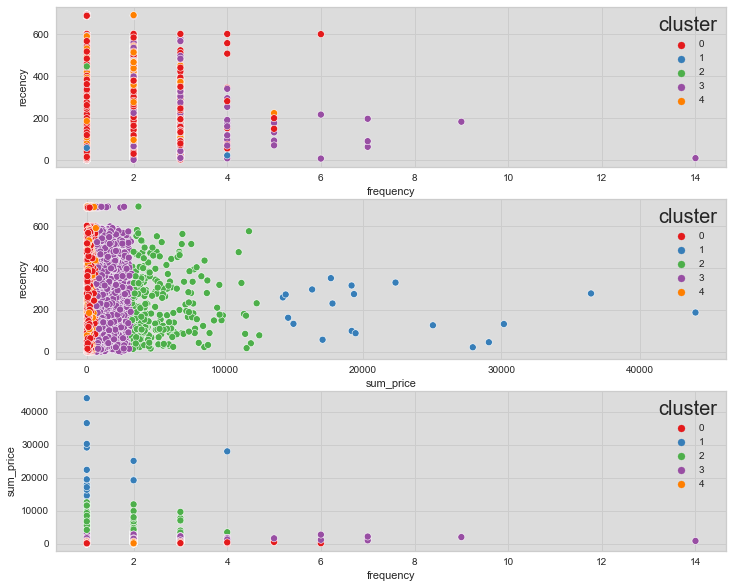

In [169]:
# Scatter plot of each feature 2 by 2
plt.figure(figsize=(12, 10))

# Plot boxplot of recency
plt.subplot(3, 1, 1)
sns.color_palette("Set2")
sns.scatterplot(data=df_fin6,
                y='recency',
                x='frequency',
                hue='cluster',
                palette='Set1')

# Plot distribution of frequency
plt.subplot(3, 1, 2)
sns.scatterplot(data=df_fin6,
                y='recency',
                x='sum_price',
                hue='cluster',
                palette='Set1')

plt.subplot(3, 1, 3)
sns.scatterplot(data=df_fin6,
                y='sum_price',
                x='frequency',
                hue='cluster',
                palette='Set1')
# Show the plot
plt.show()

Analyse des clusters :

**Cluster 0 : client moyen (une seule commande, satisfait)**

  Le plus grand cluster (68782 clients). Clients qui ont commandé une seule fois un seul article en moyenne, la somme de commande est faible, aussi que le nombre d'échéances. La note de satisfaction de ces clients est très bonne (4,7 en moyenne)
  
**Cluster 1 : top clients**

19 clients, meilleurs clients d'un point de vue la frequence et le montant d'achat. Ils achétent plus frequemment et recemment (au moins une commande au cours de dernière année) par rapport aux autres, avec plus grand nombre d'articles par panier (>5 en moyenne), pour les sommes plus importantes (22067 en moyenne). Néanmoins, les avis des ces clients ne sont pas très bons en moyenne, demandent attention.
  
**Cluster 2 : importants**

248 clients avec la plus grosse somme d'achat totale après les top clients (5304 moyenne), leur note de satisfaction est moyenne, ils ont commandé plus qu'une fois, 3 articles par panier en moyenne, avec un nombre important d'écheances.
  
**Cluster 3 : prometteurs**

4220 clients : ils reglent avec plusieurs echeances pour un montant faible, en achetant 2 ou moins articles en moyenne, plus frequemment par rapprt au groupe 0. Leur note de satisfaction est bonne.

**Cluster 4 : clients mécontents**

17942 clients qui ont commandé une seule fois un seul article en moyenne pour une petite somme, mais contrairement au groupe 0 leur note de satisfaction est très faible (2 en moyenne).

## 5. Modélisation : Hierarchical Clustering

In [170]:
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, silhouette_samples, adjusted_rand_score

In [171]:
def plot_dendrogram(model, **kwargs):

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

In [172]:
df_fin_sampl, _ = train_test_split(df_fin, train_size=5000,
                               random_state=123)
ind_samp = df_fin_sampl.index

In [173]:
# Standardisation RobustScaler
scaler = RobustScaler()
df_fin_sampl_scaled = scaler.fit_transform(df_fin_sampl)

# Dataframe
df_fin_samp_scaled = pd.DataFrame(df_fin_sampl_scaled, index=df_fin_sampl.index,
                             columns=df_fin_sampl.columns)

In [174]:
model_hier = AgglomerativeClustering(distance_threshold=0, n_clusters=None,
                                linkage='ward')
model_hier = model_hier.fit(df_fin_sampl_scaled)

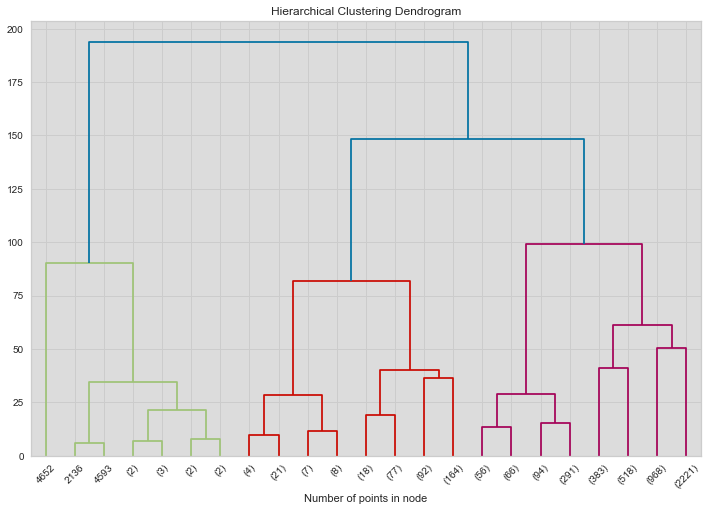

In [175]:
plt.figure(figsize=(12, 8))
plt.title('Hierarchical Clustering Dendrogram')
# plot the top four levels of the dendrogram
plot_dendrogram(model_hier, truncate_mode='level', p=4)
plt.xlabel("Number of points in node")
plt.show()

In [176]:
n_clus = 6

In [177]:
model_hier = AgglomerativeClustering(n_clusters=6)
ag_clusters = model_hier.fit_predict(df_fin_sampl_scaled)

In [178]:
silhouette_avg = silhouette_score(df_fin_sampl_scaled, ag_clusters)
sample_silhouette_values = silhouette_samples(df_fin_sampl_scaled, ag_clusters)

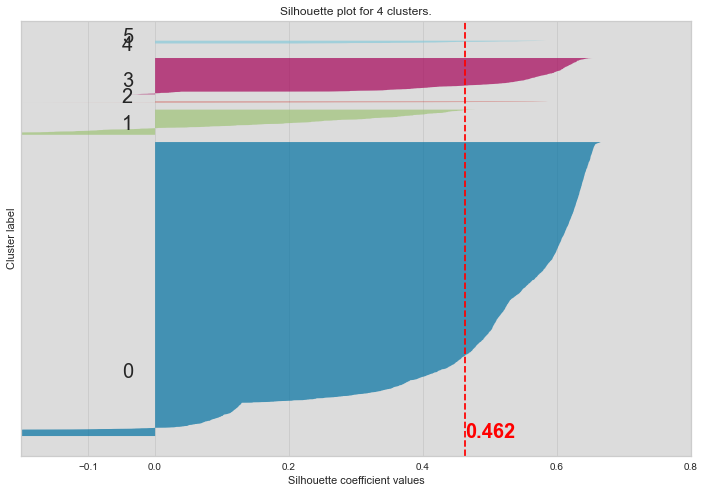

In [179]:
fig, ax1 = plt.subplots(figsize=(12, 8))
ax1.set_xlim([-0.2, 0.8])

y_lower = 10
for i in range(6):
    # Aggreg and sort the silhouette scores for samples belonging to cluster i
    ith_cluster_silhouette_values = sample_silhouette_values[ag_clusters == i]
    ith_cluster_silhouette_values.sort()
    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i

    ax1.fill_betweenx(np.arange(y_lower, y_upper),
                      0, ith_cluster_silhouette_values,
                       alpha=0.7)

    # Label the silhouette plots with their cluster numbers at the middle
    ax1.text(-0.05, y_lower + 0.2 * size_cluster_i, str(i))

    # Compute the new y_lower for next plot
    y_lower = y_upper + 100

ax1.set_title("Silhouette plot for {} clusters.".format(4))
ax1.set_xlabel("Silhouette coefficient values")
ax1.set_ylabel("Cluster label")

# The vertical line for average silhouette score of all the values
ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
ax1.text(x=silhouette_avg, y=-10, s=round(silhouette_avg, 3),
         color='red', weight='bold')

ax1.set_yticks([])
ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8])
plt.show()

In [180]:
results = pd.DataFrame(np.zeros([2, 3]),
                       index=['NB of Clusters', 'Silhouette Score'],
                       columns=['Hierarchical', 'K-means','DB Scan'])
results['Hierarchical'] = [n_clus, round(silhouette_avg, 3)]
results

,Hierarchical,K-means,DB Scan
NB of Clusters,6.000,0.0,0.0
Silhouette Score,0.462,0.0,0.0


## 6. Density-based Clustering (DBSCAN)

In [181]:
from sklearn.cluster import DBSCAN

In [208]:
N_clusters = []
Noise = []
Sil_score = []
for dist in np.arange(0.5, 4, 0.2):
    db = DBSCAN(eps=dist, min_samples=100, algorithm='kd_tree', n_jobs=-1)
    db.fit(df_fin_sampl_scaled)
    n_clusters_ = len(set(db.labels_)) - (1 if -1 in db.labels_ else 0)
    n_noise_ = list(db.labels_).count(-1)
    N_clusters.append(n_clusters_)
    Noise.append(n_noise_/df_fin_sampl_scaled.shape[0])
    Sil_score.append((silhouette_score(df_fin_sampl_scaled, db.labels_)
                      if n_clusters_ > 1 else 0))

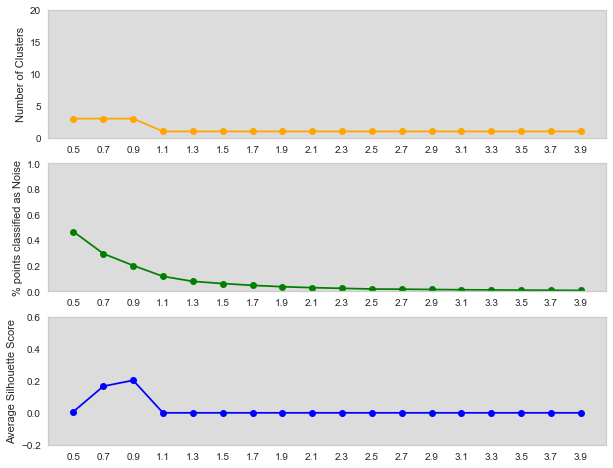

In [209]:
fig, ax = plt.subplots(3, 1, figsize=(10, 8))
ax[0].plot(np.arange(0.5, 4, 0.2), N_clusters, marker='o', c='orange')
ax[1].plot(np.arange(0.5, 4, 0.2), Noise, marker='o', c='green')
ax[2].plot(np.arange(0.5, 4, 0.2), Sil_score, marker='o', c='blue')

for i in range(3):
    ax[i].grid()
    ax[i].set_xticks(np.arange(0.5, 4, 0.2))
ax[0].set_ylim(0, 20)
ax[0].set_ylabel('Number of Clusters')
ax[1].set_ylim(0, 1)
ax[1].set_ylabel('% points classified as Noise')
ax[2].set_ylim(-0.2, 0.6)
ax[2].set_ylabel('Average Silhouette Score')

plt.show()

The silhouette score seems maximal for epislon=0.9

In [232]:
db = DBSCAN(eps=0.9, min_samples=100, algorithm='kd_tree', n_jobs=-1)
db.fit(df_fin_sampl_scaled)

DBSCAN(algorithm='kd_tree', eps=0.9, min_samples=100, n_jobs=-1)

In [233]:
n_clusters_ = len(set(db.labels_)) - (1 if -1 in db.labels_ else 0)
n_noise_ = list(db.labels_).count(-1)
print('Nb of clusters:', n_clusters_,
      '\nNoise Ratio : {}%'.format(100*n_noise_/df_fin_sampl_scaled.shape[0]))

Nb of clusters: 3 
Noise Ratio : 20.18%


<AxesSubplot:>

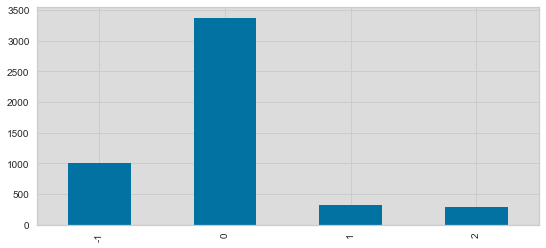

In [234]:
# Répartition des clients dans les clusters
pd.Series(db.labels_).value_counts().sort_index().plot.bar(figsize=(9, 4))

In [235]:
cluster_labels = db.labels_
n_clus = len(set(db.labels_))

In [236]:

silhouette_avg = silhouette_score(df_fin_sampl_scaled, cluster_labels)
sample_silhouette_values = silhouette_samples(df_fin_sampl_scaled, cluster_labels)

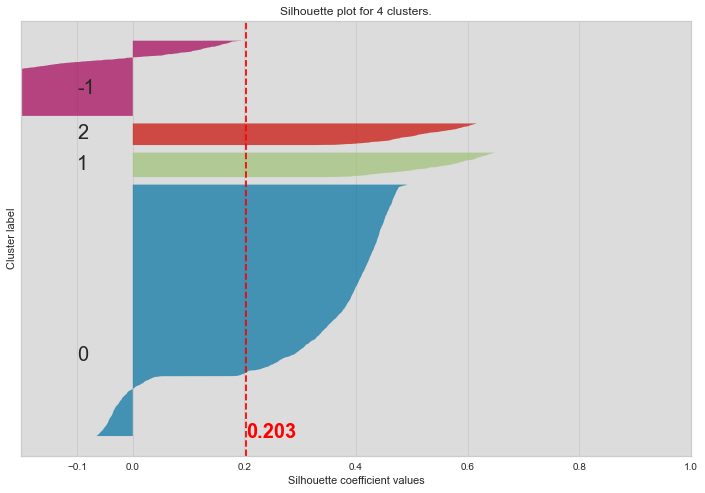

In [237]:
fig, ax1 = plt.subplots(figsize=(12, 8))
ax1.set_xlim([-0.2, 1])

y_lower = 10
for i in list(set(db.labels_)):
    # Aggregate the silhouette scores for samples belonging to cluster i
    ith_clus_sil_values = sample_silhouette_values[cluster_labels == i]
    ith_clus_sil_values.sort()
    size_cluster_i = ith_clus_sil_values.shape[0]
    y_upper = y_lower + size_cluster_i

    ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_clus_sil_values,
                       alpha=0.7)

    # Label the silhouette plots with their cluster numbers at the middle
    ax1.text(-0.1, y_lower + 0.3 * size_cluster_i, str(i))

    # Compute the new y_lower for next plot
    y_lower = y_upper + 100

ax1.set_title("Silhouette plot for {} clusters.".format(n_clus))
ax1.set_xlabel("Silhouette coefficient values")
ax1.set_ylabel("Cluster label")

# The vertical line for average silhouette score of all the values
ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
ax1.text(x=silhouette_avg, y=-10, s=round(silhouette_avg, 3),
         color='red', weight='bold')

ax1.set_yticks([])
ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
plt.show()

In [238]:
results['DB Scan'] = [n_clus, round(silhouette_avg, 3)]
results

,Hierarchical,K-means,DB Scan
NB of Clusters,6.000,0.0,4.000
Silhouette Score,0.462,0.0,0.203


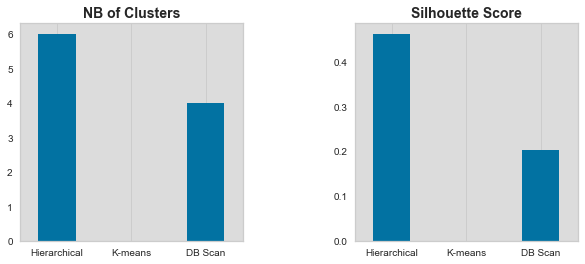

In [239]:
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
for i in range(2):
    results.iloc[i].plot.bar(ax=ax[i])
    ax[i].tick_params('x', labelrotation=0)
    ax[i].grid(axis='y')
    ax[i].set_title(results.index[i], fontsize=14, weight='bold')
fig.subplots_adjust(wspace=0.5)
plt.show()

## 7. Stabilité de clusters (modèle K-means, 6 variables)

In [192]:
df.head()

,customer_unique_id,last_purchase_date,recency,frequency,mean_price,sum_price,geolocation_lat,geolocation_lng,mean_delivery_days,mean_delivery_late,avg_review_score,mean_n_item,main_product_category,main_payment_type,mean_payment_installments,customer_city
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,112,1,141.90,141.90,-23.340235,-46.830140,6.0,False,5.0,1.0,home,credit_card,8.0,cajamar
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,115,1,27.19,27.19,-23.559115,-46.787626,3.0,False,4.0,1.0,health_beauty,credit_card,1.0,osasco
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,537,1,86.22,86.22,-27.542880,-48.633426,25.0,False,3.0,1.0,other,credit_card,8.0,sao jose
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,321,1,43.62,43.62,-1.312214,-48.483159,20.0,False,4.0,1.0,high_technology,credit_card,4.0,belem
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,288,1,196.89,196.89,-23.505548,-47.469705,13.0,False,5.0,1.0,high_technology,credit_card,6.0,sorocaba


In [193]:
df['last_purchase_date'] = pd.to_datetime(df['last_purchase_date'],
                                    format='%Y-%m-%d %H:%M:%S')

In [194]:

t_first = df['last_purchase_date'].min()
t_last = df['last_purchase_date'].max()

print("First command of the order database: ", t_first)
print("Last command of the order database: ", t_last)

First command of the order database:  2016-10-03 16:56:50
Last command of the order database:  2018-08-29 15:00:37


In [195]:
import datetime

In [196]:
from sklearn import metrics

In [197]:
# Function to create client dataset from a specific date
def time_selection(date_limit, df):
    mask = df['last_purchase_date'] <= date_limit
    df = df.loc[mask]

    # Snapshot of the last order timestamp
    snapshot_date_ref = df['last_purchase_date']\
        .max() + timedelta(days=1)

    # Clustering model features caculating
    df = df.groupby(['customer_unique_id']).apply(lambda x: pd.Series({
        'recency': (snapshot_date_ref
                    - x['last_purchase_date'].max()).days,
        'frequency': x['frequency'].count(),
        'sum_price': x['sum_price'].sum(),
        'avg_review_score': x['avg_review_score'].mean(),
        'mean_n_item': x['mean_n_item'].mean(),
        'mean_payment_installments': x['mean_payment_installments'].mean(),

    }))


    return(df)

2017-04-21 16:56:50
(6130, 6)
Days later: 0
ARi:  1.0 

2017-05-21 16:56:50
(9054, 6)
Days later: 30
ARi:  0.99 

2017-06-20 16:56:50
(12168, 6)
Days later: 60
ARi:  0.98 

2017-07-20 16:56:50
(15338, 6)
Days later: 90
ARi:  0.99 

2017-08-19 16:56:50
(19038, 6)
Days later: 120
ARi:  0.98 

2017-09-18 16:56:50
(22802, 6)
Days later: 150
ARi:  0.96 

2017-10-18 16:56:50
(26837, 6)
Days later: 180
ARi:  0.91 

2017-11-17 16:56:50
(31065, 6)
Days later: 210
ARi:  0.92 

2017-12-17 16:56:50
(38877, 6)
Days later: 240
ARi:  0.92 

2018-01-16 16:56:50
(43969, 6)
Days later: 270
ARi:  0.92 

2018-02-15 16:56:50
(50267, 6)
Days later: 300
ARi:  0.92 

2018-03-17 16:56:50
(56962, 6)
Days later: 330
ARi:  0.89 

2018-04-16 16:56:50
(63265, 6)
Days later: 360
ARi:  0.89 

2018-05-16 16:56:50
(70735, 6)
Days later: 390
ARi:  0.89 

2018-06-15 16:56:50
(76034, 6)
Days later: 420
ARi:  0.89 

2018-07-15 16:56:50
(81188, 6)
Days later: 450
ARi:  0.9 

2018-08-14 16:56:50
(88705, 6)
Days later: 480
AR

Text(0, 0.5, 'ARI')

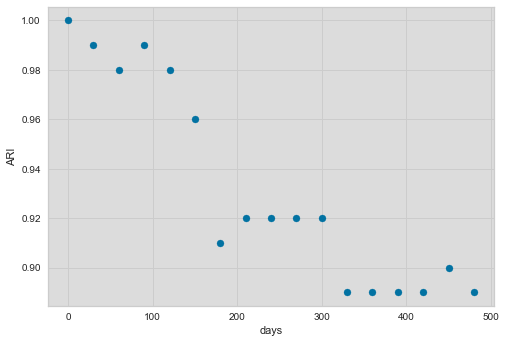

In [198]:
# Algorithme to check etime stability
model_fin = KMeans(n_clusters=5,
                   random_state=123)
# Initialisation
T0 = df['last_purchase_date'].min() \
    + datetime.timedelta(days=200)

F0 = time_selection(date_limit=T0,
                    df=df)

scaler = RobustScaler()

F0_scaled = scaler.fit_transform(F0)

kmeans = model_fin


ari_list = []
day_list = []

max_days = (df['last_purchase_date'].max() - T0).days

# Loop on every 15 days
for day in np.arange(0, max_days + 1, 30):

    T1 = T0 + datetime.timedelta(days=np.float64(day))
    print(T1)

    day_list.append(day)

    F1 = time_selection(date_limit=T1,
                        df=df)
    print(F1.shape)

    F1_scaled = scaler.fit_transform(F1)

    C1_new = kmeans.fit_predict(F1_scaled)

    M0 = kmeans.fit(F0_scaled)
    C1_init = M0.predict(F1_scaled)

    ari = round(metrics.adjusted_rand_score(C1_new,
                                            C1_init),
                2)

    print('Days later:', day)
    print('ARi: ', ari, '\n')

    ari_list.append(ari)

plt.scatter(x=day_list,
            y=ari_list)
plt.xlabel('days')
plt.ylabel('ARI')

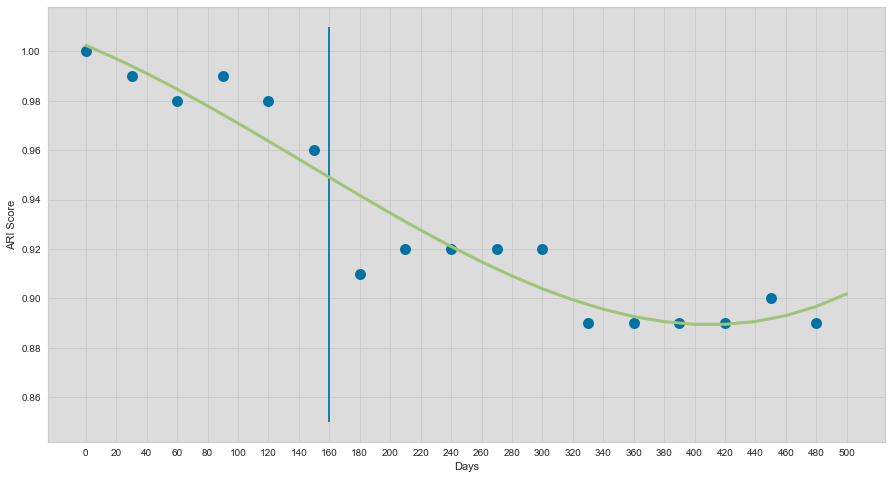

In [199]:
# Visualisation of ARI time evolution

plt.figure(figsize=(15, 8))
plt.plot(day_list, ari_list, 'o', ms=11)

model1 = np.poly1d(np.polyfit(day_list, ari_list, 3))
polyline = np.arange(0, 520, 20)

plt.plot(polyline,
         model1(polyline),
         '-',
         linewidth=3)

plt.vlines(x=160, ymin=.85, ymax=1.01)

plt.ylabel("ARI Score")
plt.xlabel("Days")
plt.xticks(np.arange(0, 520, 20))
plt.show()

Les prédictions sont stables, Ari score ne baisse pas en dessous de 0.8, il est néanmoins conseillé de mettre à jour le modèle chaque 5-6 mois (baisse de score).

2017-01-11 16:56:50
(295, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 0
ARi:  1.0 

2017-02-10 16:56:50
(1554, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 30
ARi:  0.58 

2017-03-12 16:56:50
(3248, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 60
ARi:  0.41 

2017-04-11 16:56:50
(5528, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 90
ARi:  0.9 

2017-05-11 16:56:50
(7996, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 120
ARi:  0.94 

2017-06-10 16:56:50
(11157, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 150
ARi:  0.93 

2017-07-10 16:56:50
(14015, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 180
ARi:  0.94 

2017-08-09 16:56:50
(17754, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 210
ARi:  0.91 

2017-09-08 16:56:50
(21436, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 240
ARi:  0.9 

2017-10-08 16:56:50
(25343, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 270
ARi:  0.87 

2017-11-07 16:56:50
(29386, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 300
ARi:  0.85 

2017-12-07 16:56:50
(37061, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 330
ARi:  0.84 

2018-01-06 16:56:50
(41597, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 360
ARi:  0.85 

2018-02-05 16:56:50
(48152, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 390
ARi:  0.85 

2018-03-07 16:56:50
(54882, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 420
ARi:  0.85 

2018-04-06 16:56:50
(61279, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 450
ARi:  0.83 

2018-05-06 16:56:50
(67864, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 480
ARi:  0.83 

2018-06-05 16:56:50
(73870, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 510
ARi:  0.83 

2018-07-05 16:56:50
(79933, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 540
ARi:  0.83 

2018-08-04 16:56:50
(86001, 6)


C:\Users\mfila\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Days later: 570
ARi:  0.83 



Text(0, 0.5, 'ARI')

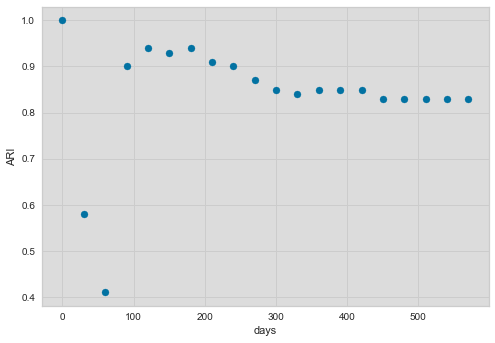

In [200]:
# Algorithme to check etime stability
model_fin = KMeans(n_clusters=5,
                   random_state=123)
# Initialisation
T0 = df['last_purchase_date'].min() \
    + datetime.timedelta(days=100)

F0 = time_selection(date_limit=T0,
                    df=df)

scaler = RobustScaler()

F0_scaled = scaler.fit_transform(F0)

kmeans = model_fin


ari_list = []
day_list = []

max_days = (df['last_purchase_date'].max() - T0).days

# Loop on every 15 days
for day in np.arange(0, max_days + 1, 30):

    T1 = T0 + datetime.timedelta(days=np.float64(day))
    print(T1)

    day_list.append(day)

    F1 = time_selection(date_limit=T1,
                        df=df)
    print(F1.shape)

    F1_scaled = scaler.fit_transform(F1)

    C1_new = kmeans.fit_predict(F1_scaled)

    M0 = kmeans.fit(F0_scaled)
    C1_init = M0.predict(F1_scaled)

    ari = round(metrics.adjusted_rand_score(C1_new,
                                            C1_init),
                2)

    print('Days later:', day)
    print('ARi: ', ari, '\n')

    ari_list.append(ari)

plt.scatter(x=day_list,
            y=ari_list)
plt.xlabel('days')
plt.ylabel('ARI')

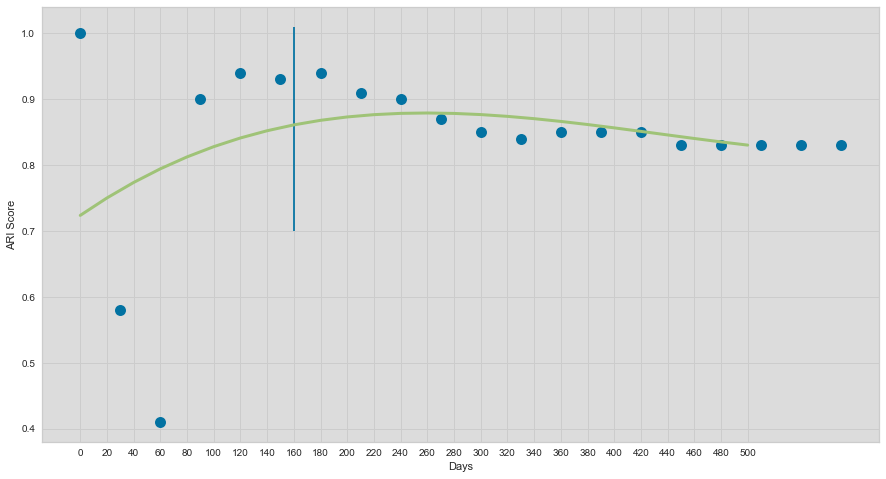

In [201]:
# Visualisation of ARI time evolution

plt.figure(figsize=(15, 8))
plt.plot(day_list, ari_list, 'o', ms=11)

model1 = np.poly1d(np.polyfit(day_list, ari_list, 3))
polyline = np.arange(0, 520, 20)

plt.plot(polyline,
         model1(polyline),
         '-',
         linewidth=3)

plt.vlines(x=160, ymin=.7, ymax=1.01)

plt.ylabel("ARI Score")
plt.xlabel("Days")
plt.xticks(np.arange(0, 520, 20))
plt.show()